In this post, I'm going to try and see if I can elicit any relationships between the explanatory features and the explained features (expenditure).

This part of the project serves to aid in getting to actually know the data, and in hypothesis making, hypothesis refinement, and model selection; it essentially lays the foundation for the "story" that the project will tell.

I find this stage of the modeling process to be one of the most interesting. It's hard to know if and how your priors about the problem you're looking at will influence the modeling process - I think they almost certainly do. At the same time, there's a great deal of dramatic tension - will my hunch about the problem be supported by the data or will the data show me that it's completely false? Will another insight rise to take it's place? Will there be any story at all? All of these outcomes are entirely possible at this stage, and it's quite nerve wracking.

In any case, I can do my best by examining the data for as much supporting (or refuting) evidence in as objective a manner as possible.

Here are some of the questions I'm hoping to answer at the end of this post:

1. What explanatory features are predictive (if any)?
2. What explains the statistical variation in the dataset? What does the randomness look like? Is there a pattern? Surely it's not all just white noise!
3. Which features are mutually correlated? Do features combine to create stronger or weaker relationships?





Next, we've accumulated a lot of boilerplate code that I need to load to start up my modeling session at this point. Rather than subject you to a lot of scrolling, I'm simply going to save it to a python module called blogging.py, and import it in one step. If you'd like to take a look at the environment I'm importing to build the analysis in this post, it's [here](https://github.com/soumyadsanyal/dsm).

In [1]:
from blogging import *

The next step in my analysis is to explore the data a bit more. I want to see if I can get any more insight into what the underlying data generating process is; the more I can rely on a clean look at the data, the better I'll be able to dispel my own incorrect assumptions about what is or should be happening.

One problem I do have to contend with in working with this dataset is that it comes as weighted survey data. Working with weighted data can be quite tricky. In the very first instance, since the unweighted data does not (by definition) accurately represent the population of interest, it's impossible to draw valid inferences from the standard exploratory (or even regression) procedure without accounting for the weights.

When constructing summary data, as in a histogram, or constructing a linear function of the data, this is not much of a problem. Any linear function $f(x)$ of the data is just as easy to compute as $f(Wx)$, where $W$ is a weight matrix, and variances will just be quadratic in $W$ as expected. However, there are myriad other challenges in working with weighted data; there's a relatively recent discussion of some of these challenges in this [paper](http://www.stat.columbia.edu/~gelman/research/published/STS226.pdf) by Andrew Gelman.

For my immediate purposes - my Insight project - the challenge was to come up with some rough and ready ways to accommodate these weights. While the histogram methods in the Python ecosystem have options for specifying item level weights, not all EDA function calls do. In particular, scatterplots don't (as far as I know). Most model estimation calls that I looked into before starting this project did have some accommodations for item weights, so I figured that if I could get past the EDA stage, I might be fine.

I needed to find a way of getting a sense of the pairwise correlations in the dataset while accounting for the weights. In the end, I found that matplotlib hexbin plots had some support for item weights, and I figured that adding the weighted sum of points to hexbin cells would do well enough without my having to write my own visualization functions. In the end, this is what I constructed:

In [2]:
def look_at_pairs(x, y, x_range, y_range, w, colorbar=False, gridsize=200, bins=100, mincount=None):
    x_min, x_max= x_range[0], x_range[1]
    y_min, y_max = y_range[0], y_range[1]
    plt.hexbin(x, y, C = w, gridsize = gridsize, bins = bins,
       xscale = 'linear', yscale = 'linear',
       cmap=None, norm=None, vmin=None, vmax=None,
       alpha=1, linewidths=None, edgecolors='none',
       reduce_C_function = np.sum, mincnt=mincount, marginals=False,
          )
    plt.ylim([y_min,y_max])
    plt.xlim([x_min,x_max])
    plt.xlabel(x.name)
    plt.ylabel(y.name)
    if colorbar:
        plt.colorbar()
    plt.show()


Let's try this out on a an example pair of features.

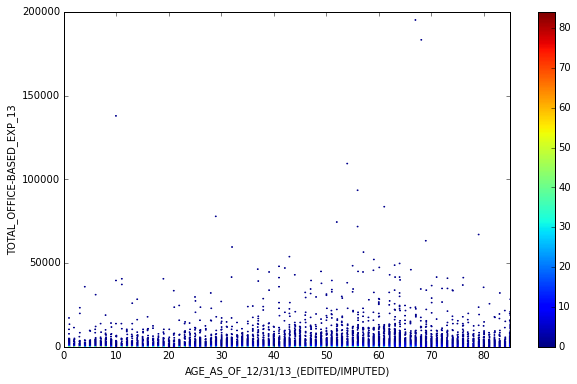

In [3]:
look_at_pairs(x=data["AGE_AS_OF_12/31/13_(EDITED/IMPUTED)"], 
              y=data["TOTAL_OFFICE-BASED_EXP_13"], 
              x_range=[0,85], 
              y_range=[0,200000],
              w=data["FINAL_PERSON_WEIGHT_2013"],
              colorbar=True,
              gridsize=500,
              bins=85,
             )

In this graph, greater (weighted) mass in any one hexbin results in a higher color count (according to the colorbar scale on the right). More tightly packed data results in a greater plot density.

There looks to be a general tendency for older people to spend more on office based services in this picture, but my sense of the trend is obscured by the outliers above 100k. Of these outliers, most are in the 70-80 year range, with one below 20 years. There's not enough data for me to make a robust case about whether age correlates well with the incidence of really high expenditure, so I'm going to try looking at this again after cutting off the outliers.

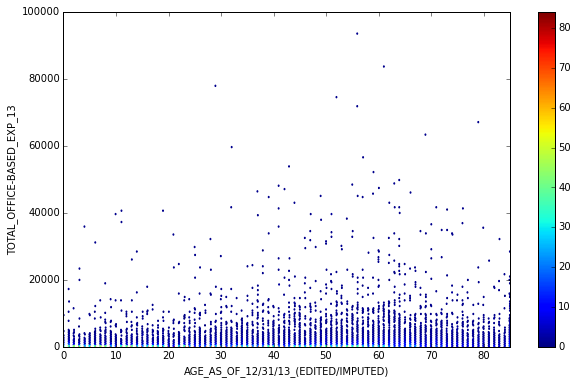

In [4]:
look_at_pairs(x=data["AGE_AS_OF_12/31/13_(EDITED/IMPUTED)"], 
              y=data["TOTAL_OFFICE-BASED_EXP_13"], 
              x_range=[0,85], 
              y_range=[0,100000],
              w=data["FINAL_PERSON_WEIGHT_2013"],
              colorbar=True,
              gridsize=500,
              bins=85,
             )

This is helpful. It looks like a lot of weighted mass (the aqua region at the bottom) is concentrated near zero expenditure. However, it highlights the fact that expenditure trends higher with age (as does variance in expenditure).

It looks like this is a fairly useful visualization technique as far as quick and dirty goes.

Here are the other groups of correlations I want to inspect:

1. Income
2. Utilization
3. Health conditions
4. Duration without insurance
5. Age of diagnosis
6. BMI
7. Demographic information
8. Expenditures.

I also want to look at the four expenditure categories at the same time. Here's a quick method to help me do that:

In [5]:
def four_correlations(x,
                      x_range,
                      w,
                      xticks=None,
                      office_range=[0,100000],
                      outpatient_range=[0,26000],
                      inpatient_range=[0,320000],
                      er_range=[0,70000],
                      colorbar=False, 
                      gridsize=200, 
                      bins=100, 
                      mincount=None):
    
    term=x.name
    plt.figure(figsize=(15,15))
    
    for pos,y in [(1,data["TOTAL_OFFICE-BASED_EXP_13"]),
                  (2,data["TOTAL_OUTPATIENT_PROVIDER_EXP_13"]),
                  (3, data["TOT_HOSP_IP_FACILITY_+_DR_EXP_13"]),
                  (4, data["TOTAL_ER_FACILITY_+_DR_EXP_13"]),
                 ]:
        plt.subplot(2,2,pos)
        plt.hexbin(x,
                   y,
                   C = w,
                   gridsize = gridsize,
                   bins = bins,
                   xscale = 'linear',
                   yscale = 'linear',
                   cmap=None,
                   norm=None,
                   vmin=None,
                   vmax=None,
                   alpha=1,
                   linewidths=None,
                   edgecolors='none',
                   reduce_C_function = np.sum,
                   mincnt=mincount,
                   marginals=False,
                   )
        plt.title(y.name)

        if pos==1:
            plt.ylim(office_range)
        if pos==2:
            plt.ylim(outpatient_range)
        if pos==3:
            plt.ylim(inpatient_range)
        if pos==4:
            plt.ylim(er_range)
            
        plt.xlim(x_range)
        plt.xlabel(term)
        
        if xticks:
            plt.xticks(xticks[0],[thing.replace("NON-HISPANIC ","")[:15] for thing in xticks[1]], rotation=40)
        if colorbar:
            plt.colorbar()
        
        
    plt.tight_layout()
    plt.show()
    
    

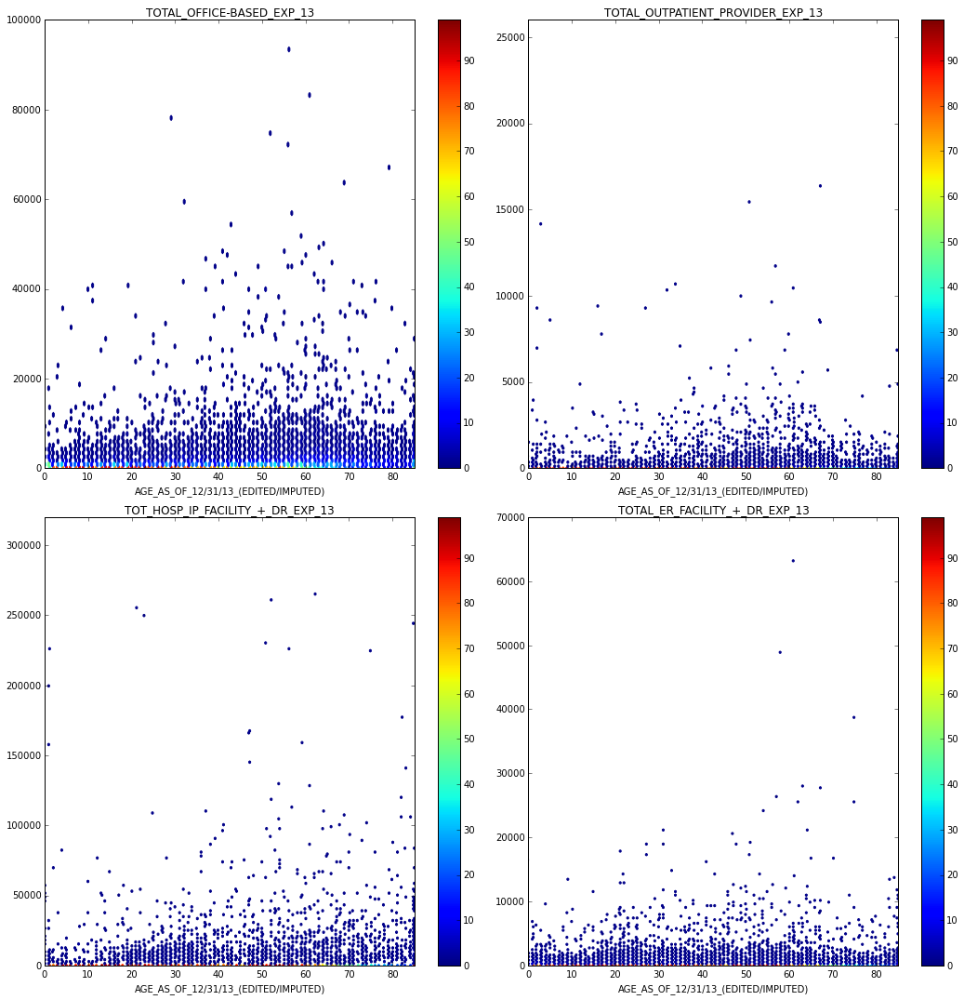

In [6]:
four_correlations(data["AGE_AS_OF_12/31/13_(EDITED/IMPUTED)"], x_range=[0,85], w=data["FINAL_PERSON_WEIGHT_2013"],
                 colorbar=True,)

It looks like the same pattern holds for the other expenditure categories as for office expenditure when it comes to age.

Looking at income:

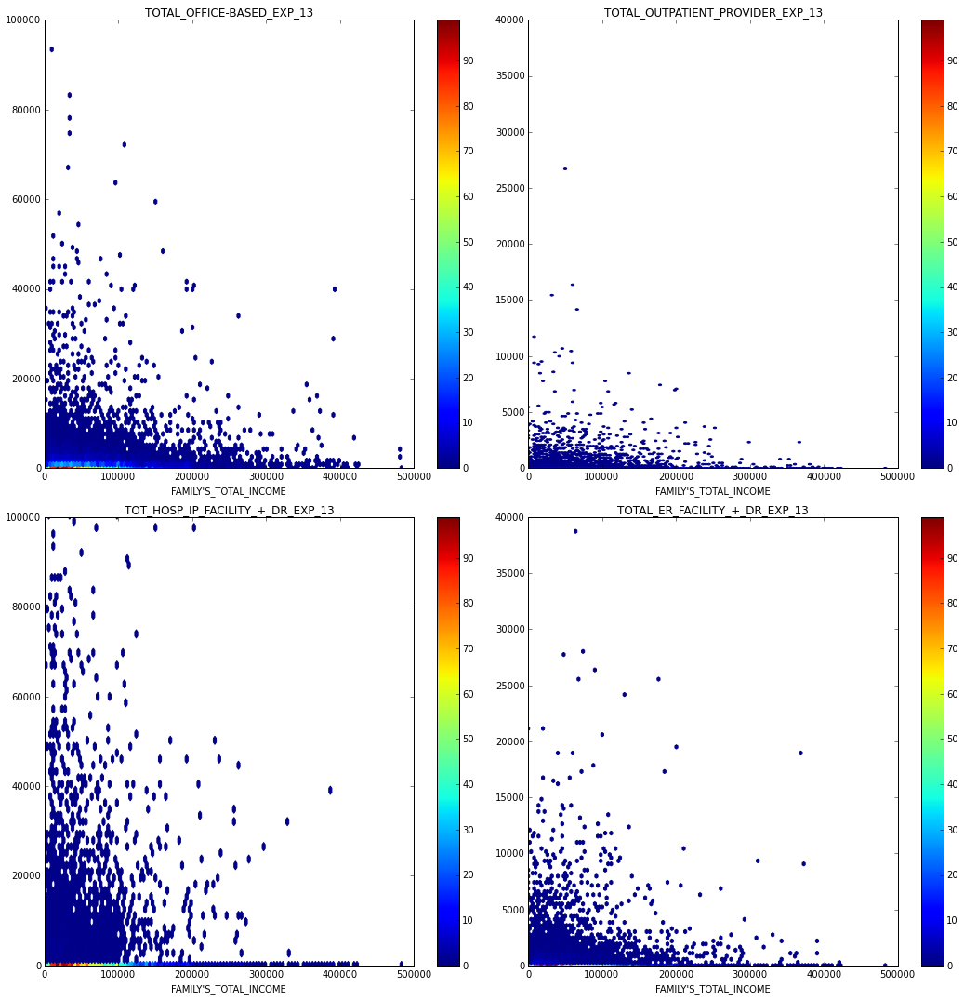

In [7]:
four_correlations(data["FAMILY\'S_TOTAL_INCOME"],
                  x_range=[0,500000],
                  w=data["FINAL_PERSON_WEIGHT_2013"],
                  office_range=[0,100000],
                  outpatient_range=[0,40000],
                  inpatient_range=[0,100000],
                  er_range=[0,40000],
                 colorbar=True)

Here you get the result that while the level of spending moves away from zero as income rises, the variance of expenditure in all four categories declines with income. An important question is whether the reduced variation in spending at higher incomes is simply a result of having fewer people at those income levels, or if there is a systematic effect (more effective health management, better bargaining power).

Looking at how utilization correlates with expenditure:

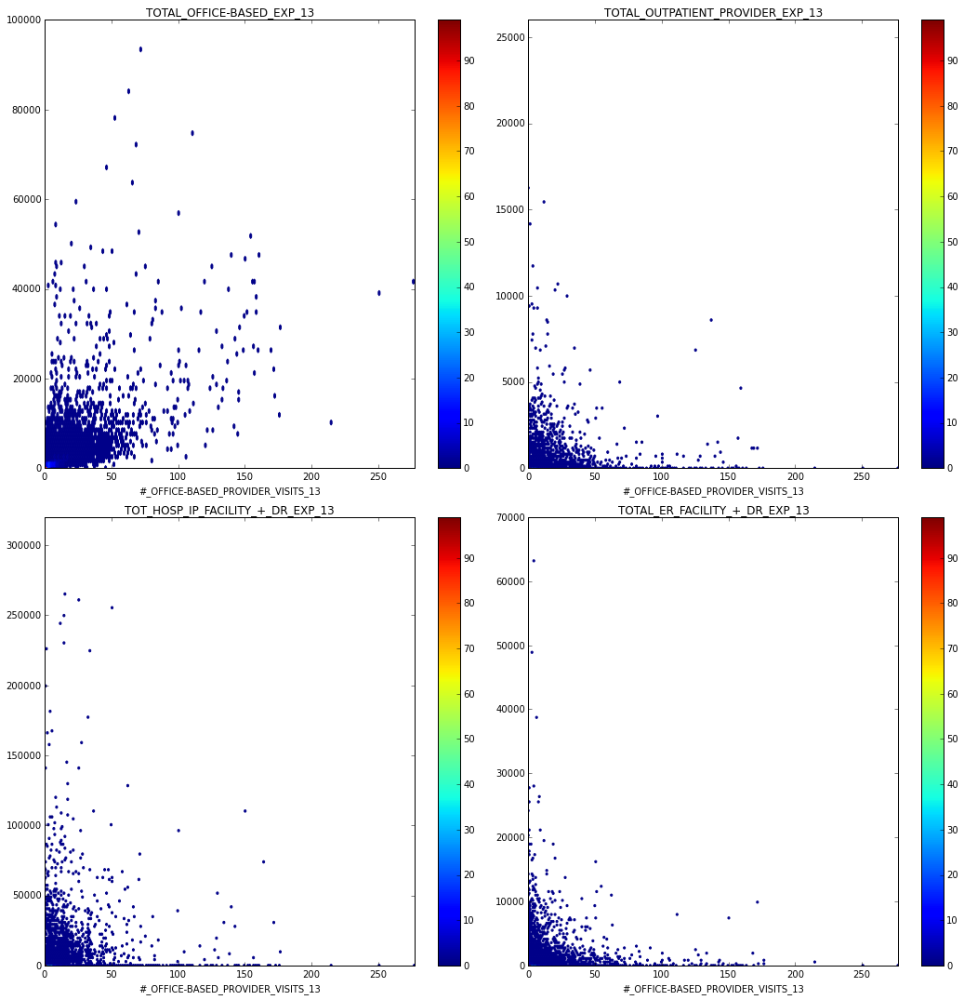

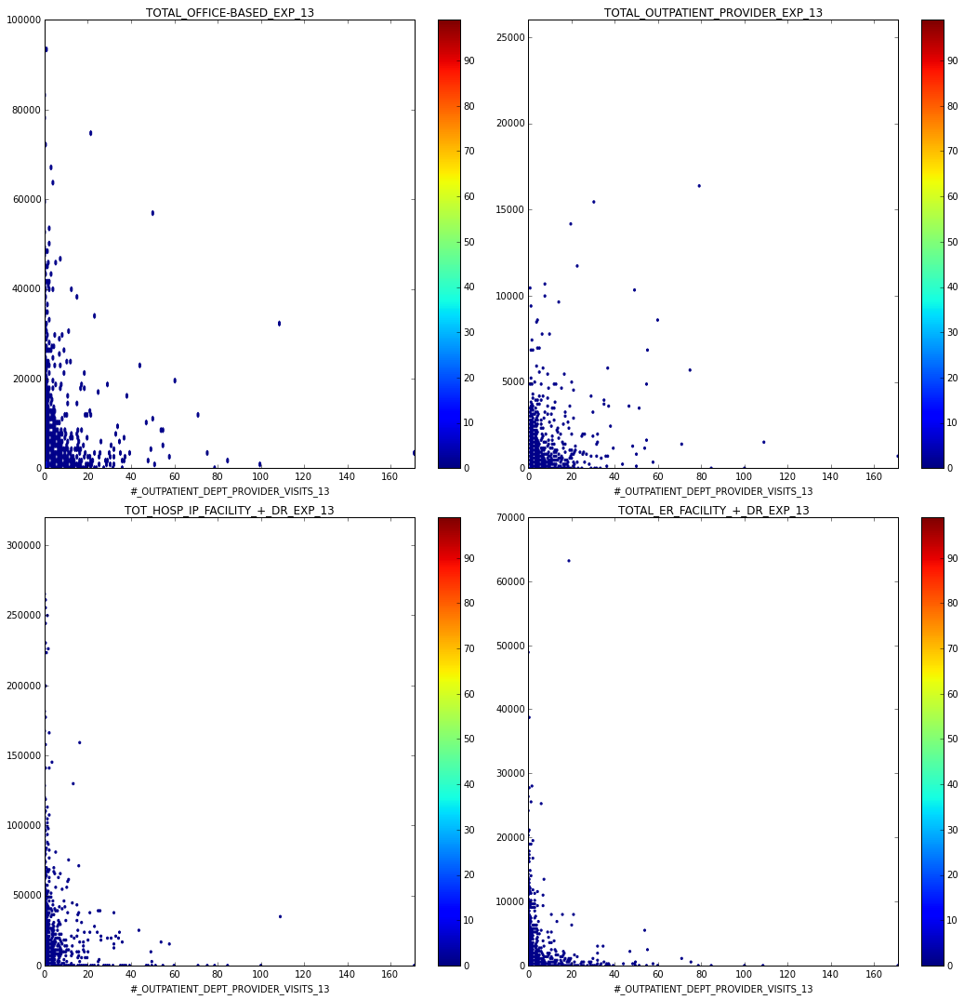

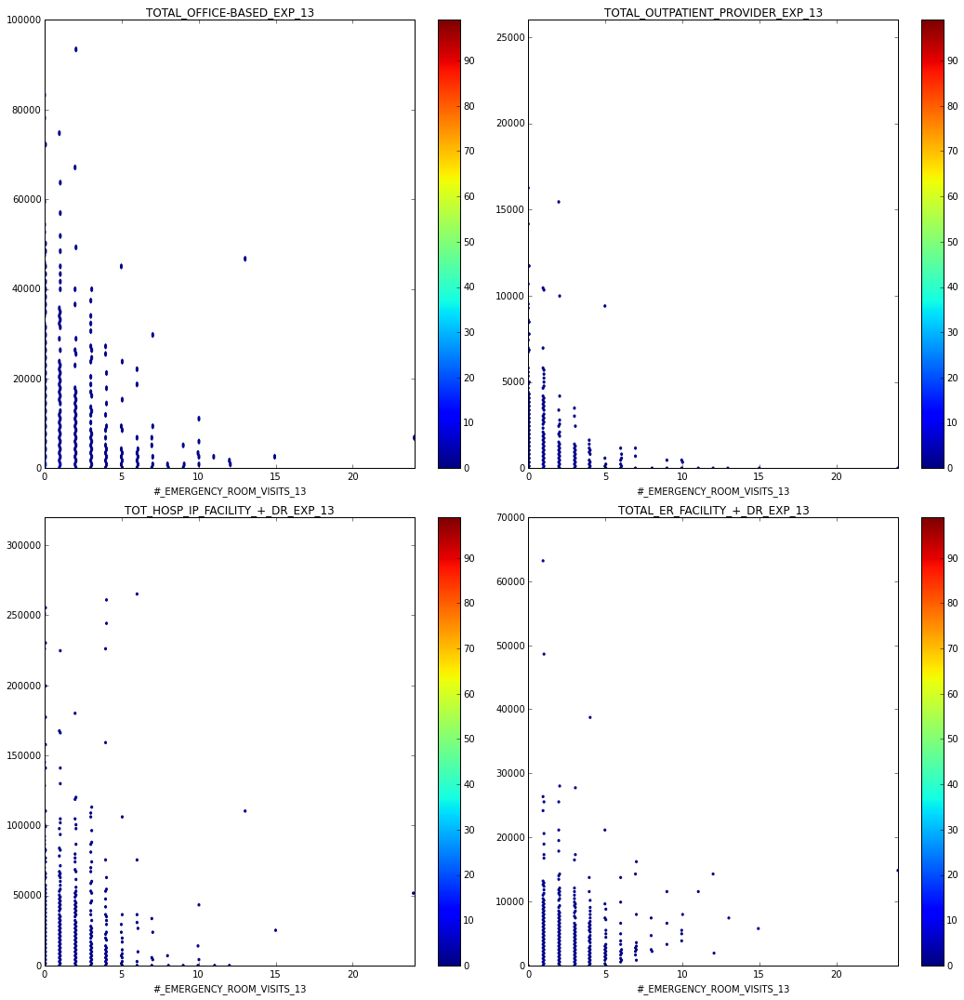

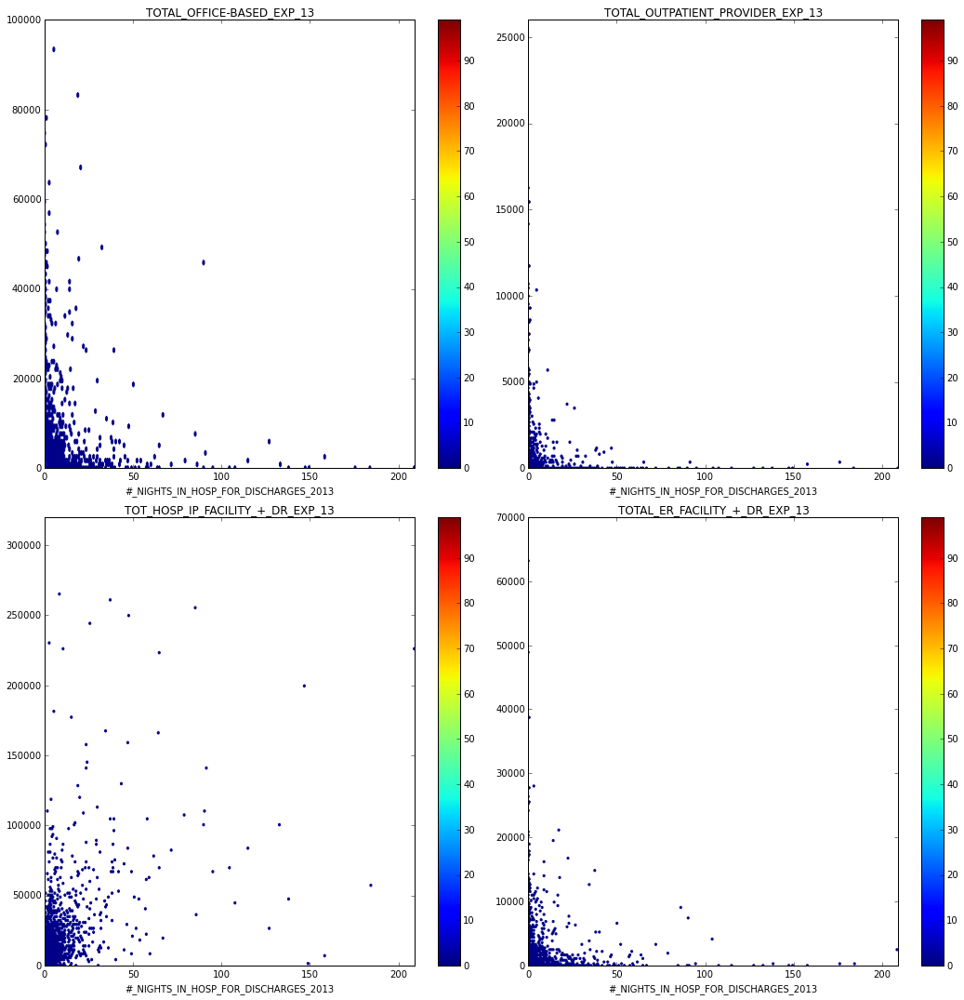

In [8]:
for term in utilizations:
    x_min=data[term].min()
    x_max=data[term].max()
    x_range=[x_min,x_max]
    four_correlations(data[term], x_range=x_range, w=data["FINAL_PERSON_WEIGHT_2013"],
                     colorbar=True)
    print("\n\n\n")

I get the following out of these plots:

1. Office based utilization and expenditure are positively correlated. Office based utilization is negatively correlated with all other expenditure.
2. Outpatient utilization doesn't strongly correlate with outpatient expenditure. Outpatient utilization correlates somewhat negatively with other categories of expenditure.
3. ER visits correlate negatively with other expenditures, and not particularly at all with ER expenditure.
4. Inpatient visits correspond positively with inpatient utilization, and negatively with all other expenditure.

Next, I'll look at chronic health diagnoses. There are over 40 in my list, so it'll be useful to break them into groups.

Before we take a look at these plots, I want to quickly mention a very counterintuitive finding that I came across when I looked at these. For many of these chronic conditions, the subpopulation that does *not* have a positive diagnosis has a much heavier right tail than the subpopulation *with* the chronic condition.

On the face of it, it looked like people overall were at greater risk of spending *more* if they did not have a chronic illness than if they did. The paradox disappears when you zoom in on these plots around the first $\$10,000$ spent; it shows that many more people without a chronic condition are clustered at $\$0$ spent, relatively speaking. It's interesting to conjecture what may cause the thinner tails for chronic sufferers - one explanation may just be that the larger subpopulation is naturally accompanied by a larger variance.

The plots below shows the scatterplots to this limited scale for emphasis.

In [9]:
cancer=[term for term in health if "CANCER" in term]
lung=[term for term in health if "LUNG" in term or "BRONCH" in term or "ASTHMA" in term
     or "EMPHYSEMA" in term
     or "INH" in term]
cardio=[term for term in health if "BLOOD" in term or "CHOLESTEROL" in term or "CORON" in term or "HEART" in term
       or "STROKE" in term
       or "DIABETES" in term
       or "ANGINA" in term]
joint=[term for term in health if "JOINT" in term or "ARTHR" in term]
other=[term for term in health if term not in joint+cardio+lung+cancer]

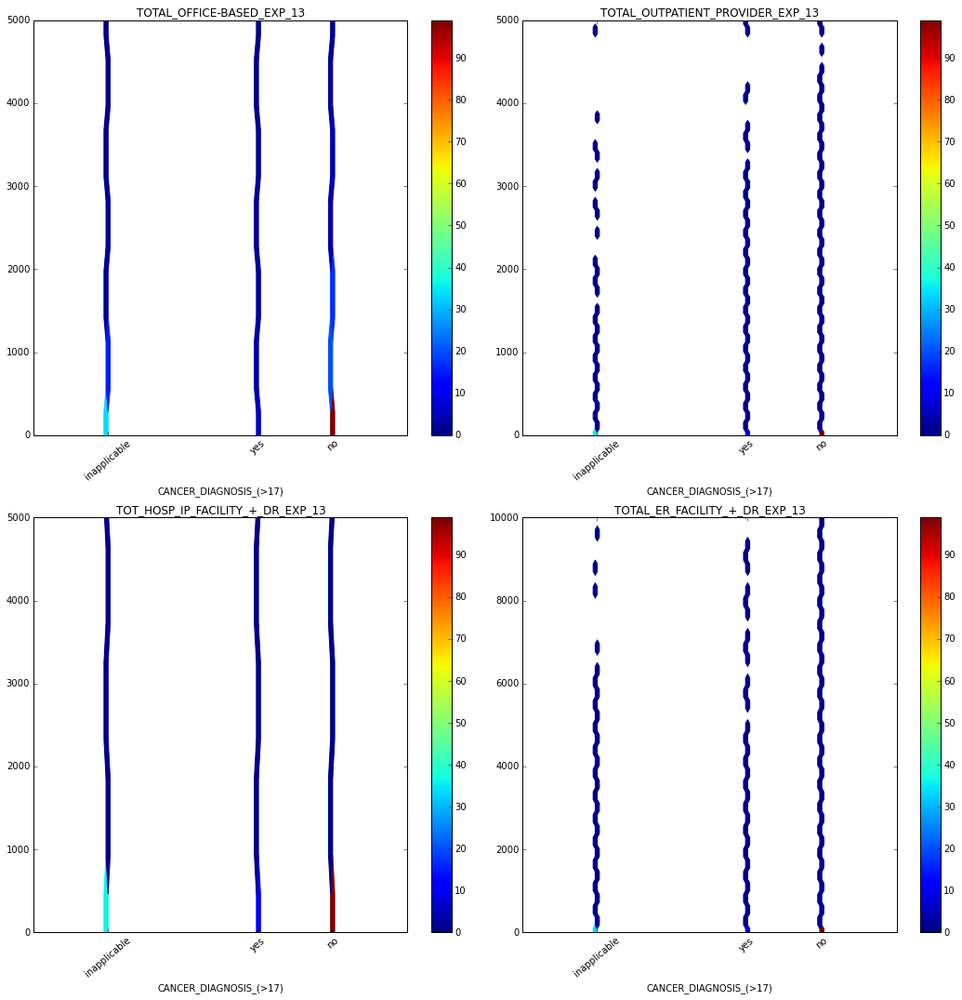

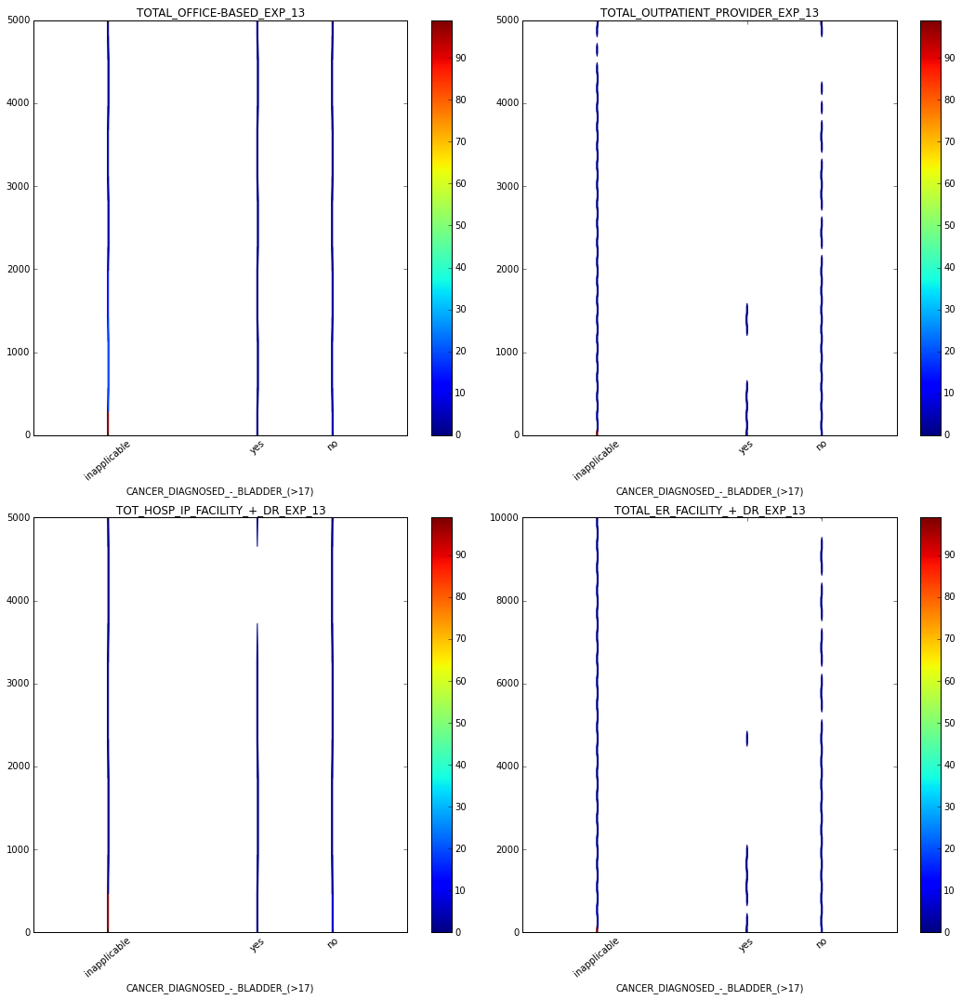

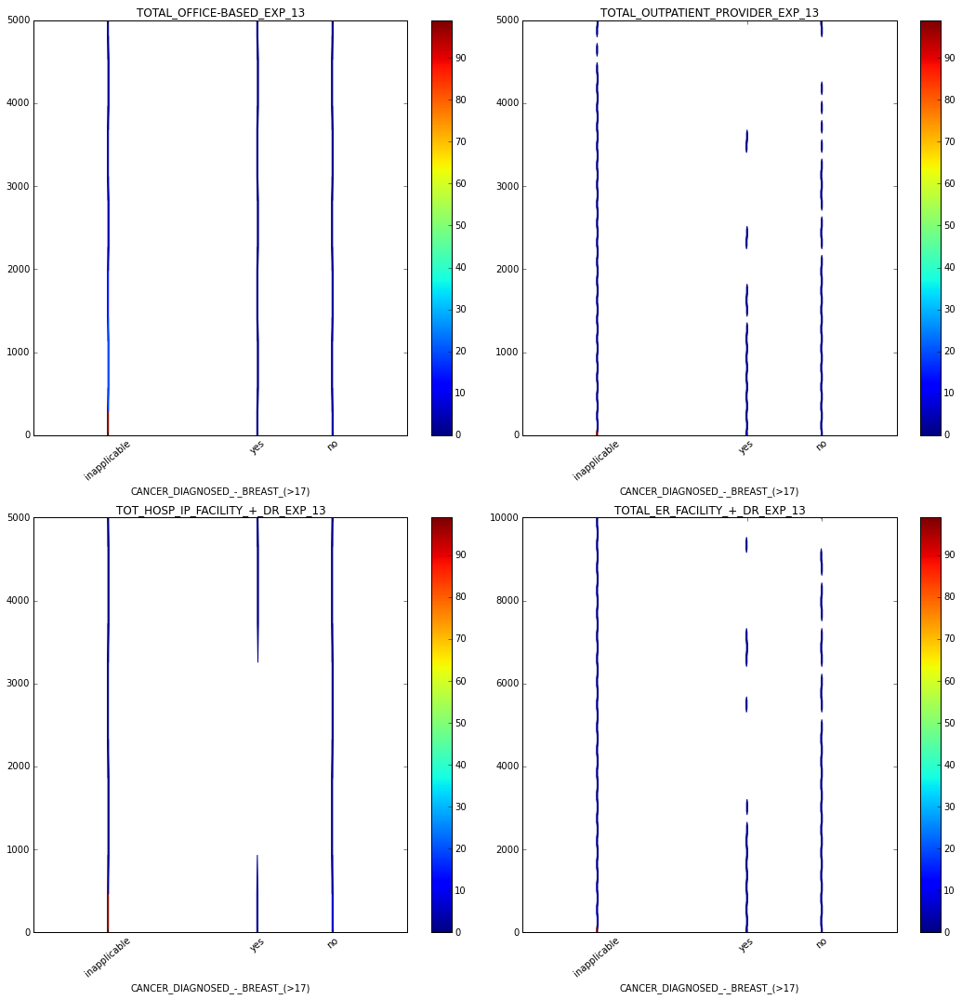

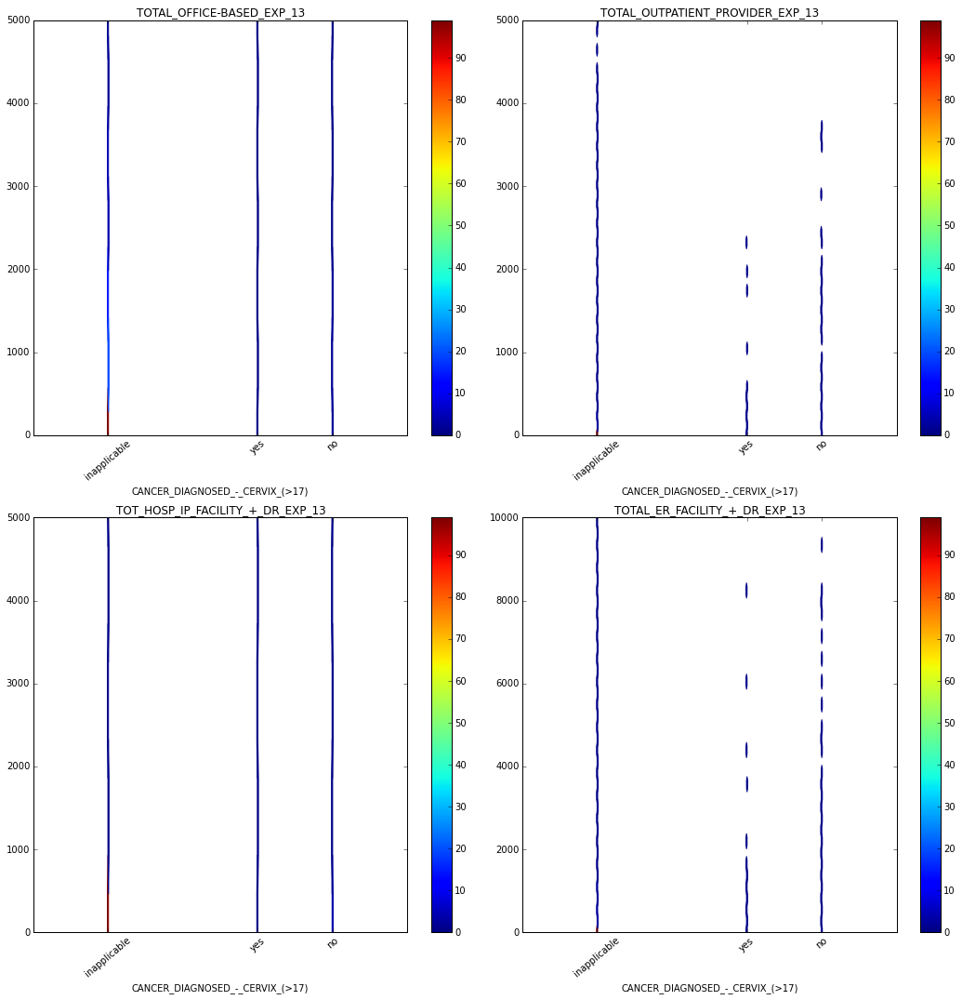

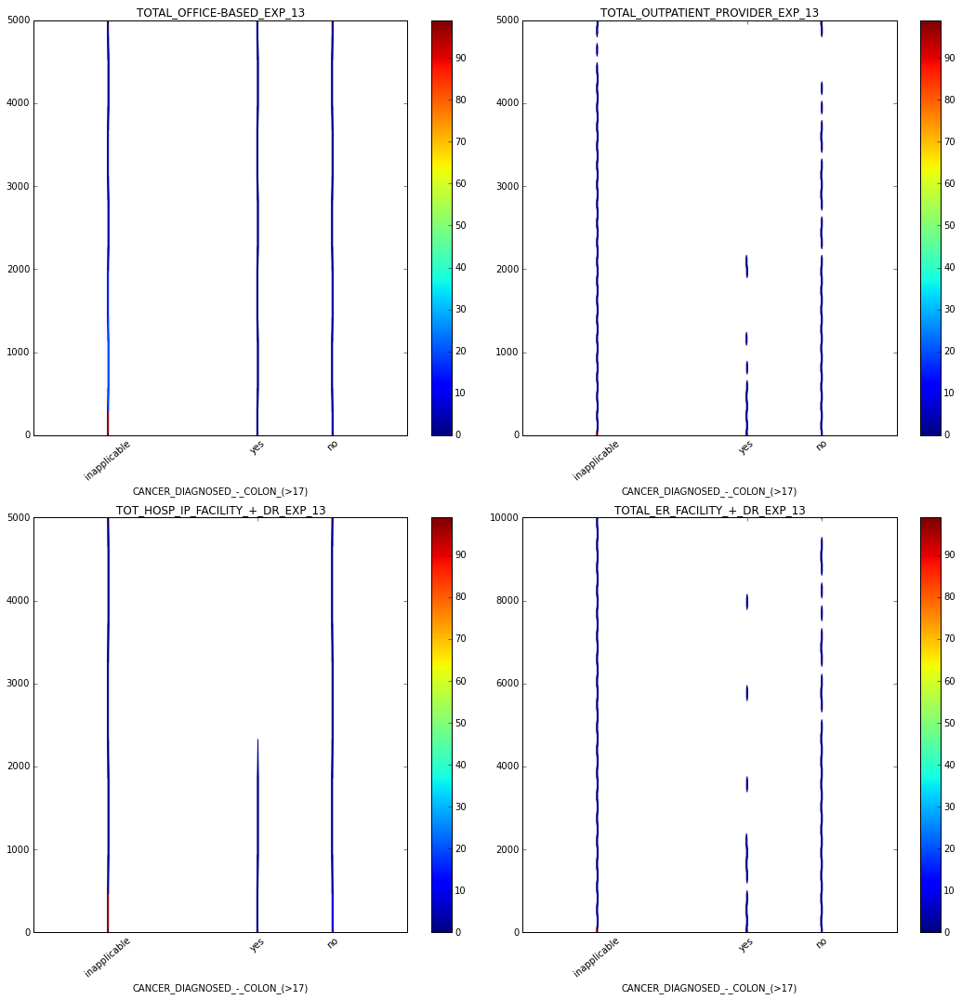

...

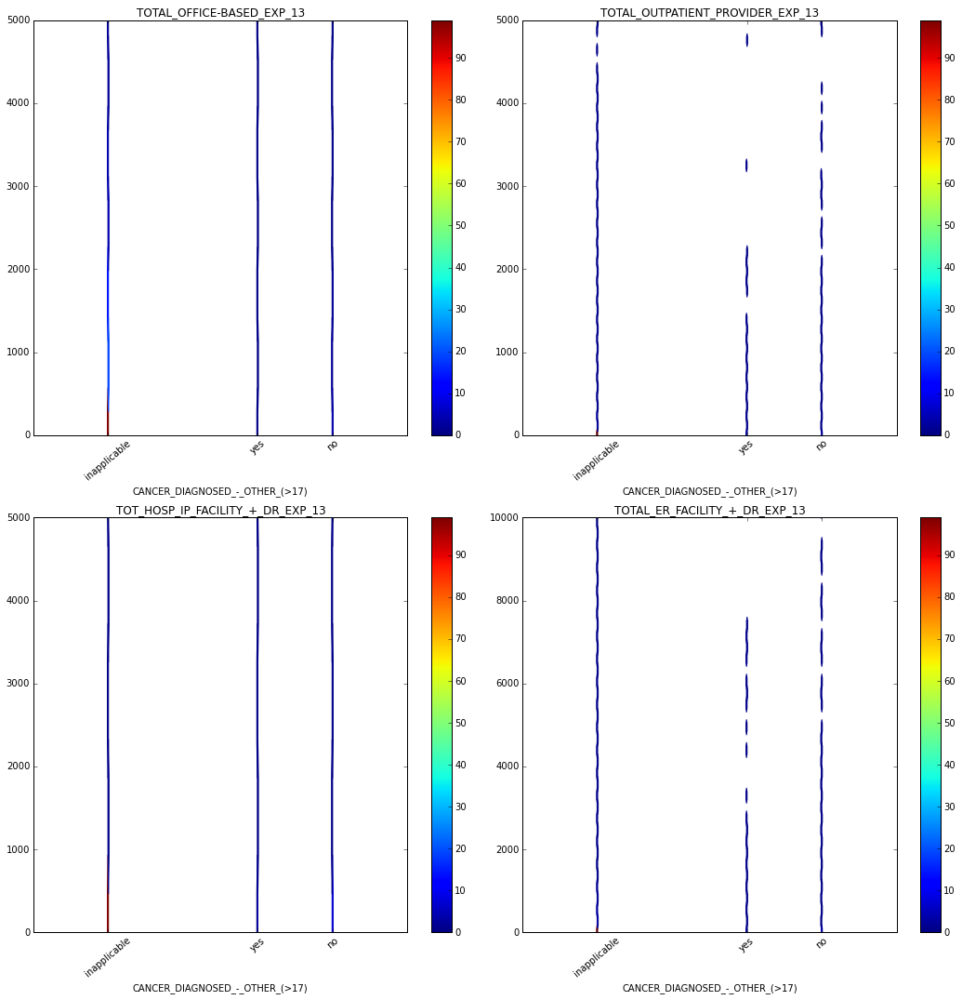

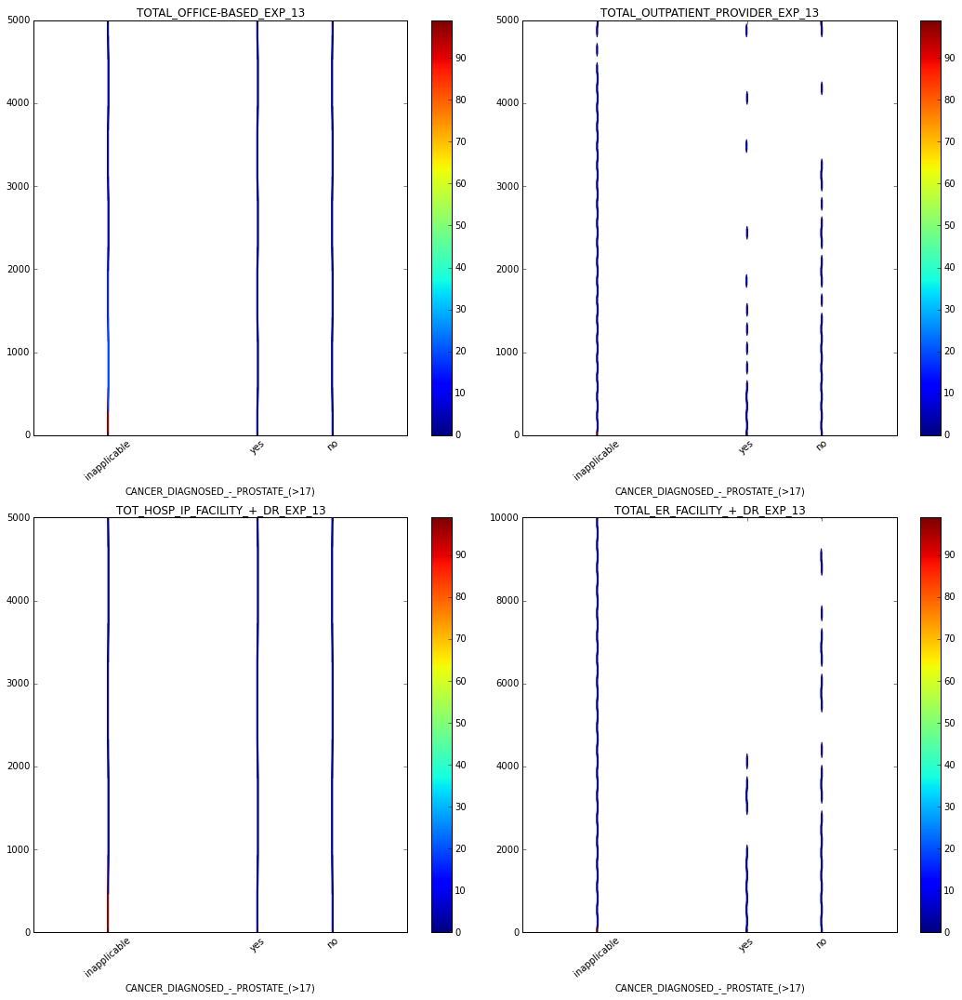

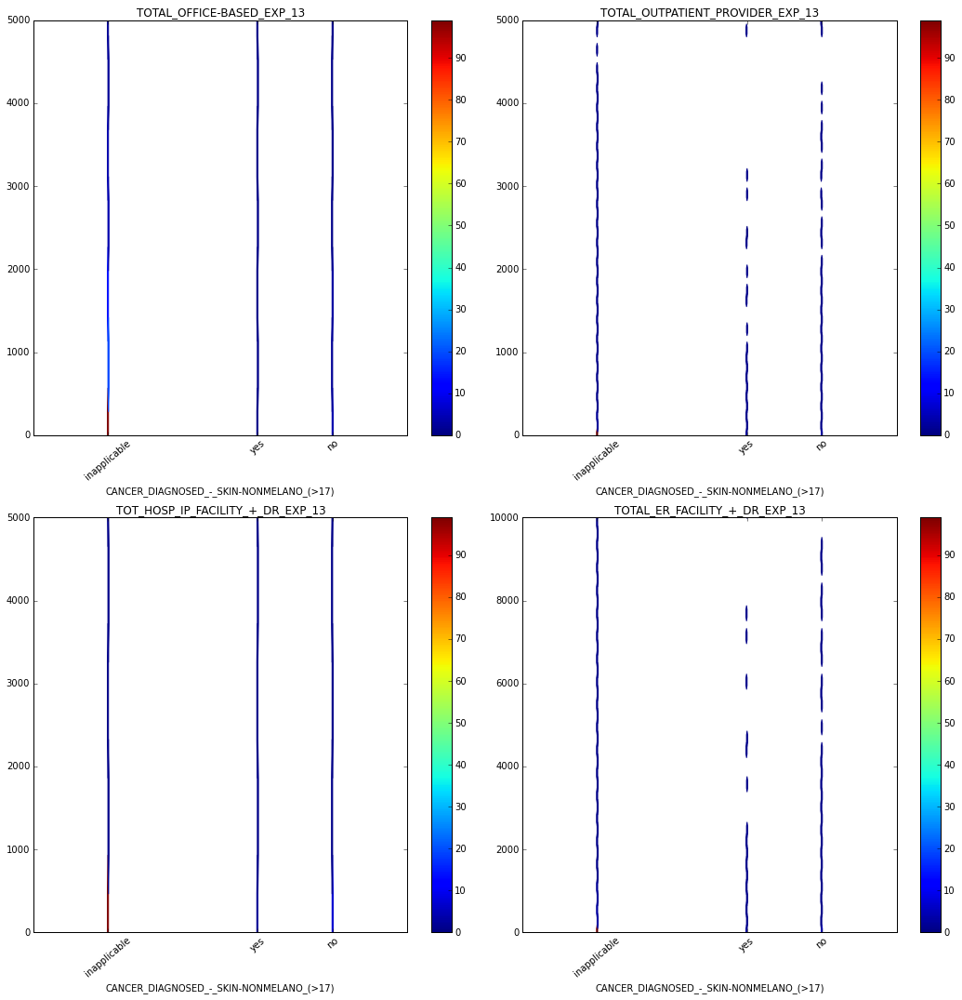

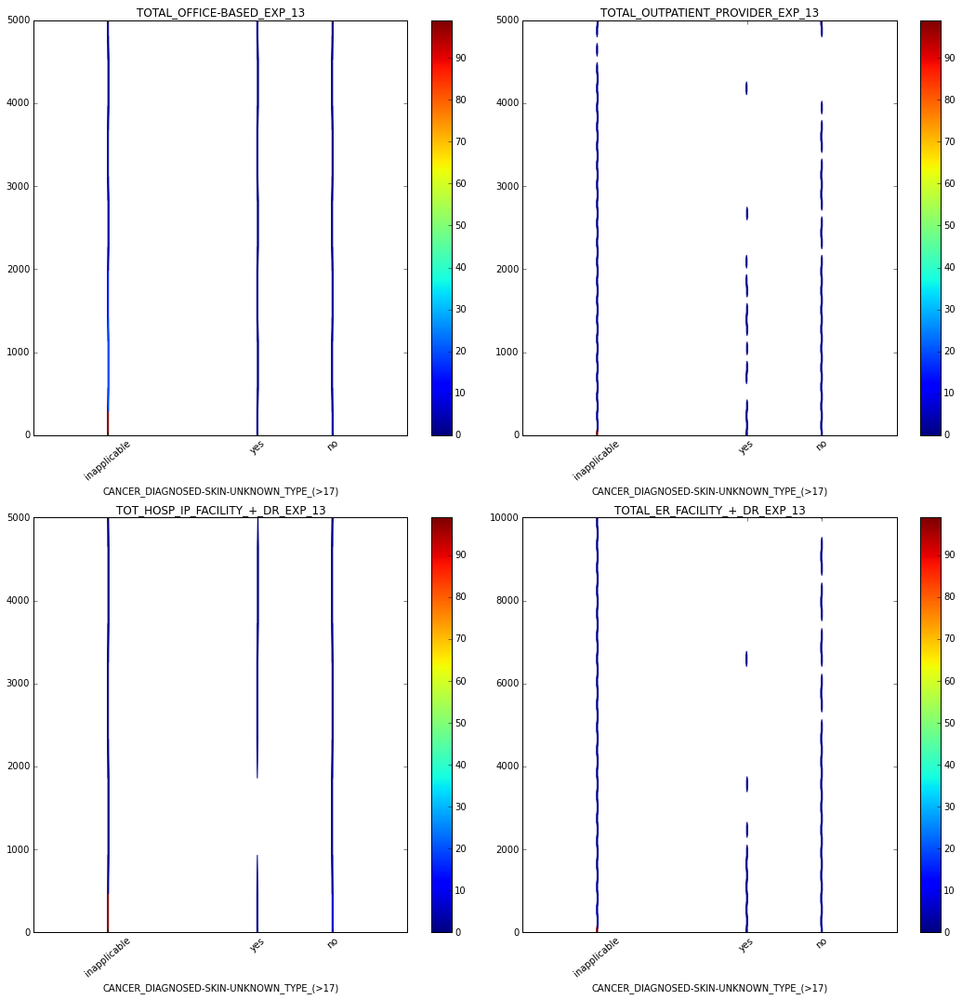

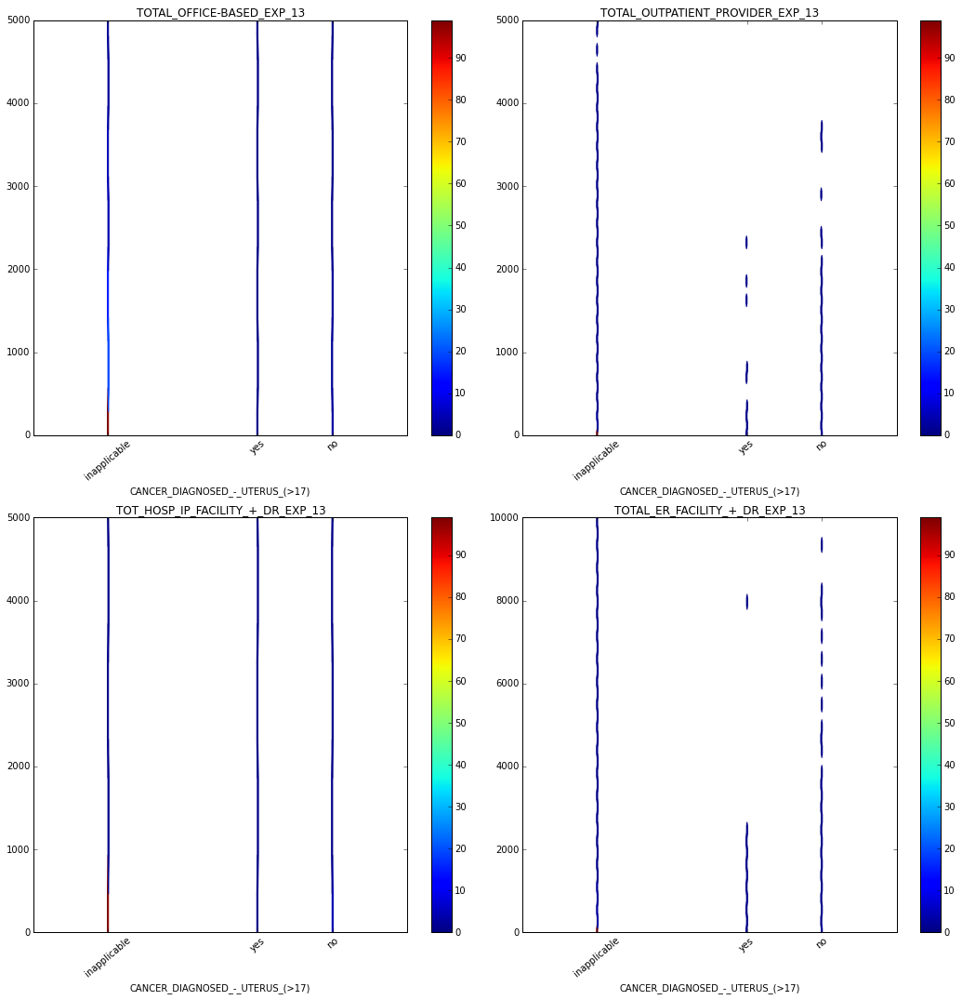

In [10]:
for term in cancer:
    x_min=data[term].min()
    x_max=data[term].max()
    x_range=[-2,3]

    four_correlations(data[term],
                      x_range=x_range,
                      w=data["FINAL_PERSON_WEIGHT_2013"],
                      xticks=[[-1,1,2],["inapplicable","yes","no"]],
                      office_range=[0,5000],
                      outpatient_range=[0,5000],
                      inpatient_range=[0,5000],
                      er_range=[0,10000],
                      colorbar=True,
                     )
    print("\n\n\n")

Conclusions:

1. A cancer diagnosis overall drives expenditure for office based services and inpatient services, and has less of a clear effect on outpatient spending and ER spending. For these latter two categories, there is greater variance in spending for the subpopulation without a positive cancer diagnosis.
2. There is very little mass in the graphs measuring spending against the various subdiagnoses of cancer. It seems likely that there will be a corresponding lack of statistical significance of these features in any analysis I do, and it may be well to leave those out and just use the overall cancer diagnosis feature.

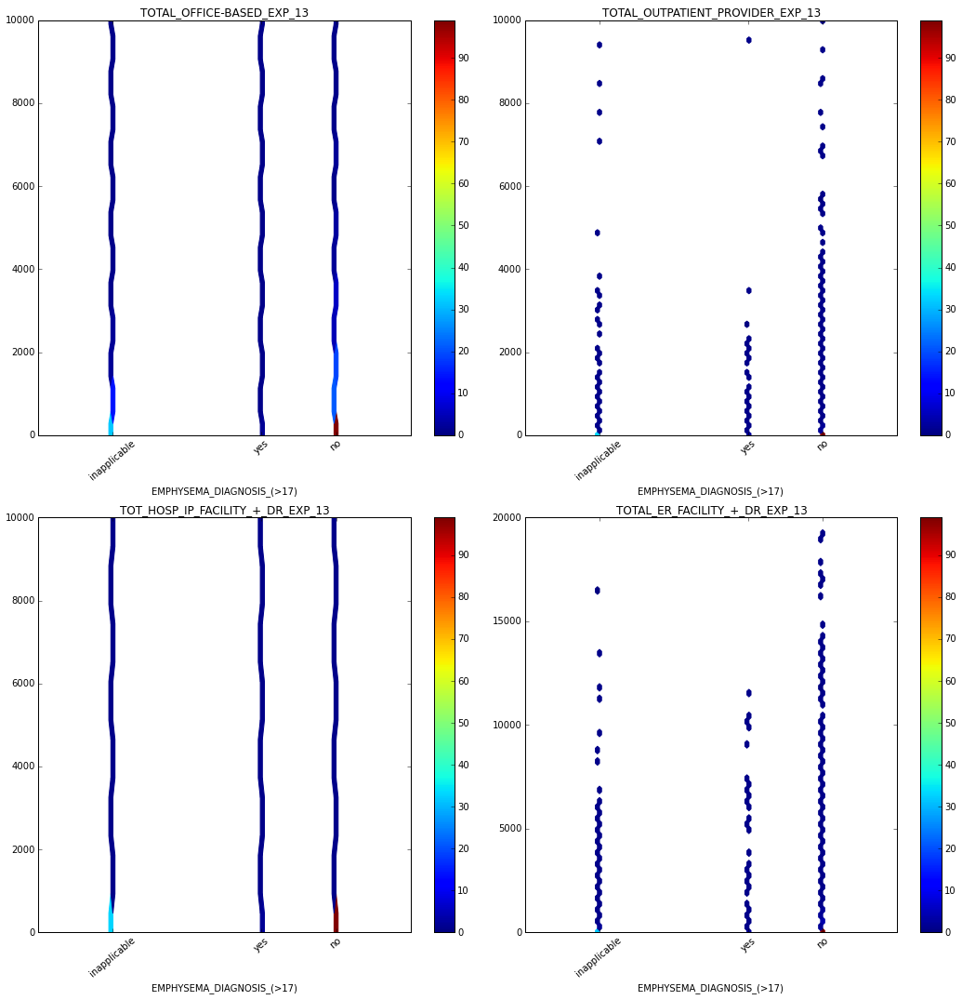

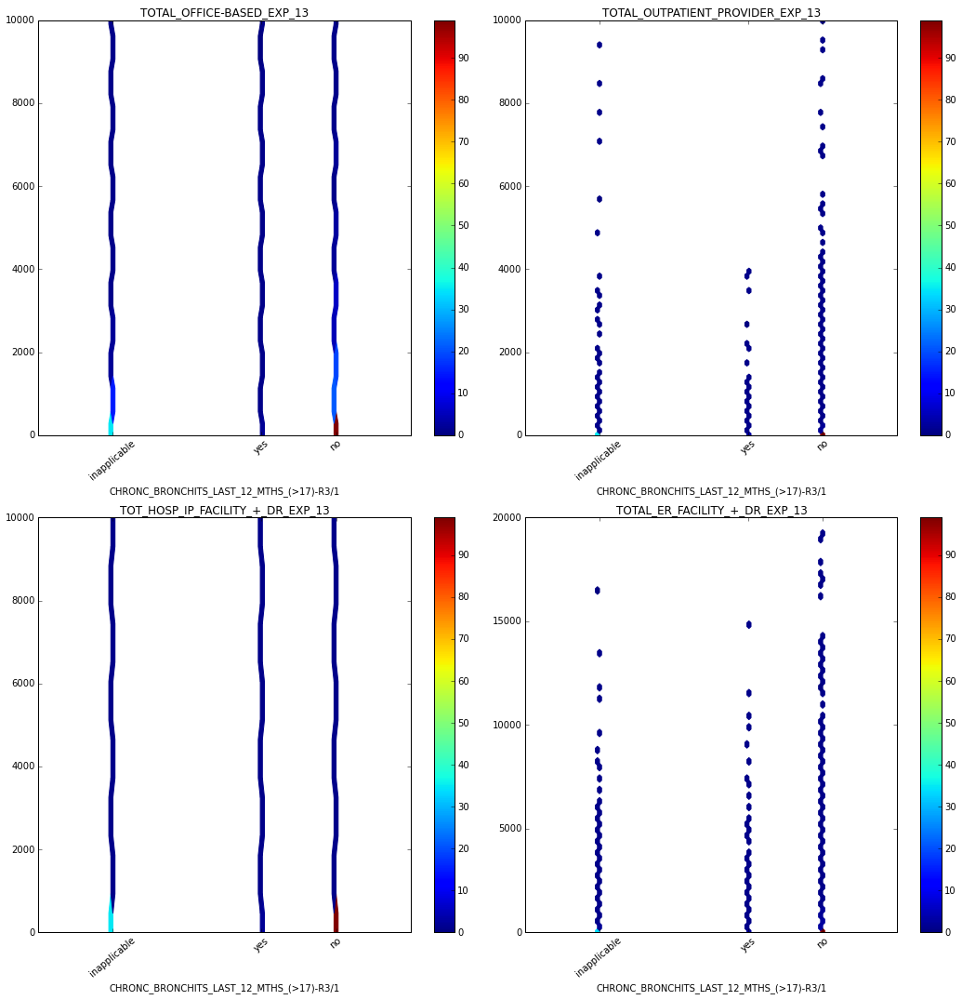

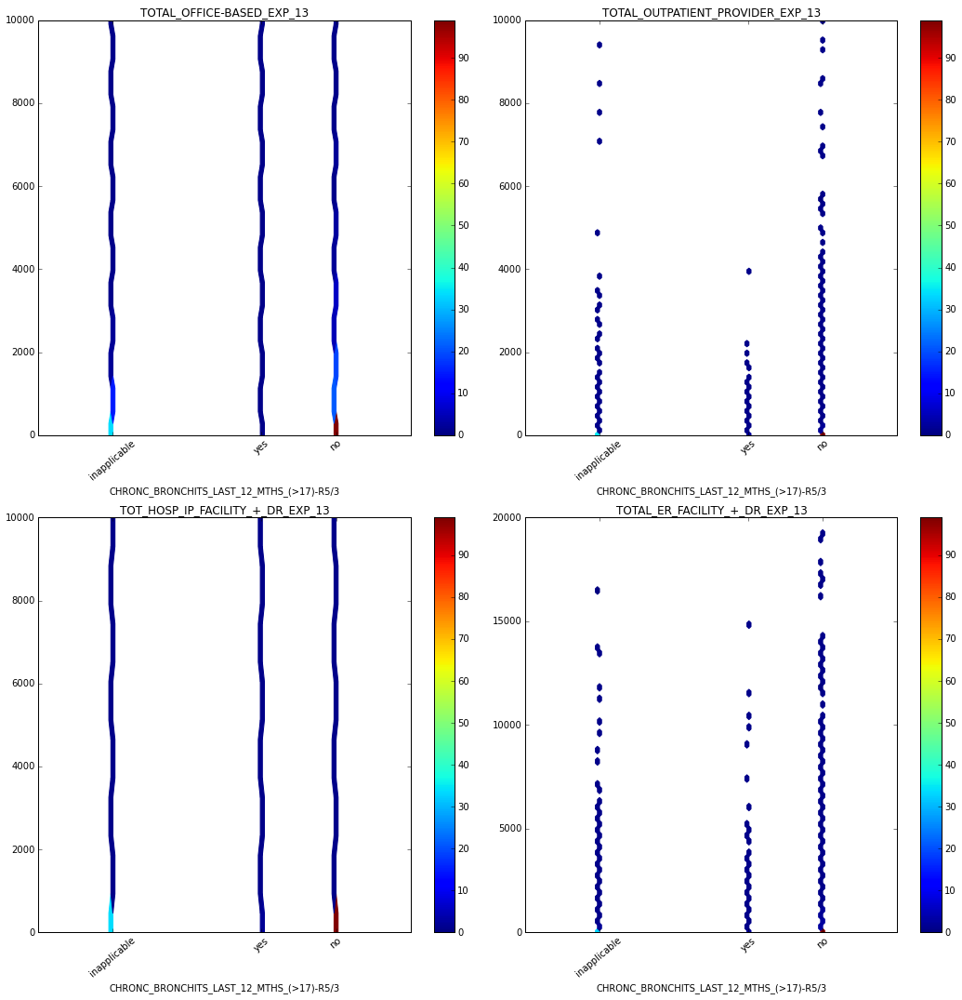

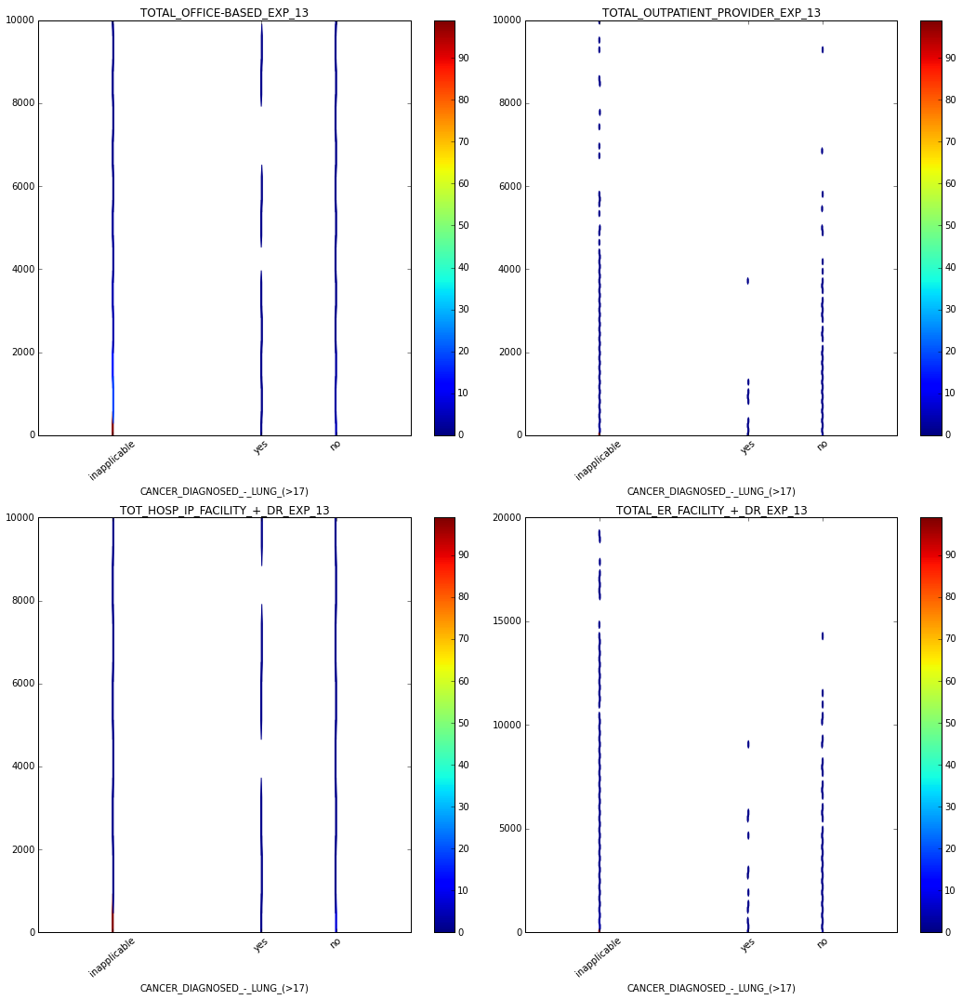

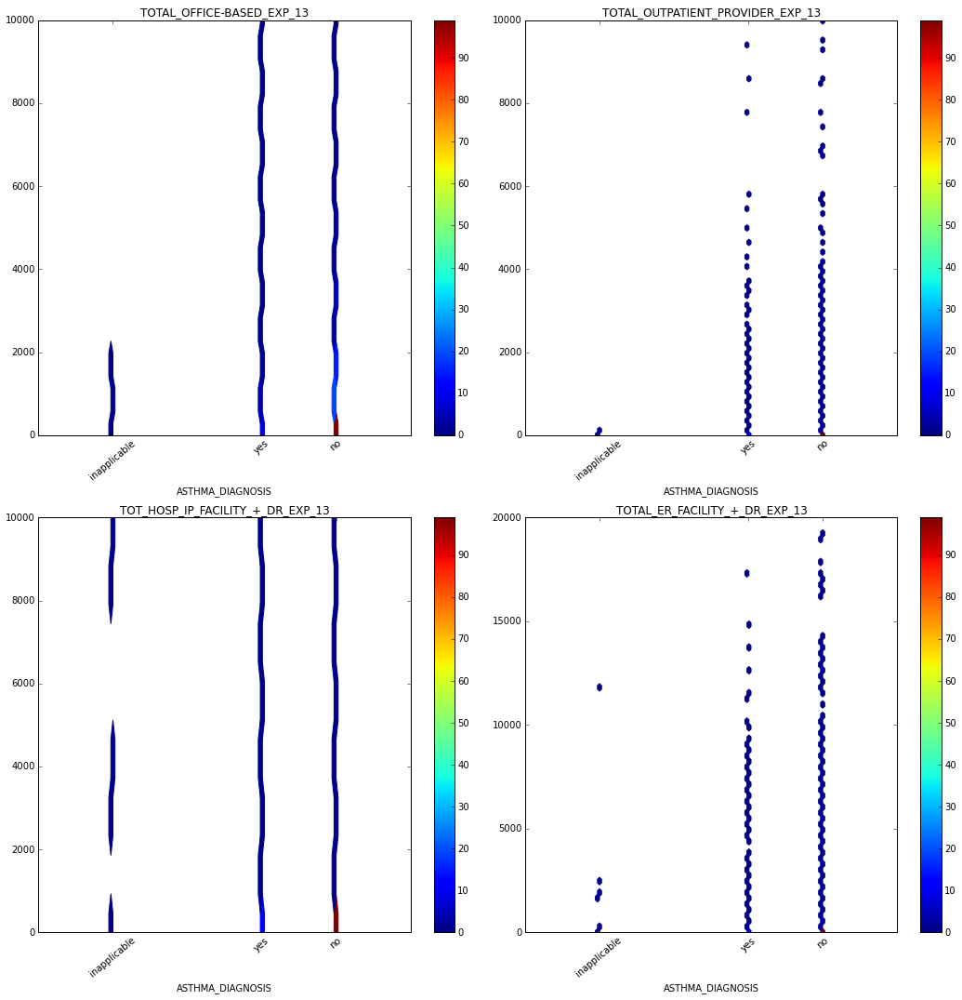

...

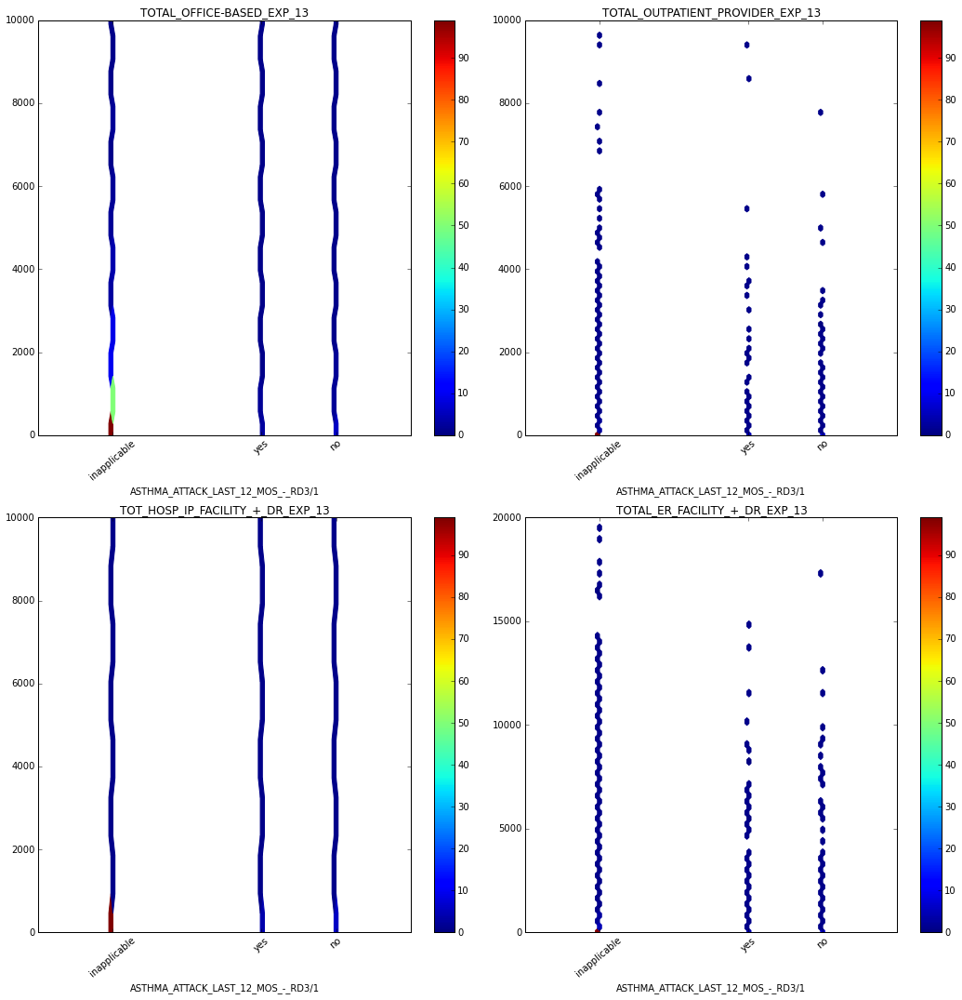

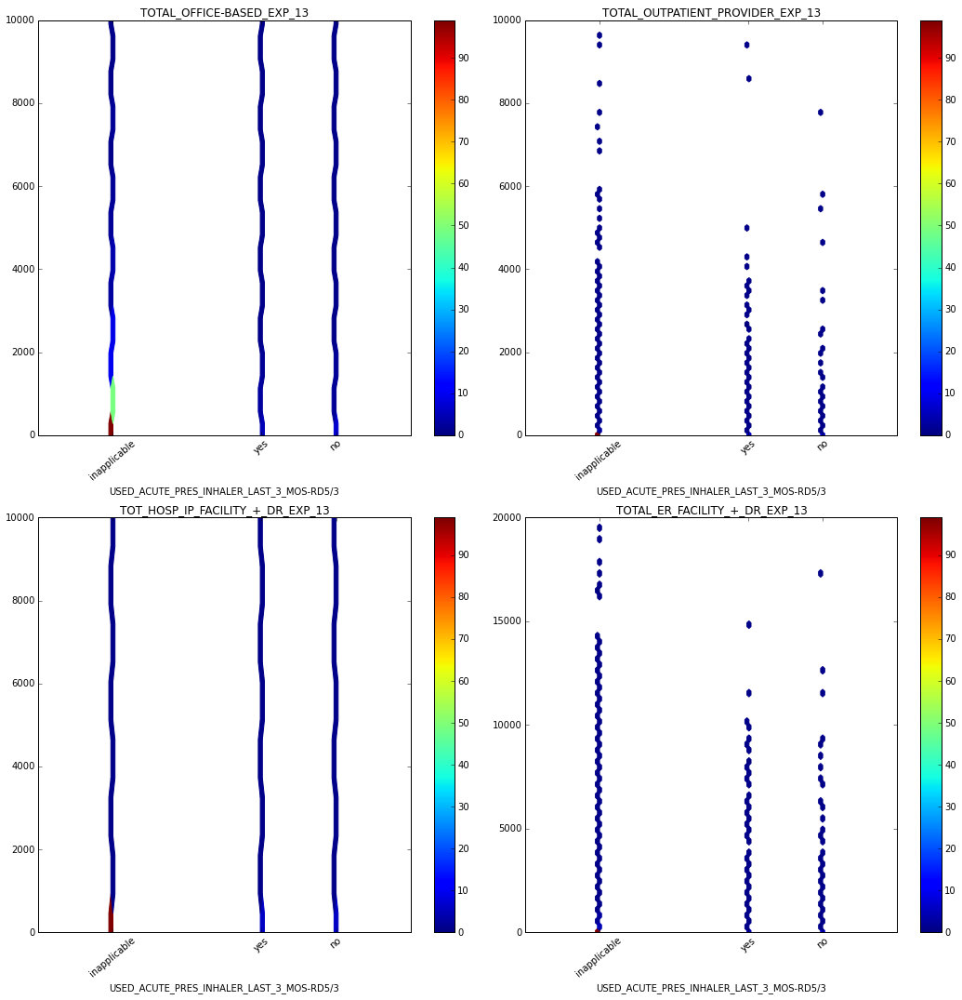

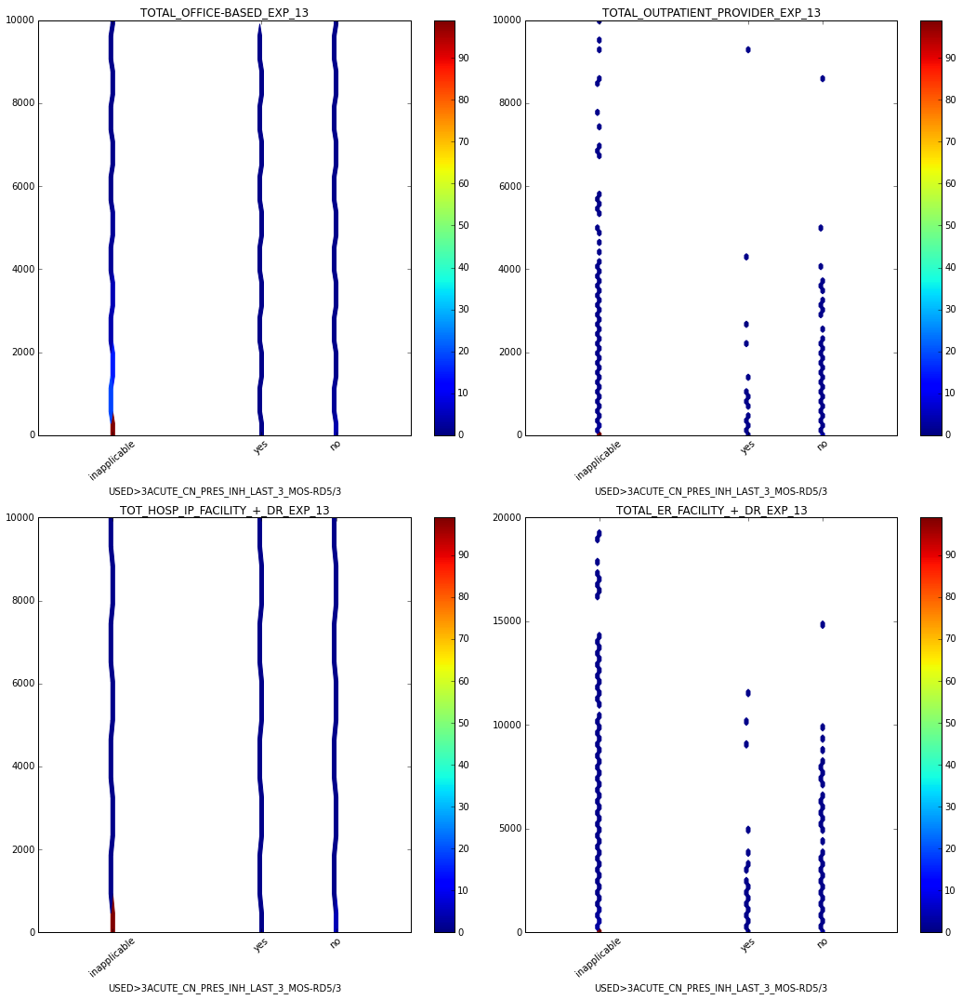

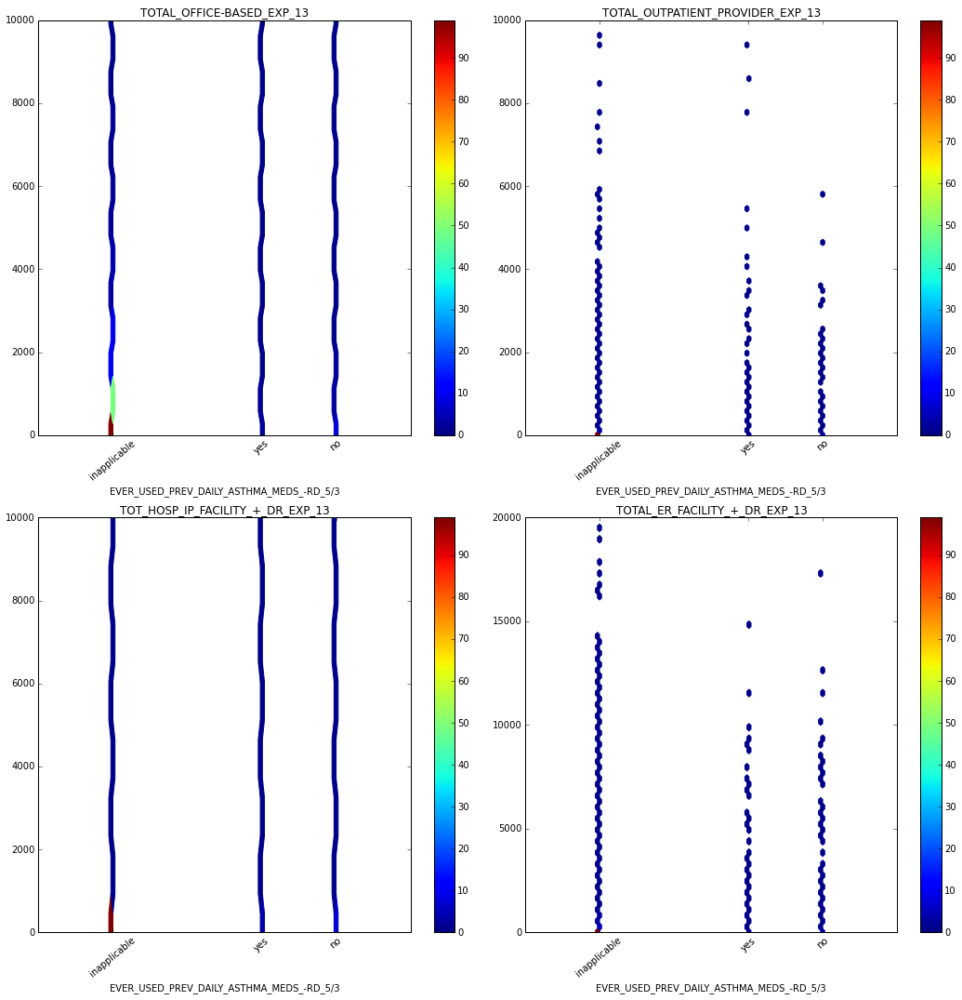

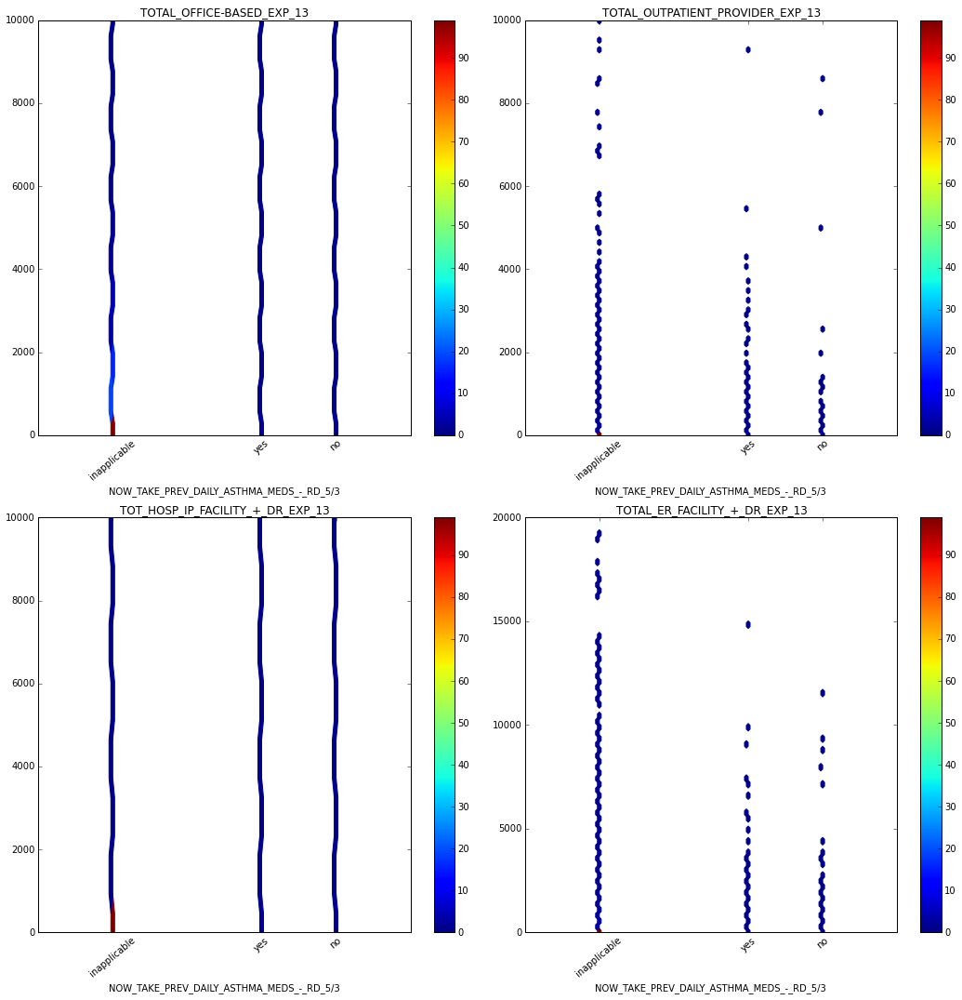

In [11]:
for term in lung:
    x_min=data[term].min()
    x_max=data[term].max()
    x_range=[-2,3]

    four_correlations(data[term],
                      x_range=x_range,
                      w=data["FINAL_PERSON_WEIGHT_2013"],
                      xticks=[[-1,1,2],["inapplicable","yes","no"]],
                      office_range=[0,10000],
                      outpatient_range=[0,10000],
                      inpatient_range=[0,10000],
                      er_range=[0,20000],
                      colorbar=True,
                     )
    print("\n\n\n")

Conclusions:

1. Diagnoses of emphysema, bronchitis, and asthma drive spending on office services and inpatient services. They have less of an effect on outpatient and ER services. The right tails in these latter categories is heavier in the negative group. 
2. The other features do not seem to be as predictive of increased spending.

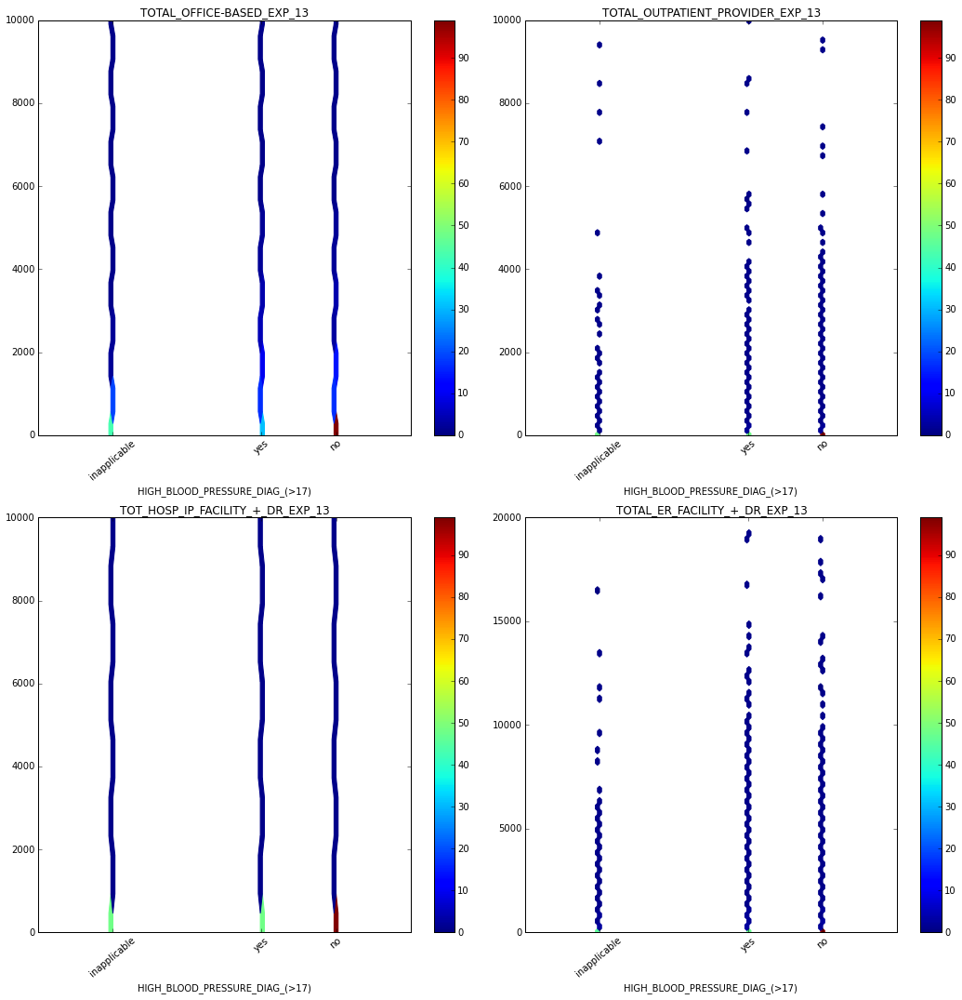

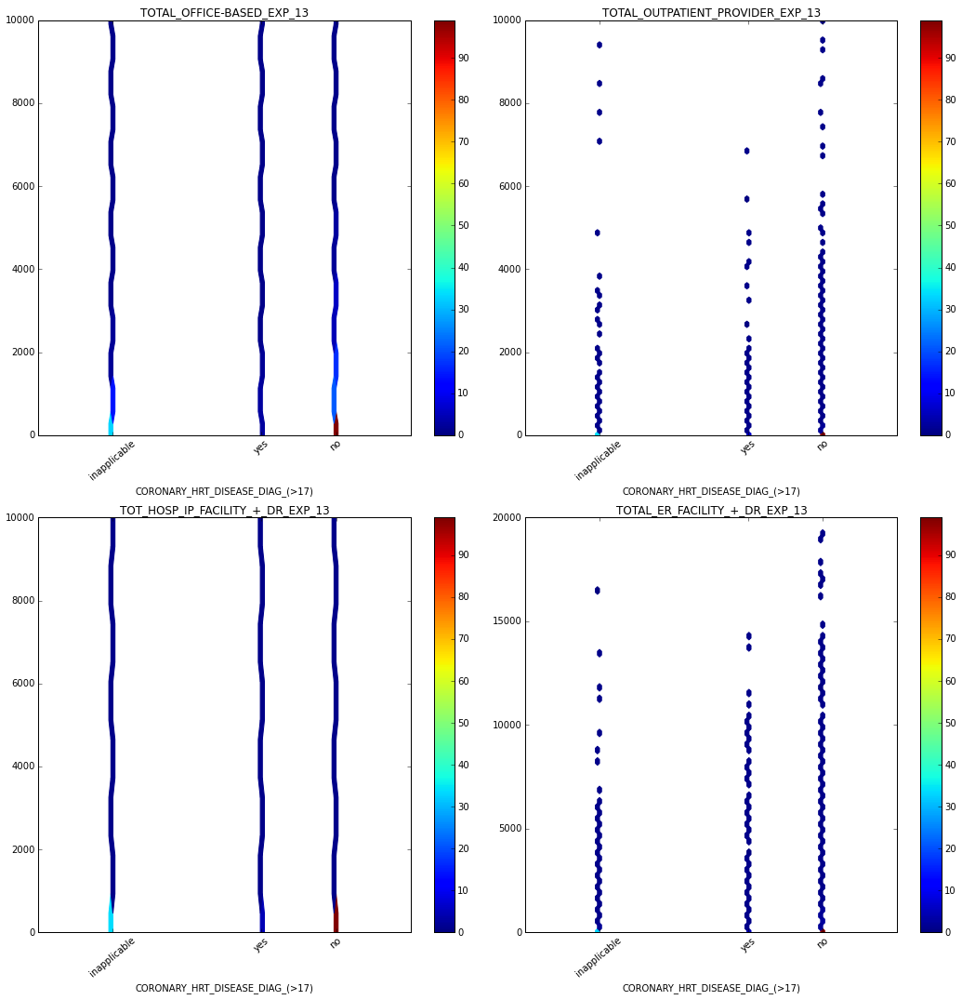

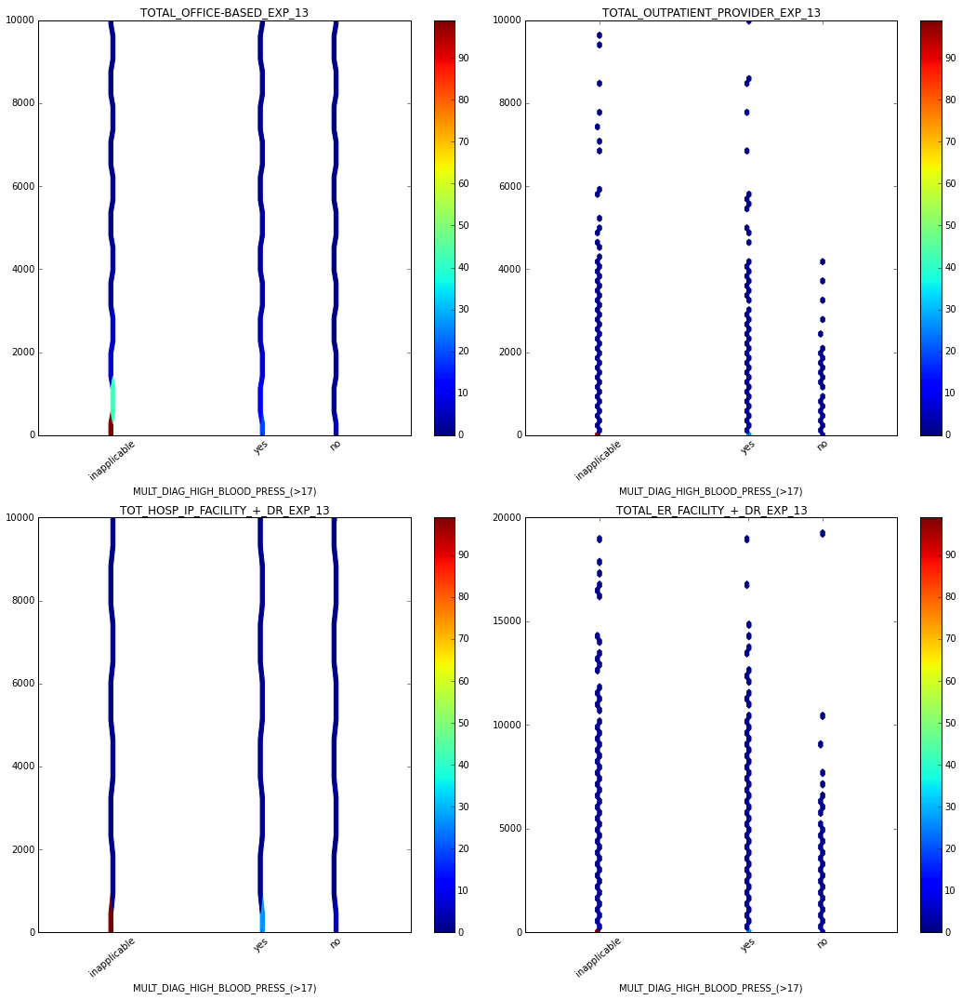

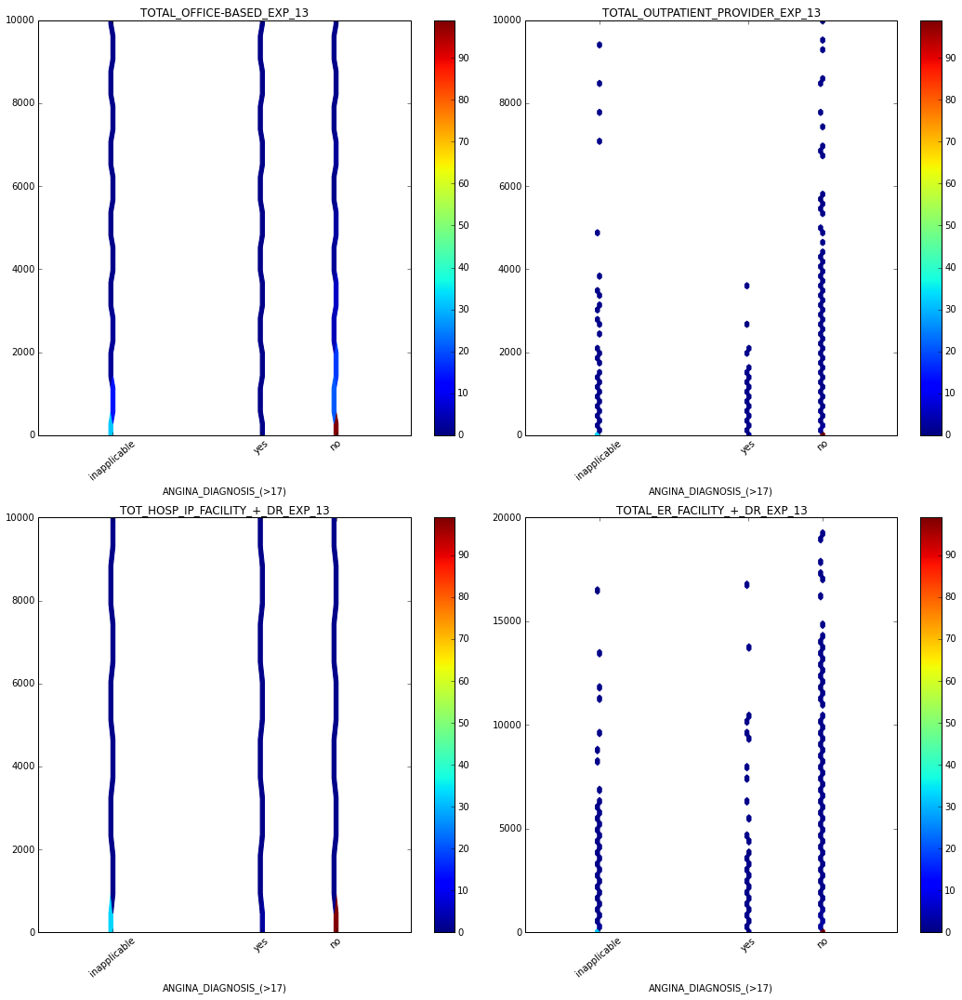

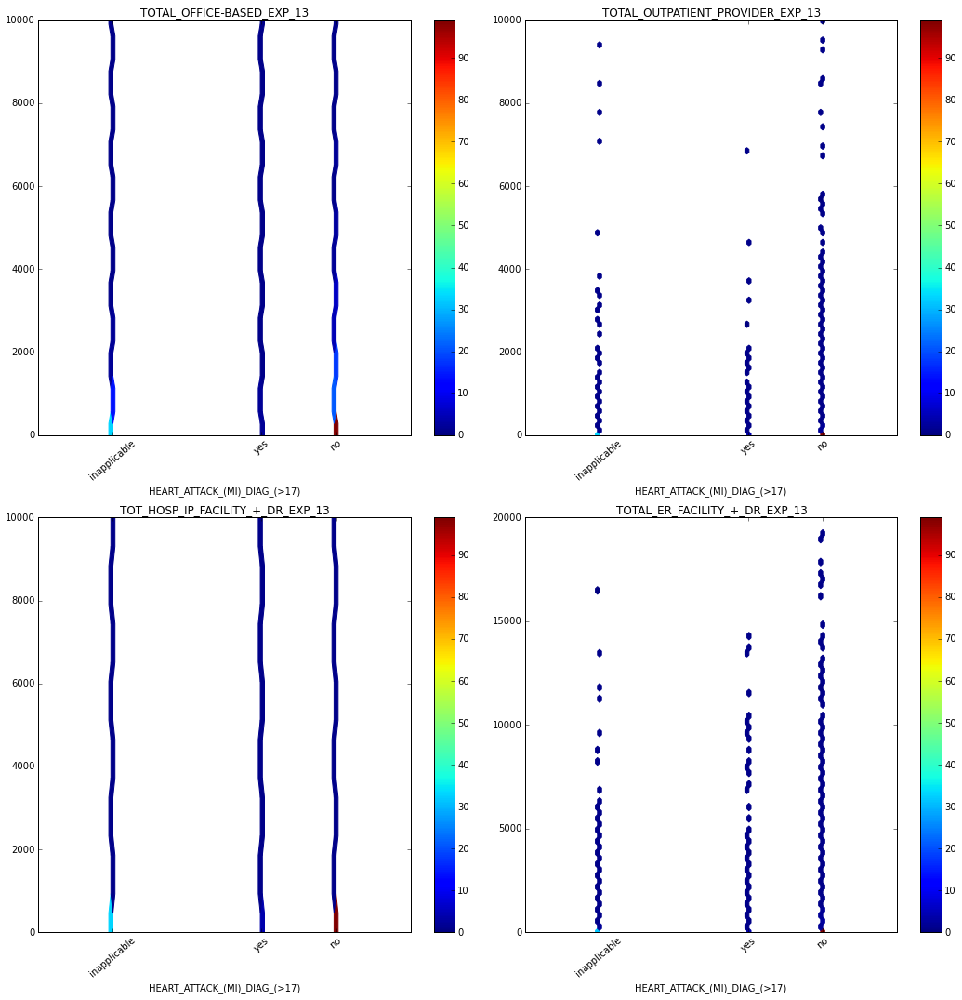

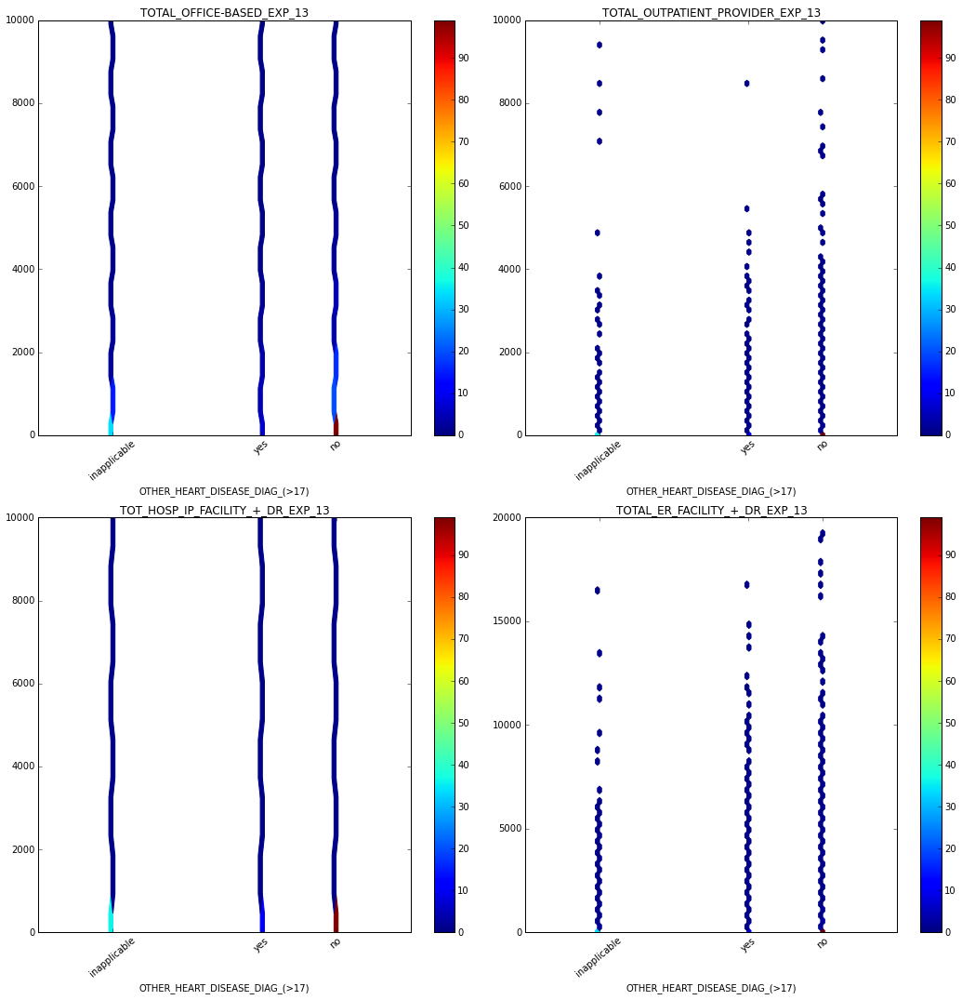

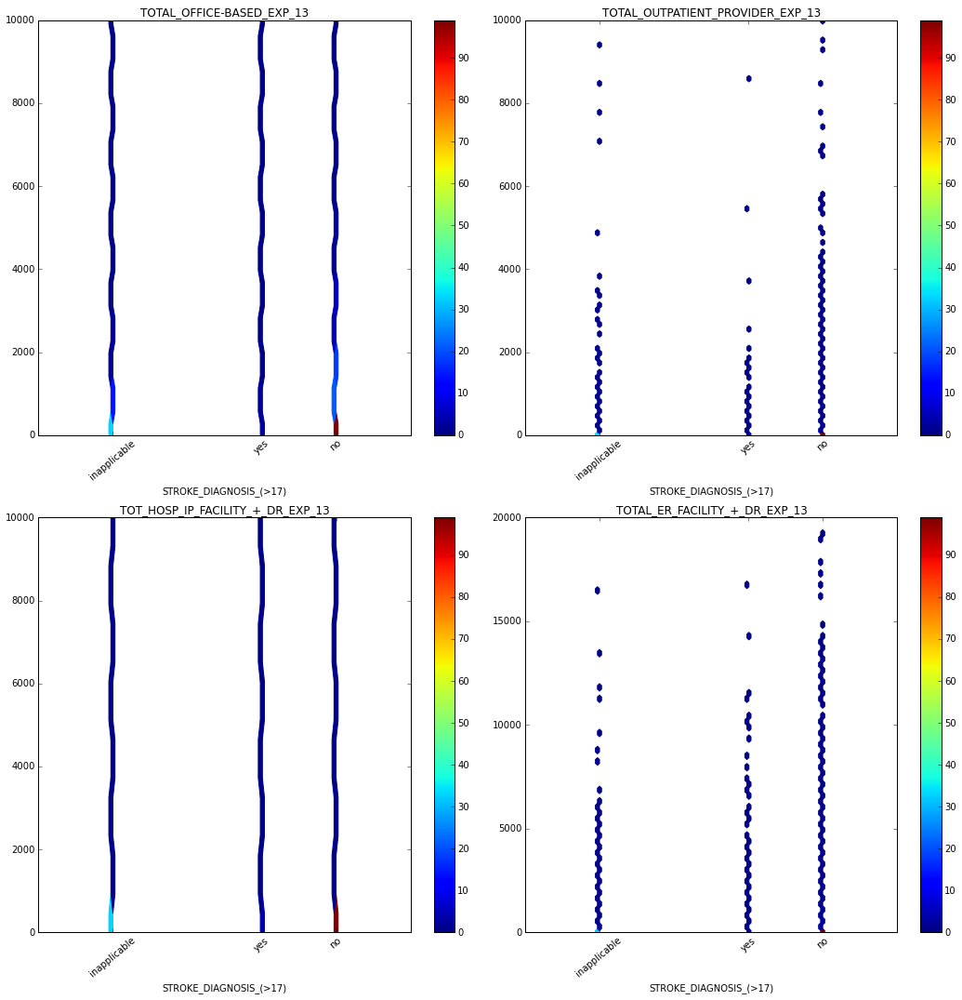

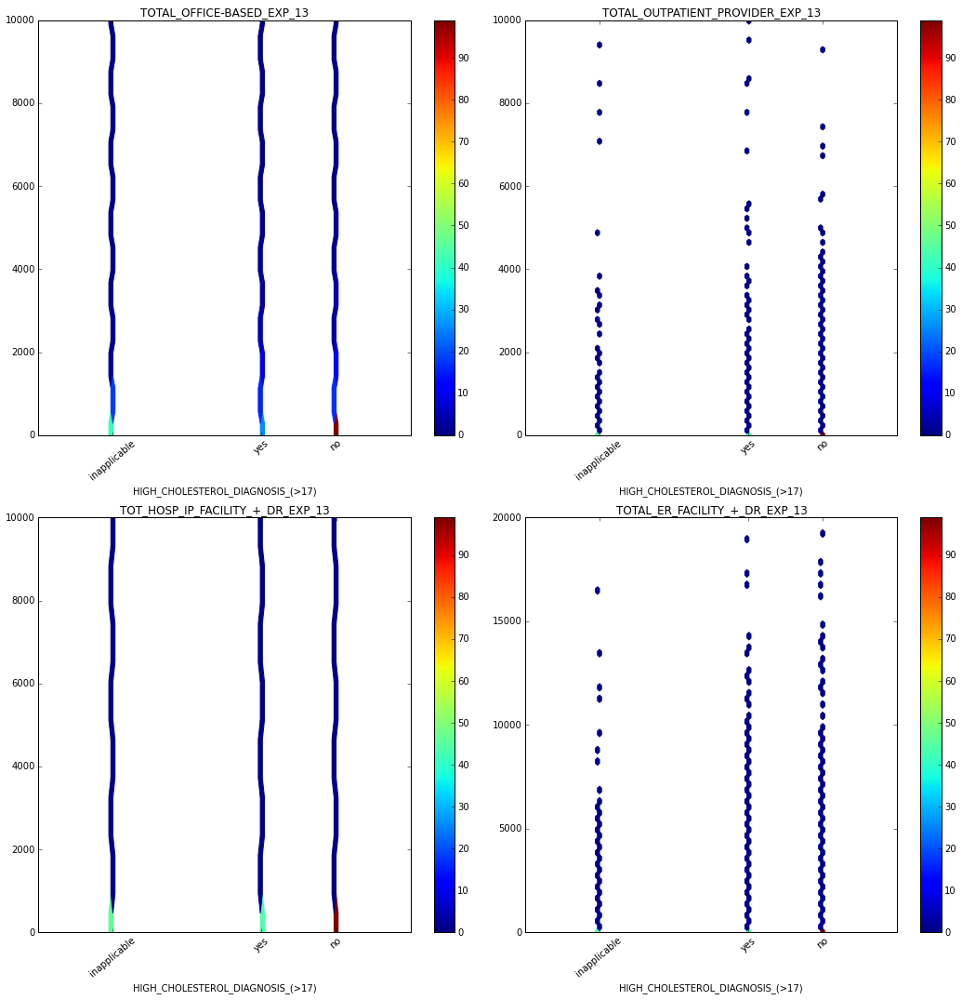

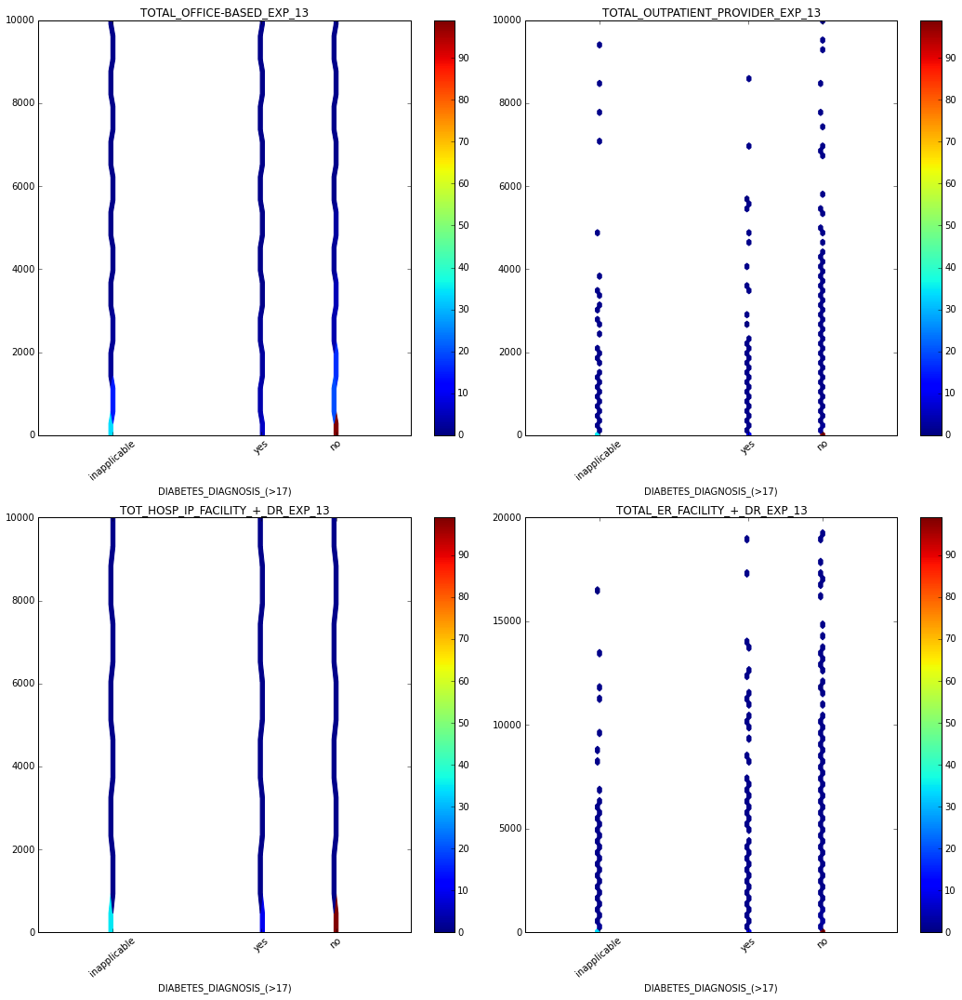

In [12]:
for term in cardio:
    x_min=data[term].min()
    x_max=data[term].max()
    x_range=[-2,3]

    four_correlations(data[term],
                      x_range=x_range,
                      w=data["FINAL_PERSON_WEIGHT_2013"],
                      xticks=[[-1,1,2],["inapplicable","yes","no"]],
                      office_range=[0,10000],
                      outpatient_range=[0,10000],
                      inpatient_range=[0,10000],
                      er_range=[0,20000],
                      colorbar=True,
                     )
    print("\n\n\n")

Conclusions:

1. Diagnoses of high blood pressure, high cholesterol, coronary heart disease, angina, heart attack, other heart disease, stroke, and diabetes drive spending on office services and inpatient services, while having a limited effect on the other two categories of spending, in which they are associated with thinner right tails.
2. A multiple diagnosis of high blood pressure is probably not very predictive.

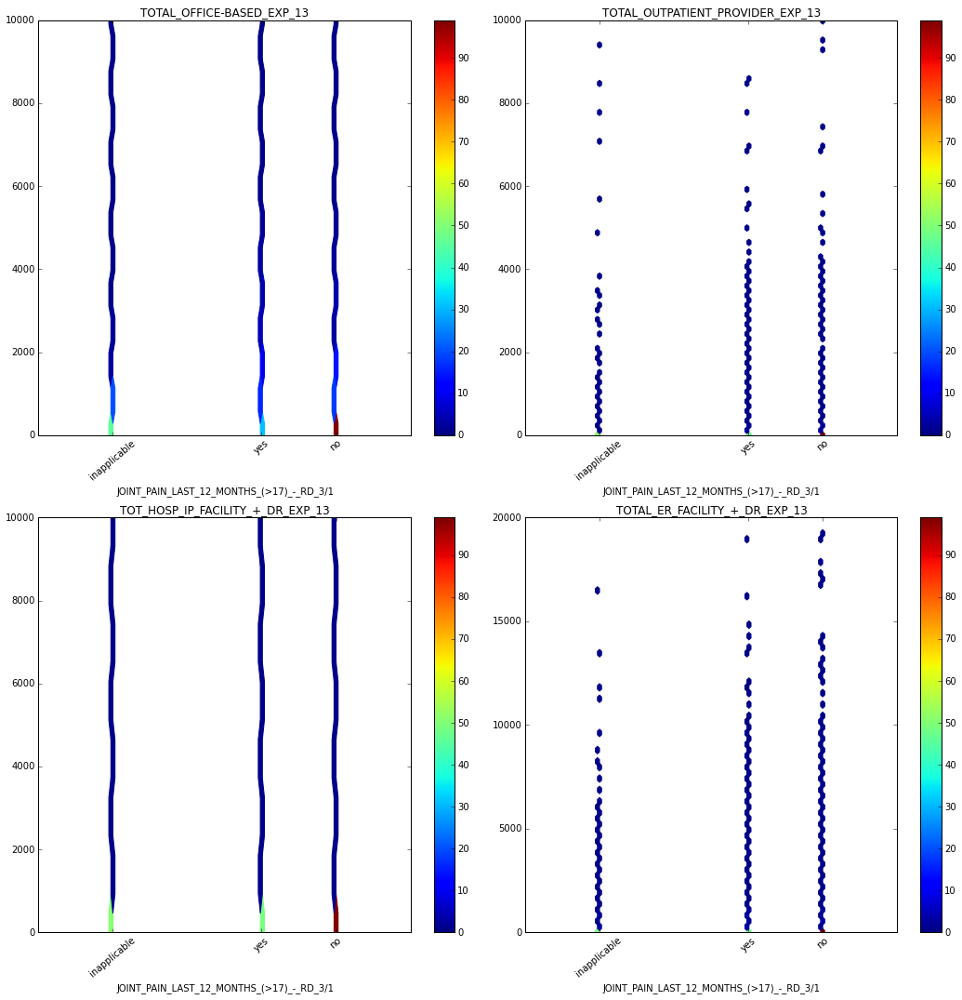

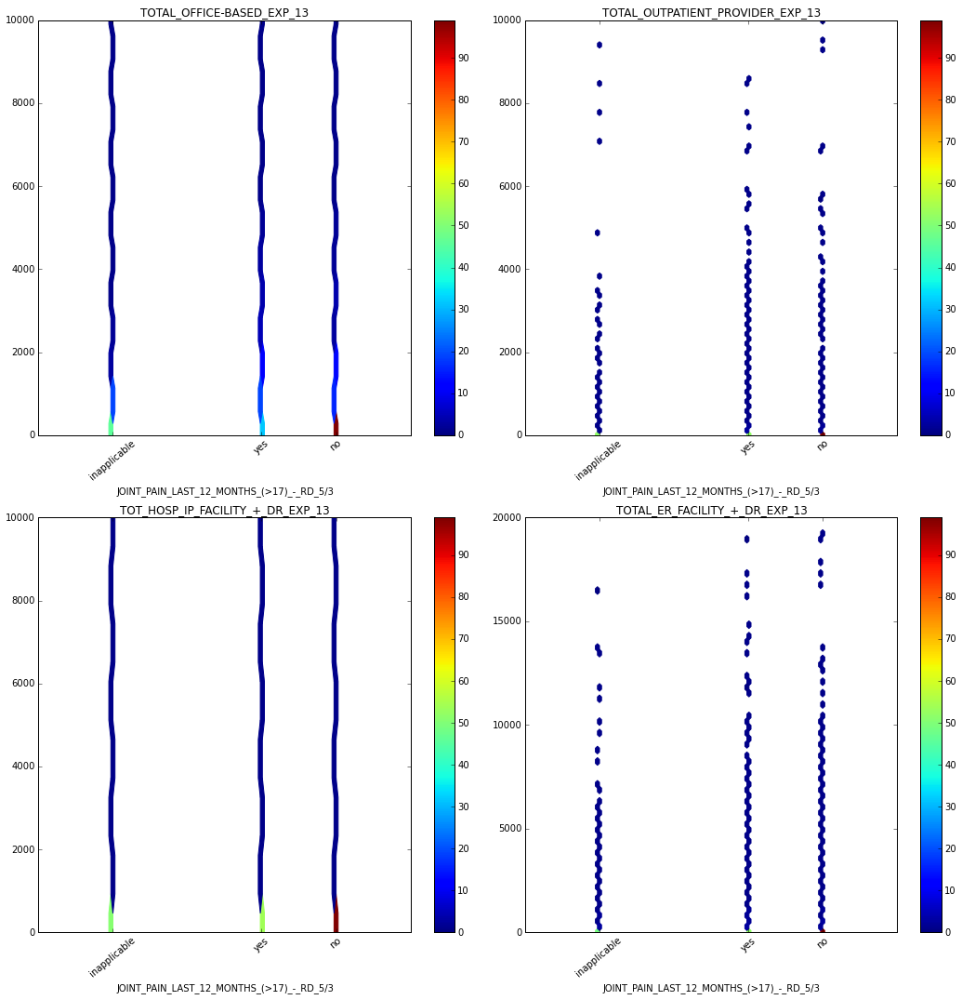

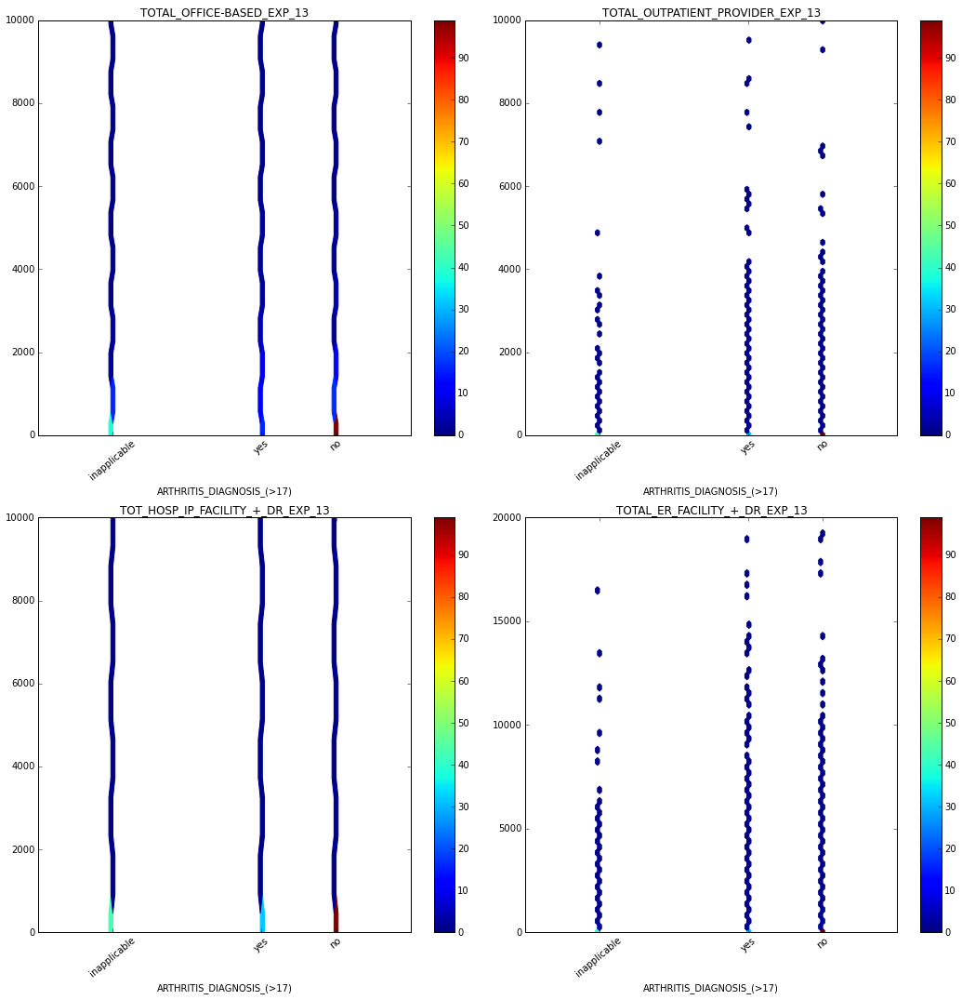

In [13]:
for term in joint:
    x_min=data[term].min()
    x_max=data[term].max()
    x_range=[-2,3]

    four_correlations(data[term],
                      x_range=x_range,
                      w=data["FINAL_PERSON_WEIGHT_2013"],
                      xticks=[[-1,1,2],["inapplicable","yes","no"]],
                      office_range=[0,10000],
                      outpatient_range=[0,10000],
                      inpatient_range=[0,10000],
                      er_range=[0,20000],
                      colorbar=True,
                     )
    print("\n\n\n")

Conclusions:

1. Diagnoses of joint pain and arthritis drive spending on office services and inpatient services, while having a limited effect on the other two categories of spending, in which they are associated with thinner right tails.

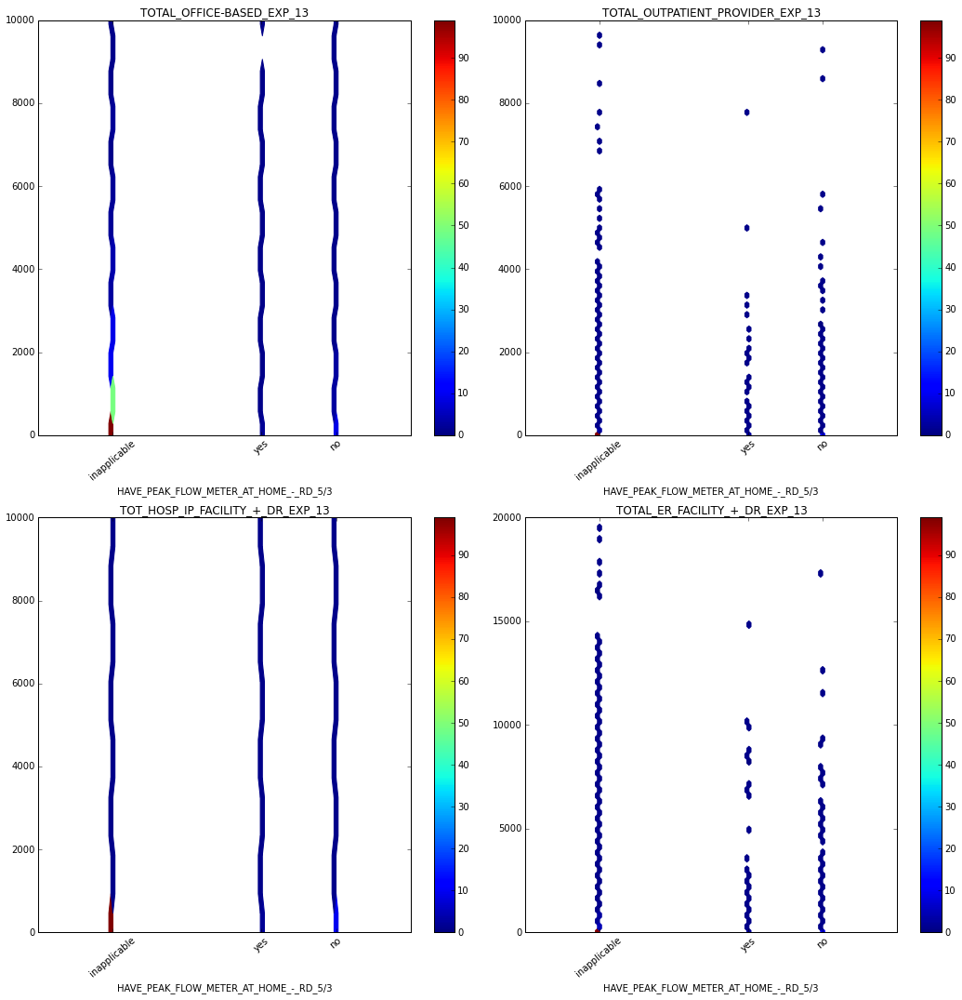

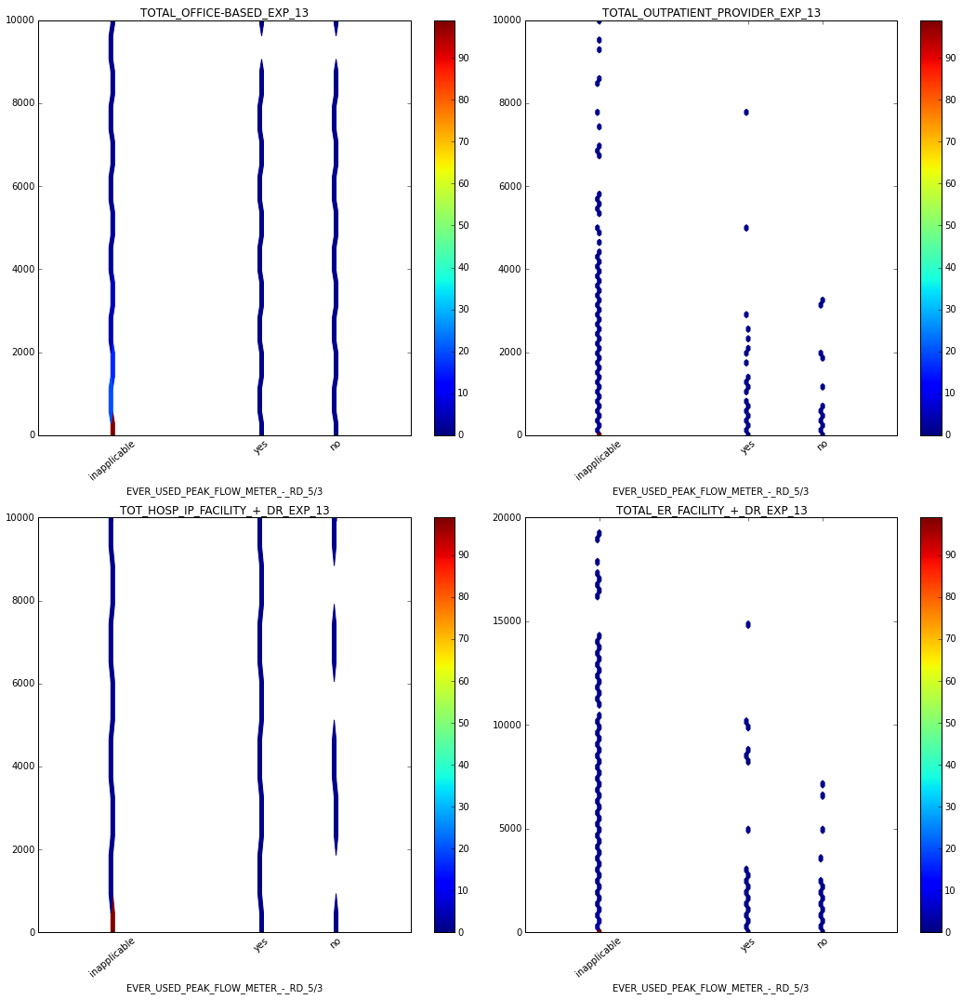

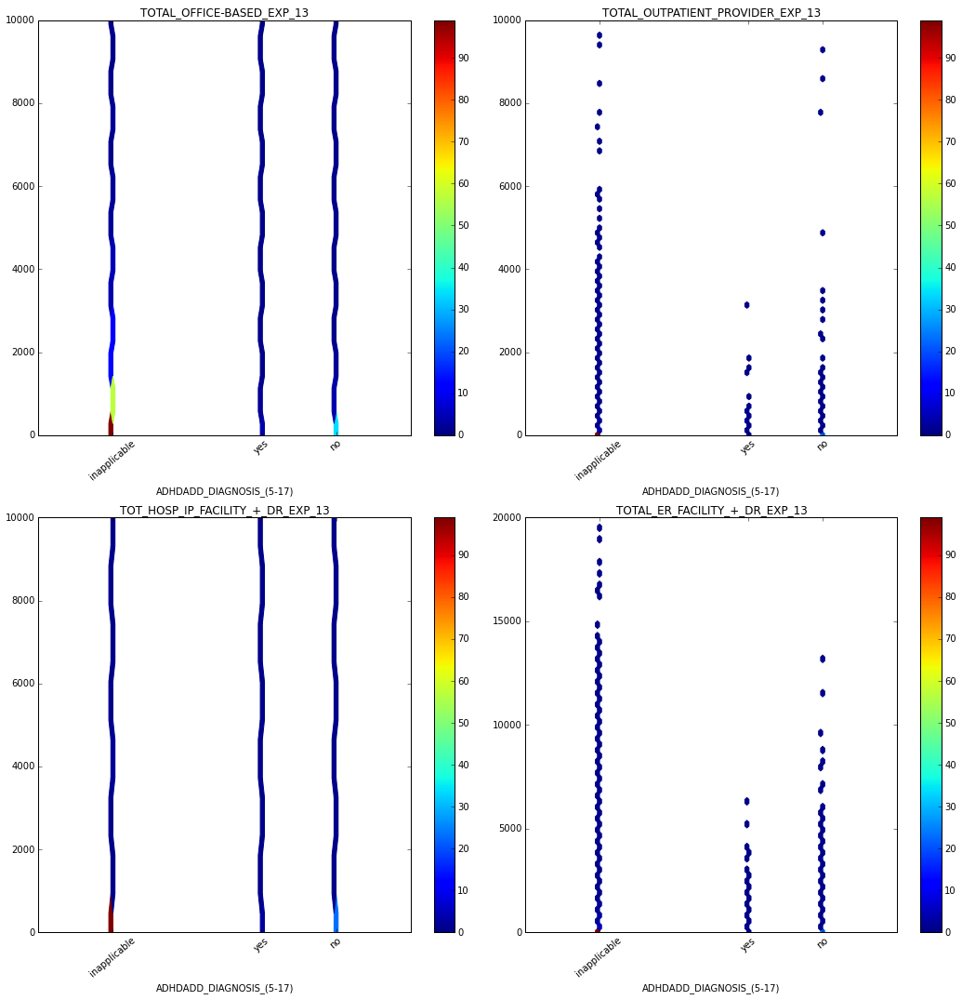

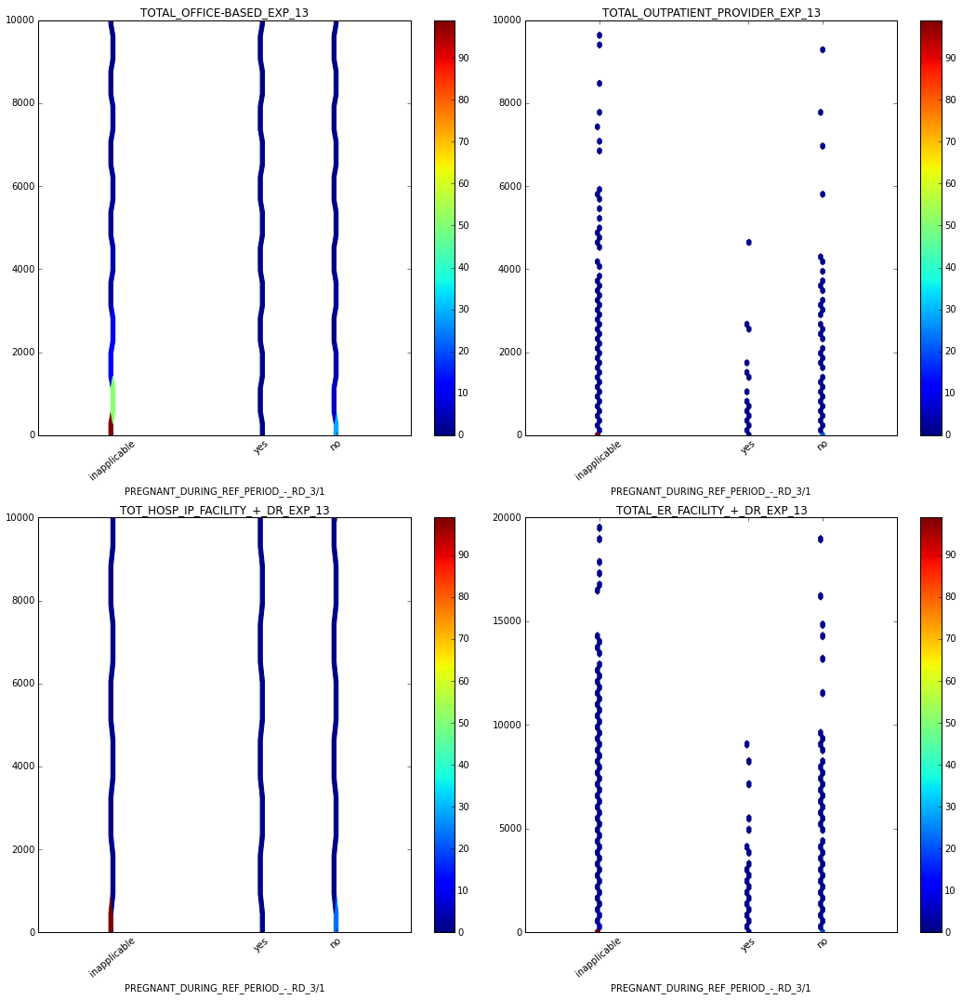

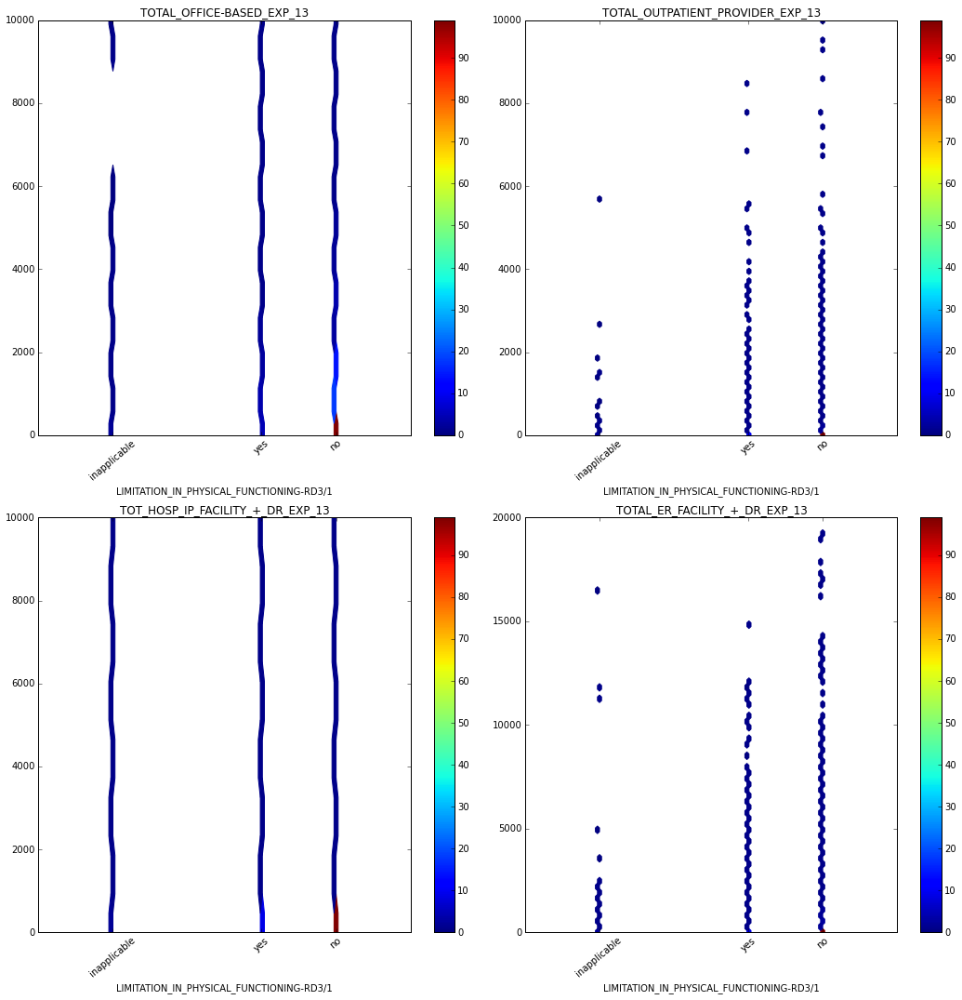

In [14]:
for term in other:
    x_min=data[term].min()
    x_max=data[term].max()
    x_range=[-2,3]

    four_correlations(data[term],
                      x_range=x_range,
                      w=data["FINAL_PERSON_WEIGHT_2013"],
                      xticks=[[-1,1,2],["inapplicable","yes","no"]],
                      office_range=[0,10000],
                      outpatient_range=[0,10000],
                      inpatient_range=[0,10000],
                      er_range=[0,20000],
                      colorbar=True,
                     )
    print("\n\n\n")

Conclusions:

1. Diagnoses of ADD/ADHD, limitations in physical functioning, and incidence of pregnancy drive spending on office services and inpatient services, while having a limited effect on the other two categories of spending, in which they are associated with thinner right tails.


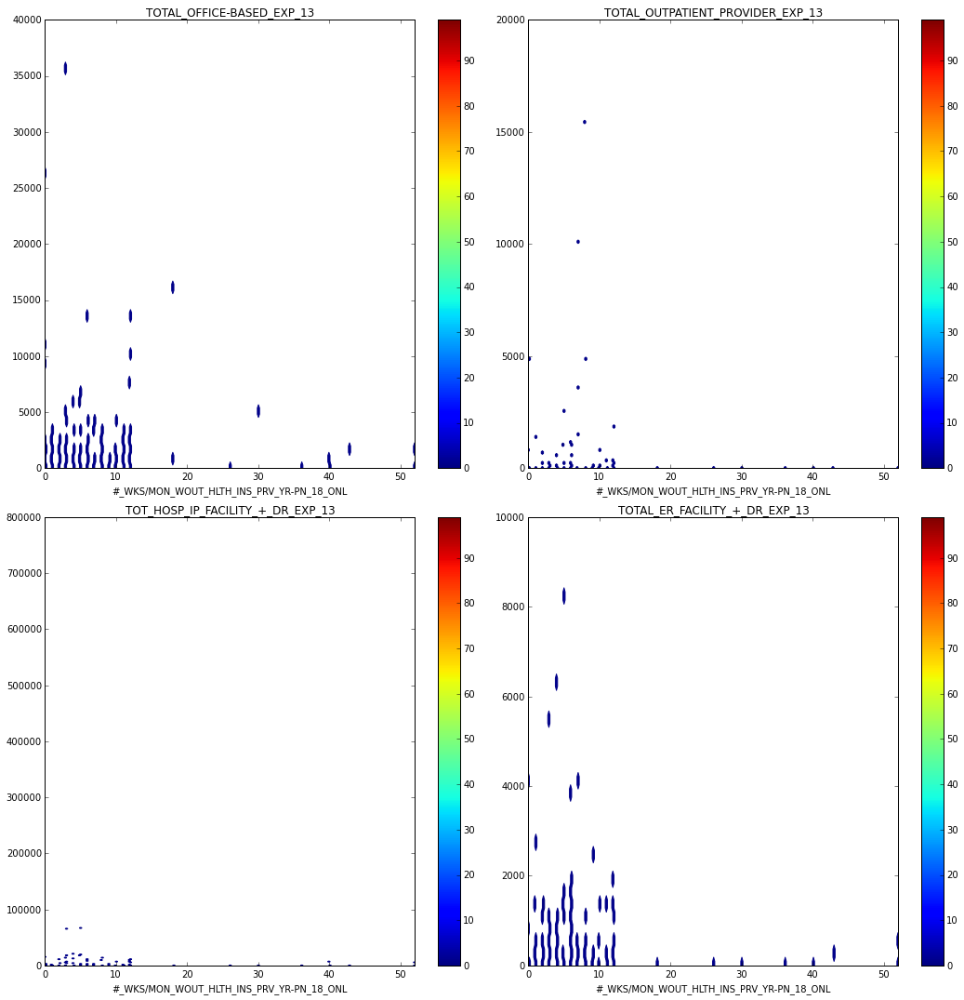

In [15]:
for term in durations:
    x_min=data[term].min()
    x_max=data[term].max()
    x_range=[0,52]

    four_correlations(data[term],
                      x_range=x_range,
                      w=data["FINAL_PERSON_WEIGHT_2013"],
                      #xticks=[[-1,1,2],["inapplicable","yes","no"]],
                      office_range=[0,40000],
                      outpatient_range=[0,20000],
                      inpatient_range=[0,800000],
                      er_range=[0,10000],
                      colorbar=True,
                     )
    print("\n\n\n")

Conclusion:

1. It doesn't look like spending is correlated with time elapsed without health insurance.

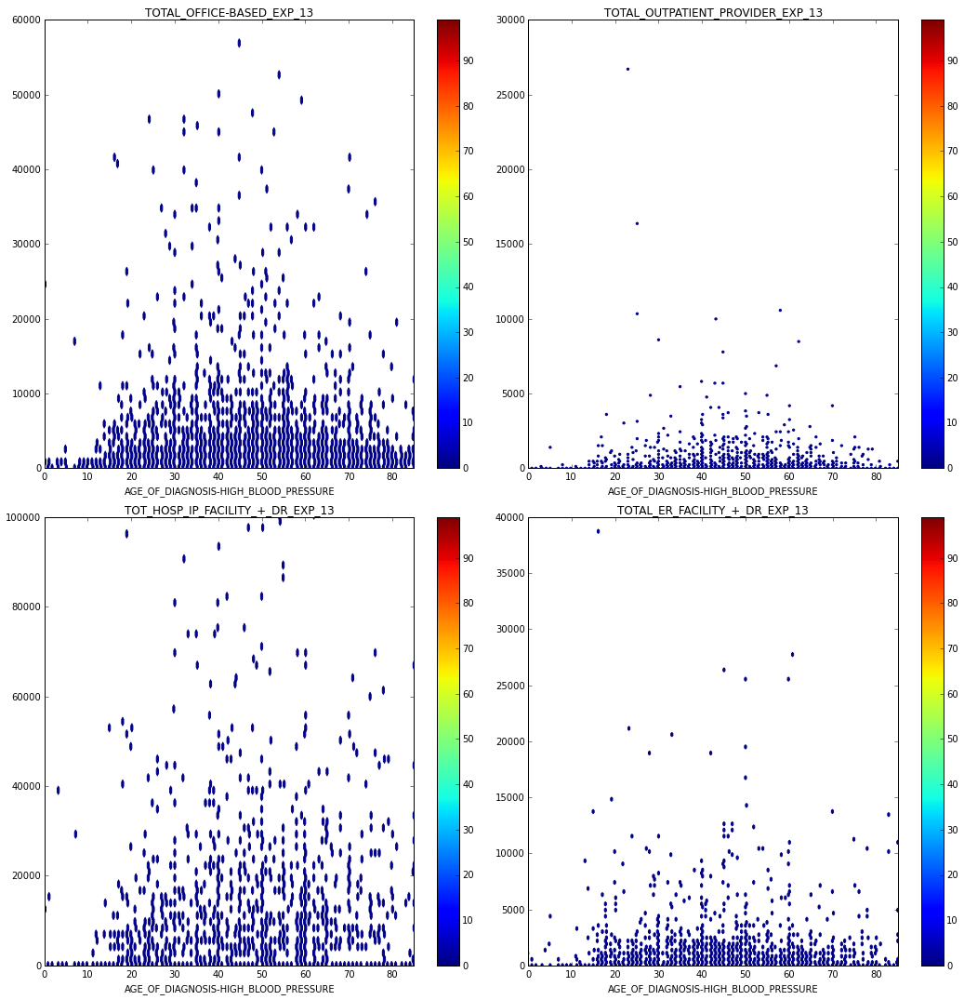

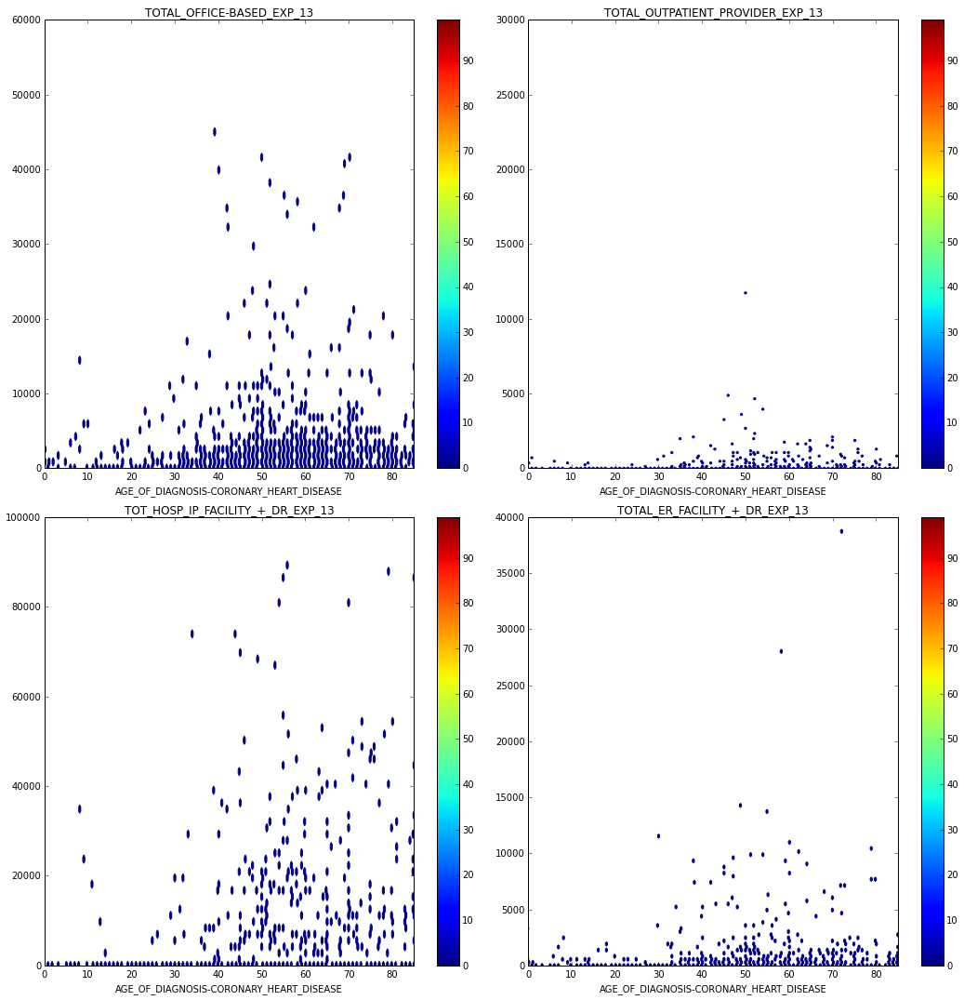

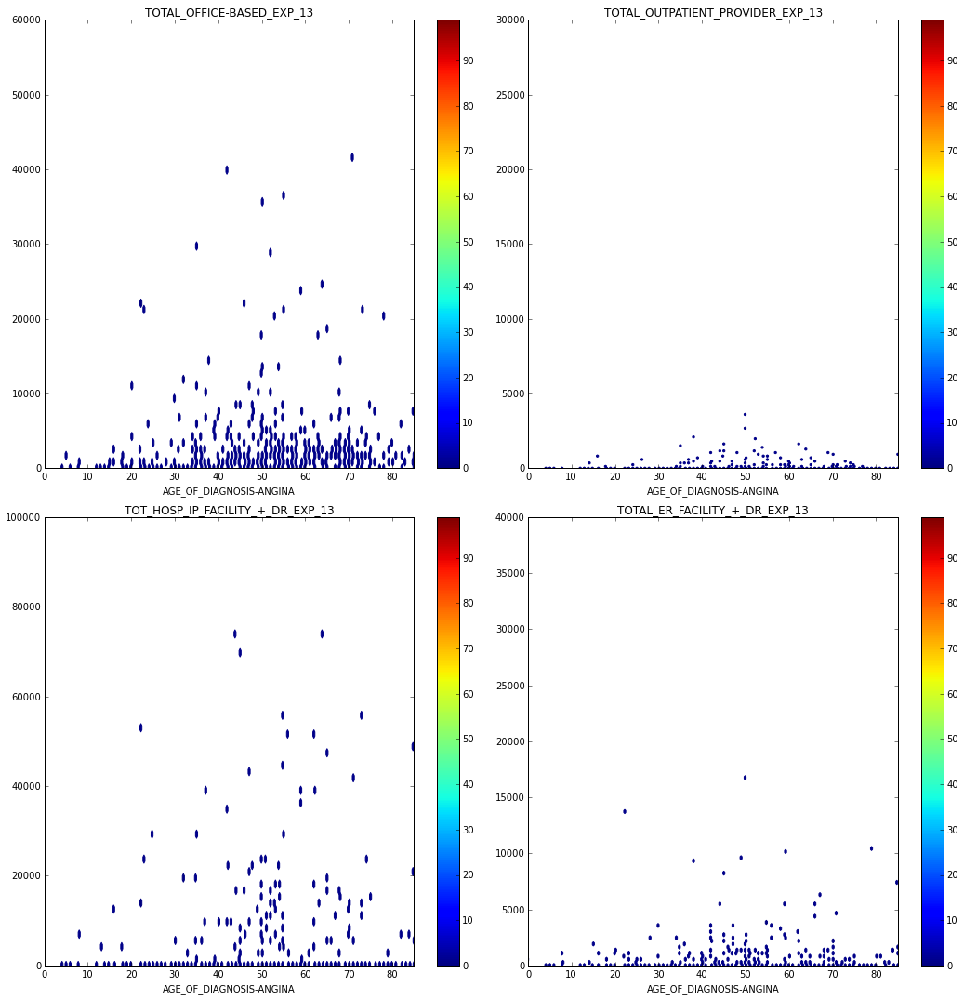

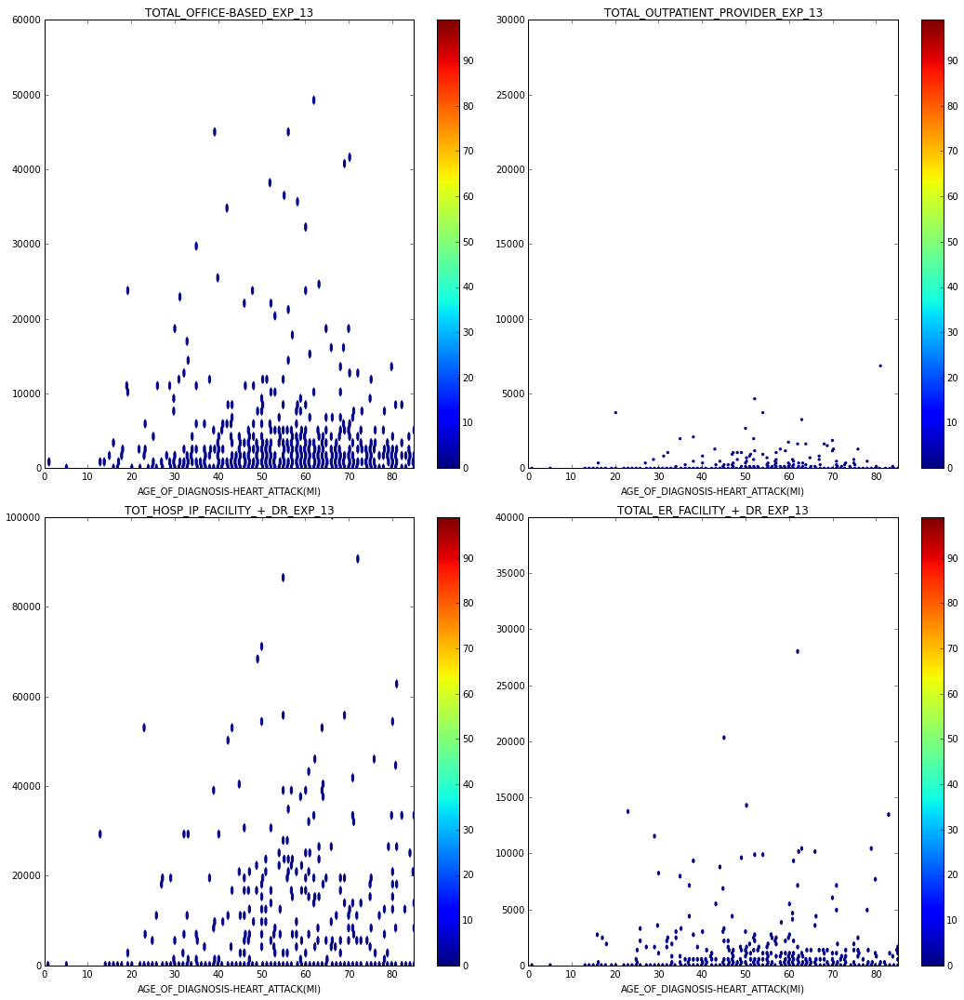

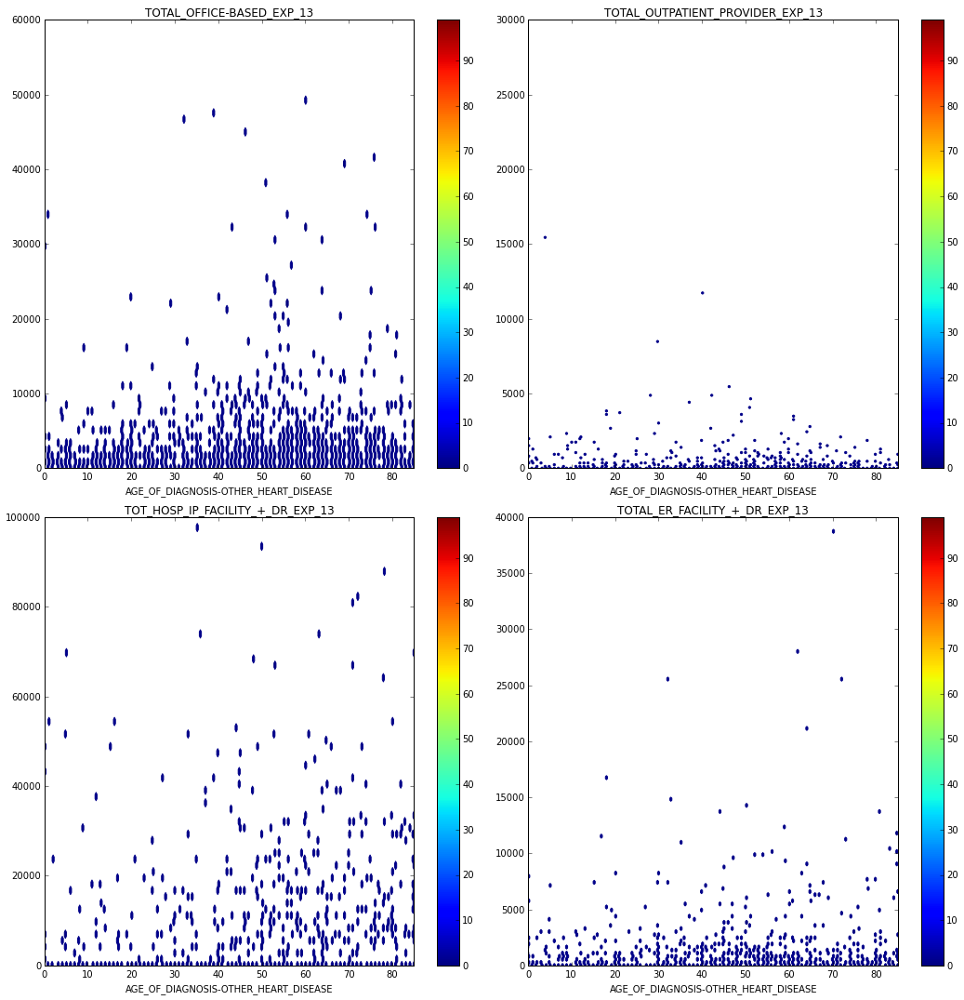

...

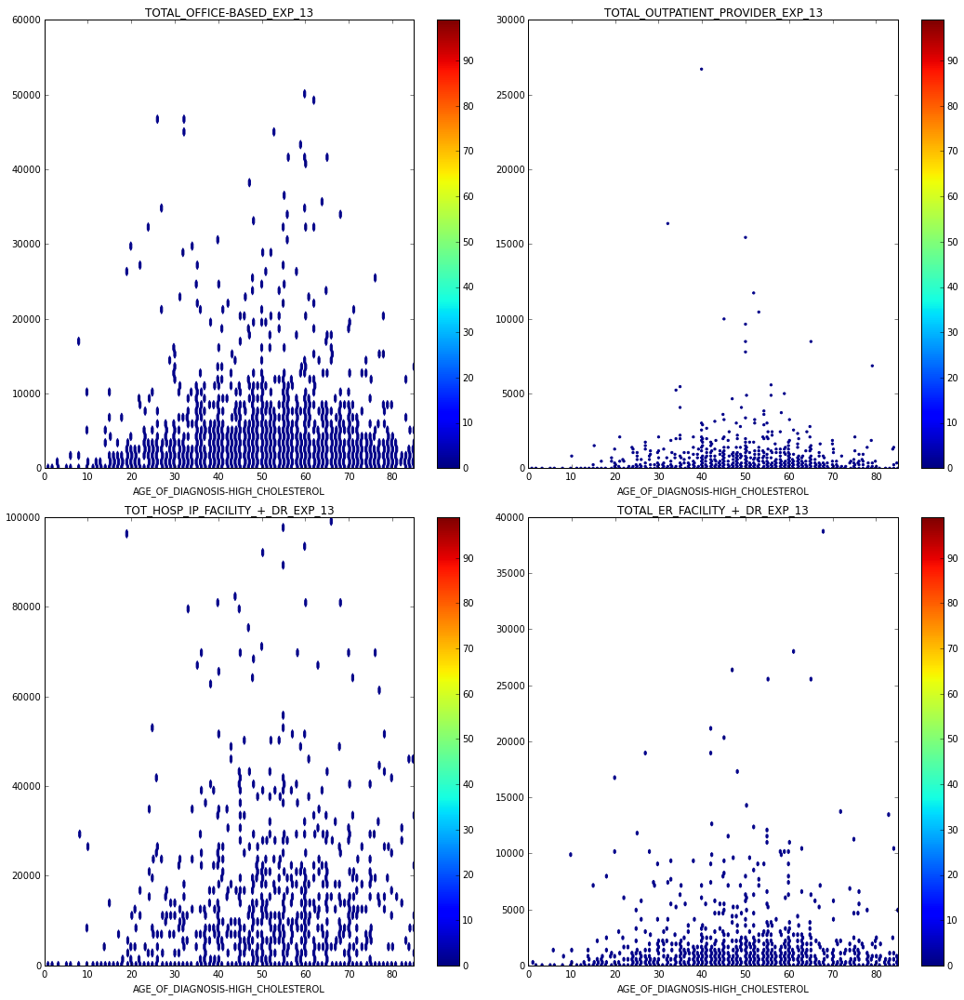

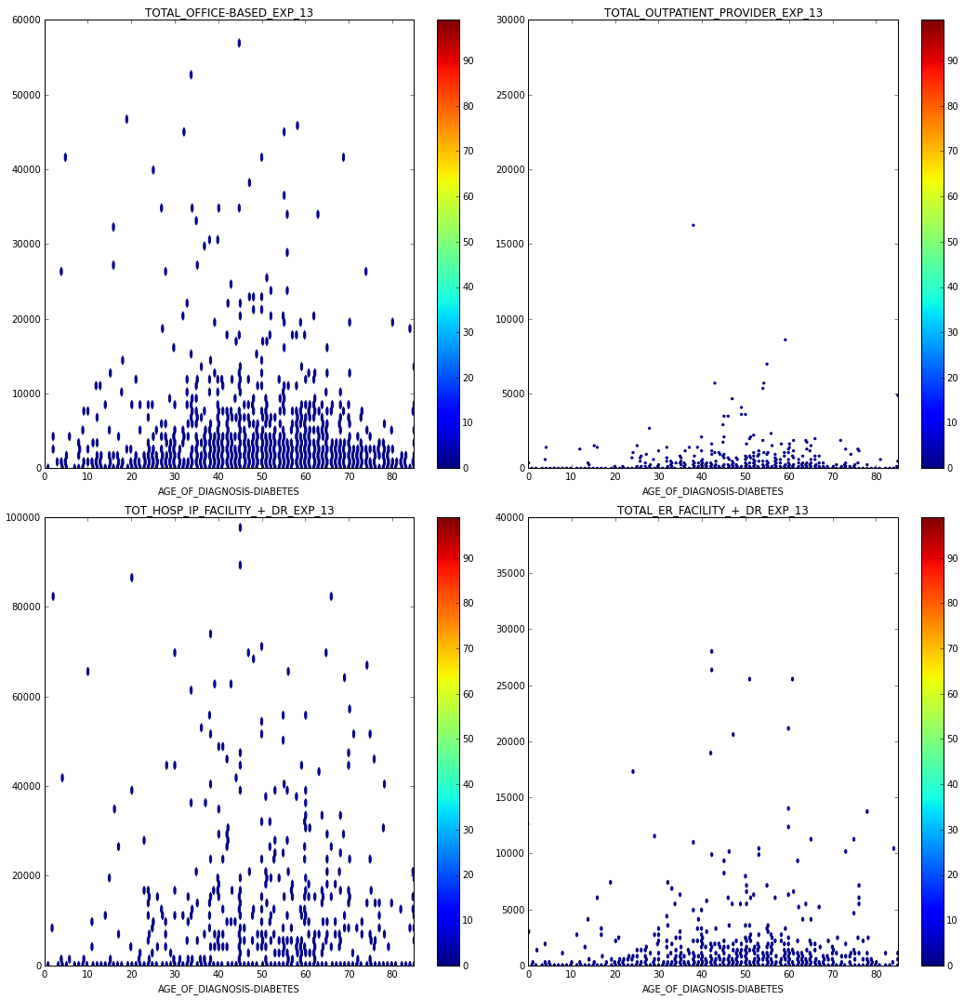

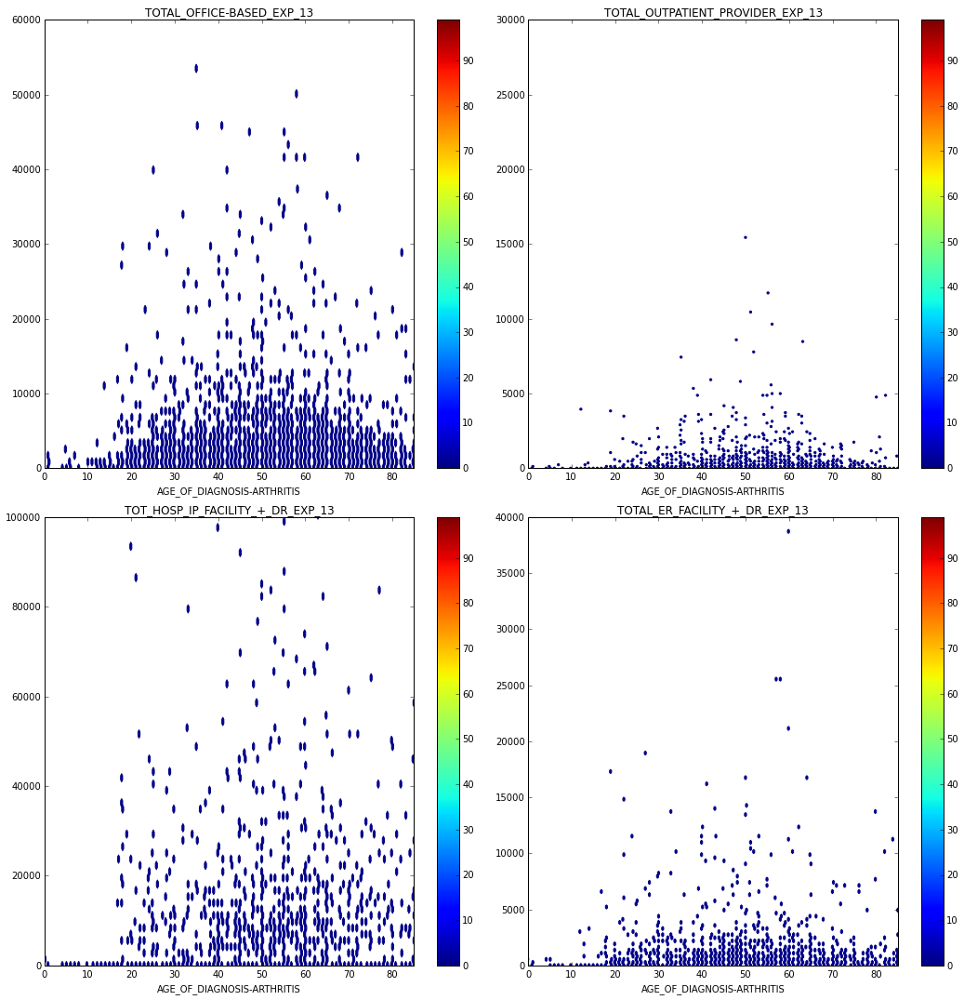

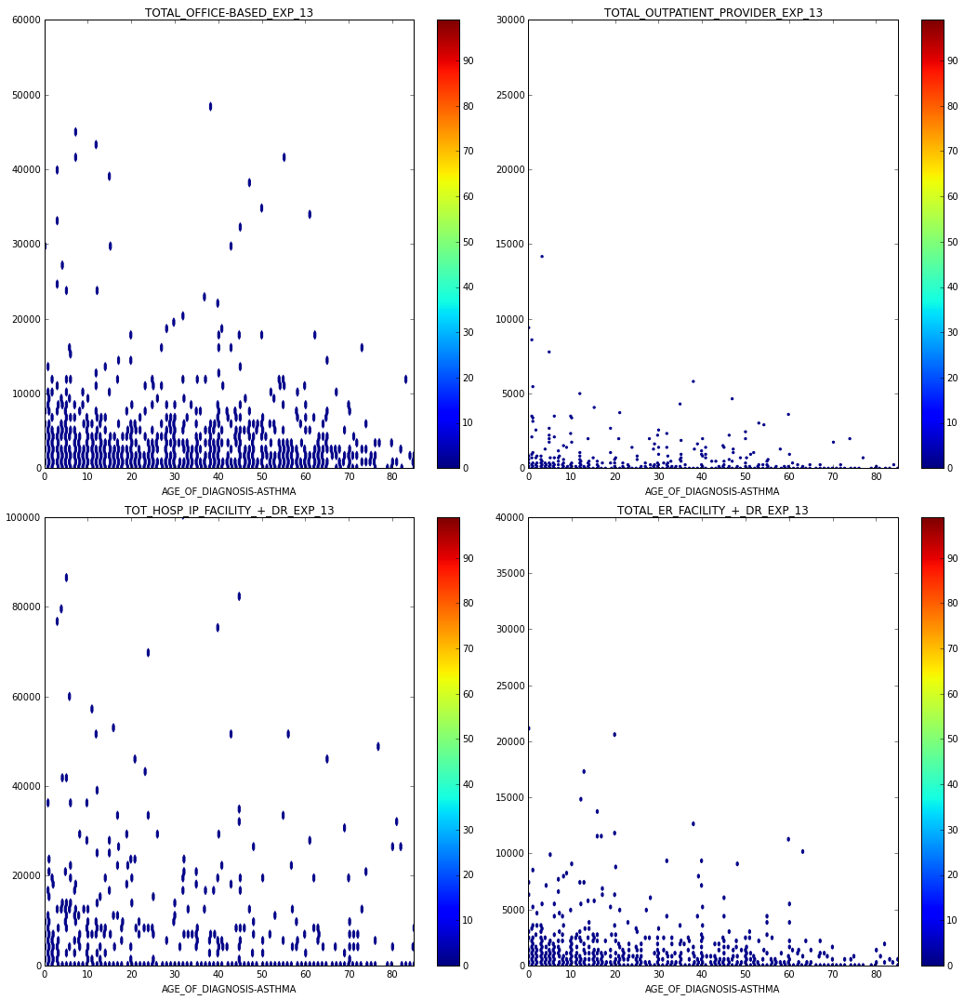

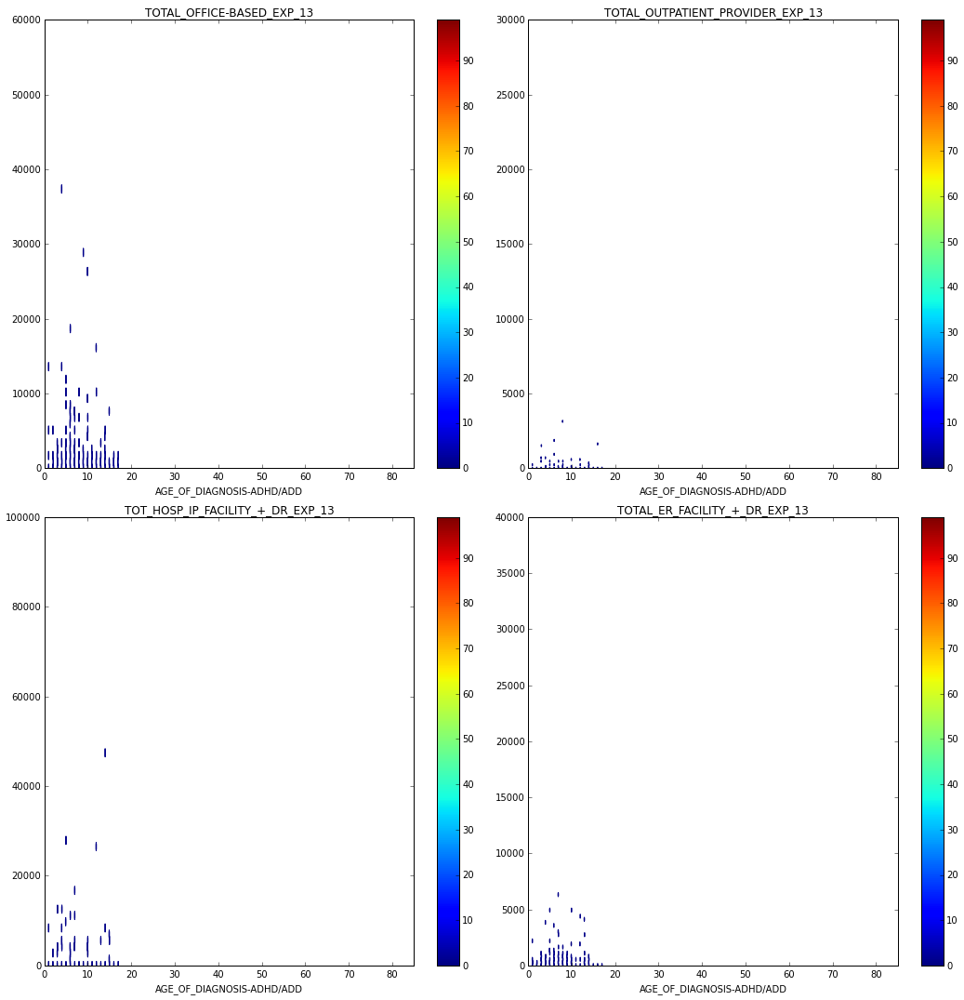

In [16]:
for term in age_diagnosed:
    x_min=data[term].min()
    x_max=data[term].max()
    x_range=[0,85]

    four_correlations(data[term],
                      x_range=x_range,
                      w=data["FINAL_PERSON_WEIGHT_2013"],
                      #xticks=[[-1,1,2],["inapplicable","yes","no"]],
                      office_range=[0,60000],
                      outpatient_range=[0,30000],
                      inpatient_range=[0,100000],
                      er_range=[0,40000],
                      colorbar=True,
                     )
    print("\n\n\n")

Conclusion: 

1. There doesn't seem to be a strong correlation between the age of diagnosis for any of these chronic conditions and annual spending on any category of healthcare.

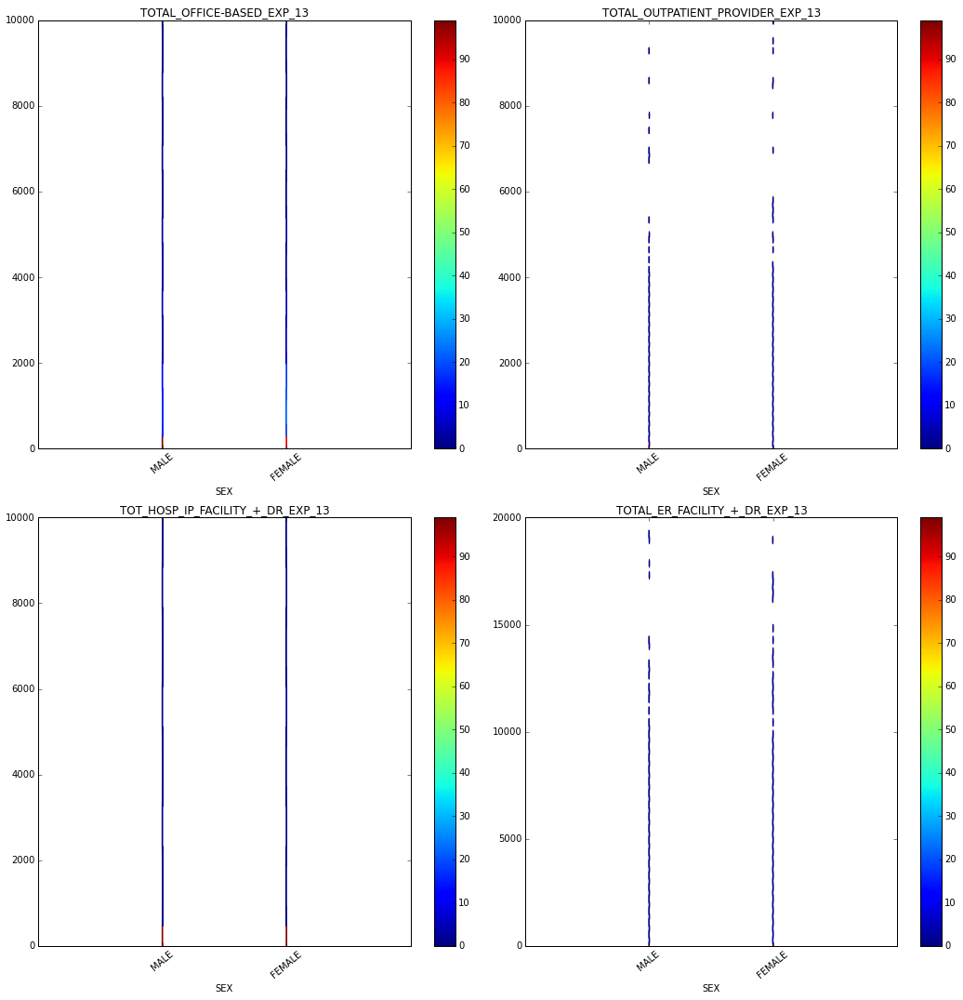

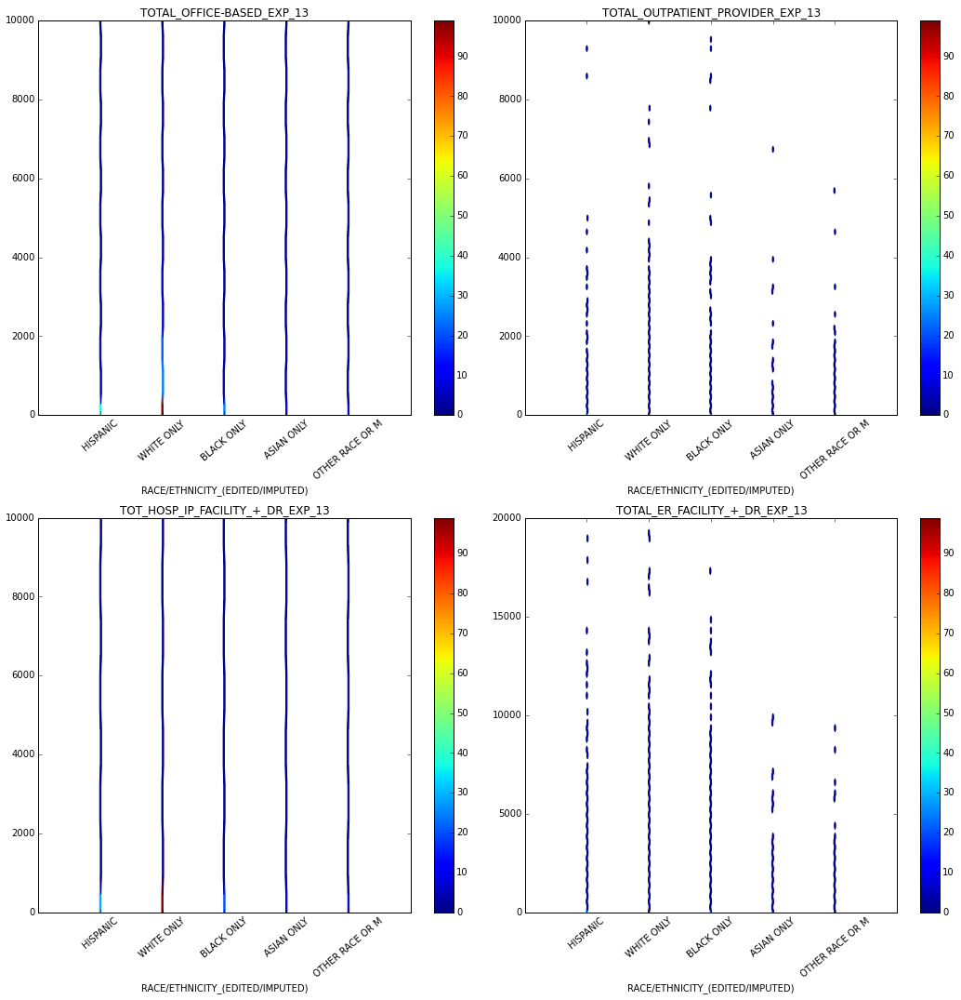

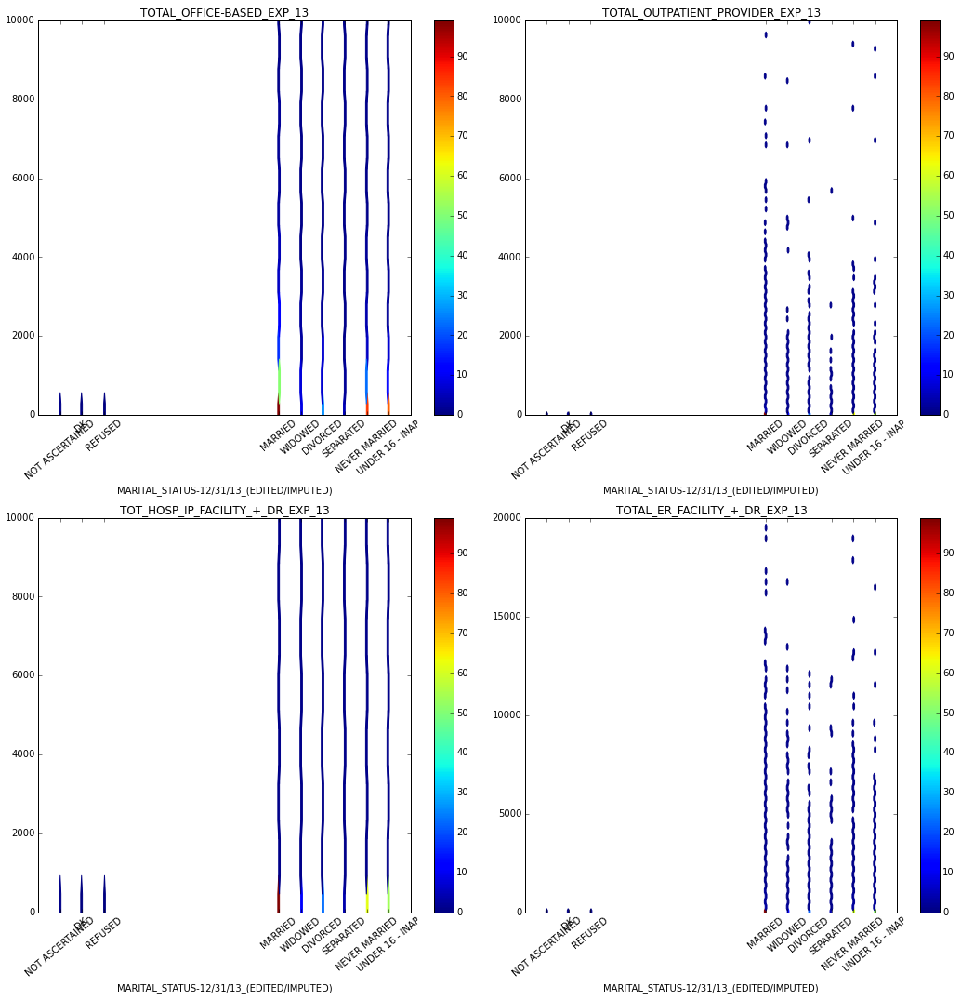

In [17]:
for term in demog:
    x_min=data[term].min()
    x_max=data[term].max()
    x_range=[x_min-1,x_max+1]
    d={term:[list(interpretation[term].keys()),list(interpretation[term].values())] for term in interpretation}
    d["categorical"]=[[-1,1,2],["inapplicable","yes","no"]]
    four_correlations(data[term],
                      x_range=x_range,
                      w=data["FINAL_PERSON_WEIGHT_2013"],
                      xticks=d[term] if term in interpretation else d["categorical"],
                      office_range=[0,10000],
                      outpatient_range=[0,10000],
                      inpatient_range=[0,10000],
                      er_range=[0,20000],
                      colorbar=True,
                     )
    print("\n\n\n")

Conclusions:

1. No features except insurance status generate significant differences in outpatient expenditure.
2. ER spending is affected by race, marital status, employment status, self-employment status, holding multiple jobs, union status, whether you are offered health insurance by your employer, your overall insurance status (notably whether you have private insurance or a public option), whether your household uses an FSA, where you live (notably, there is more zero clustering for ER spending in the South, and less in the Northeast), and educational attainment.
3. Both office and inpatient spending are affected by race, marital status, employment status, having more than one job, being self employed, union status, whether health insurance is offered through employment, whether public or private options for health insurance are used, whether FSA's are used, insurance status, census region, and educational attainment.

Finally, a look at whether body mass index affects spending:

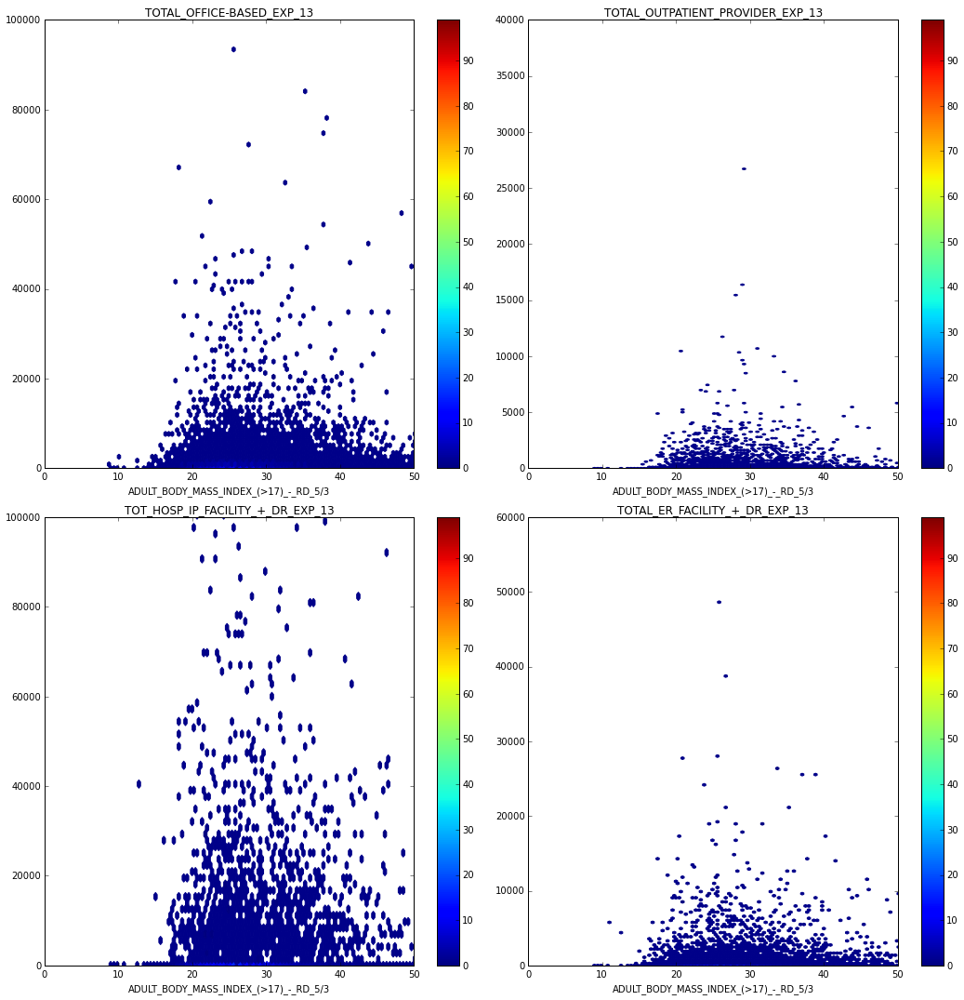

In [18]:
for term in bmi:
    x_min=data[term].min()
    x_max=data[term].max()
    x_range=[0,50]

    four_correlations(data[term],
                      x_range=x_range,
                      w=data["FINAL_PERSON_WEIGHT_2013"],
                      #xticks=[[-1,1,2],["inapplicable","yes","no"]],
                      office_range=[0,100000],
                      outpatient_range=[0,40000],
                      inpatient_range=[0,100000],
                      er_range=[0,60000],
                      colorbar=True,
                     )
    print("\n\n\n")

From looking at this, there doesn't seem to be a strong correlation between spending and BMI in any category. I find this somewhat counterintuitive, since obesity is supposed to be correlated with poor cardiovascular health. I'm inclined to leave this feature in to see if there are any interesting interaction effects that may turn up in the modeling process.

At this point, I've been able to look at correlations between the explanatory features and spending.

Something else I'd like to do before I move on to making modeling decisions is to examine the pairwise correlations between the explanatory features. Apart from giving me a better view of the dataset and patterns within, I find it useful to get a sense of which features provide "orthogonal" signal. This is generally useful in building models that are based on least squares optimization, since parameter estimates tend to exhibit poor precision in the presence of mutually correlated regressors. While this can often be mitigated by regularizing the objective function (for example, penalizing the objective function by a scalar multiple of the $L_1$ norm of the parameter vector will generally send "redundant" parameter estimates to zero), it's nice to know why this might be happening behind the scenes.



A problem to take care of before hand is that almost none of the categorical features are coded in a way where it makes sense to compute a raw correlation coefficient. For example, the levels here:

In [19]:
data["HIGH_CHOLESTEROL_DIAGNOSIS_(>17)"].unique()

array([ 2, -1,  1, -7, -9, -8])

don't correlate linearly with the severity of the high cholesterol condition.

To more accurately get a sense of the correlations between the properties measured by these categorical features, I'm going to create new dummy variables (that take values either 0 or 1) that correspond to these properties.

I'll do this by groups of predictors:

In [20]:
for term in health:
    data["%s_PLUS"%term]=data[term].map(lambda x: int(x==1))
    
healthplus=["%s_PLUS"%term for term in health]

data["SEX_MALE"]=data["SEX"].map(lambda x: int(x==1))
data["RACE_WHITE"]=data["RACE/ETHNICITY_(EDITED/IMPUTED)"].map(lambda x: int(x==2))
data["RACE_HISPANIC"]=data["RACE/ETHNICITY_(EDITED/IMPUTED)"].map(lambda x: int(x==1))
data["RACE_BLACK"]=data["RACE/ETHNICITY_(EDITED/IMPUTED)"].map(lambda x: int(x==3))
data["RACE_ASIAN"]=data["RACE/ETHNICITY_(EDITED/IMPUTED)"].map(lambda x: int(x==4))
data["RACE_OTHER_RACE"]=data["RACE/ETHNICITY_(EDITED/IMPUTED)"].map(lambda x: int(x==5))
data["MARITAL_MARRIED"]=data["MARITAL_STATUS-12/31/13_(EDITED/IMPUTED)"].map(lambda x: int(x==1))
data["MARITAL_WIDOWED"]=data["MARITAL_STATUS-12/31/13_(EDITED/IMPUTED)"].map(lambda x: int(x==2))
data["MARITAL_DIVORCED"]=data["MARITAL_STATUS-12/31/13_(EDITED/IMPUTED)"].map(lambda x: int(x==3))
data["MARITAL_SEPARATED"]=data["MARITAL_STATUS-12/31/13_(EDITED/IMPUTED)"].map(lambda x: int(x==4))
data["MARITAL_NEVER_MARRIED"]=data["MARITAL_STATUS-12/31/13_(EDITED/IMPUTED)"].map(lambda x: int(x==5))
data["MARITAL_MARRIAGE_INELIGIBLE"]=data["MARITAL_STATUS-12/31/13_(EDITED/IMPUTED)"].map(lambda x: int(x==6))

data["EDUCATION_PLUS"]=data["EDUCATION_RECODE_(EDITED)"].map(lambda x: 0  if x<1 else x)

demogplus=['SEX_MALE',
           'RACE_WHITE',
           'RACE_HISPANIC',
           'RACE_BLACK',
           'RACE_ASIAN',
           'RACE_OTHER_RACE',
           'MARITAL_MARRIED',
           'MARITAL_WIDOWED',
           'MARITAL_DIVORCED',
           'MARITAL_SEPARATED',
           'MARITAL_NEVER_MARRIED',
           'MARITAL_MARRIAGE_INELIGIBLE',
           'EDUCATION_PLUS']

employment=[term for term in categorical if "GROUP" in term or
            "UNION" in term or 
            "INSUR" in term or 
            "EMPLOYER" in term or
            "INSURANCE" in term or
            "PUBLIC_INS" in term or
            "COVERAGE" in term or
            "CHOICE" in term or
            "EMPLOYED" in term or
            "EMPLOYMENT" in term or
            "JOB" in term or
            False
 ]


for term in employment:
    if "GROUP" not in term or "INSURANCE_COVERAGE" not in term:
        data["%s_PLUS"%term]=data[term].map(lambda x: int(x==1))
        

employmentplus=['EMPLOYMENT_STATUS_RD_3/1_PLUS',
 'HAS_MORE_THAN_ONE_JOB_RD_3/1_INT_DATE_PLUS',
 'SELF-EMPLOYED_AT_RD_3/1_CMJ_PLUS',
 'CHOICE_OF_HEALTH_PLANS_AT_RD_3/1_CMJ_PLUS',
 'INDUSTRY_GROUP_RD_3/1_CMJ_PLUS',
 'UNION_STATUS_AT_RD_3/1_CMJ_PLUS',
 'OCCUPATION_GROUP_RD_3/1_CMJ_PLUS',
 'HEALTH_INSUR_HELD_FROM_RD_3/1_CMJ_(ED)_PLUS',
 'HEALTH_INSUR_OFFERED_BY_RD_3/1_CMJ_(ED)_PLUS',
 'EMPLOYER_OFFERS_HEALTH_INS_RD_3/1_CMJ_PLUS',
 'FULL_YEAR_INSURANCE_COVERAGE_STATUS_2013_PLUS',
 'PRIVATE_INSURANCE_ANY_TIME_IN_R5/R3_PLUS',
 'PUBLIC_INS_ANY_TIME_IN_R5/R3_PLUS',
 'INSURED_ANY_TIME_IN_R3/1_PLUS',
 'ANY_TIME_COVERAGE_BY_STATE_INS_-_R3/1_PLUS',
 'INDUSTRY_GROUP_RD_3/1_CMJ_NATURAL RESOURCES_PLUS',
 'INDUSTRY_GROUP_RD_3/1_CMJ_MINING_PLUS',
 'INDUSTRY_GROUP_RD_3/1_CMJ_CONSTRUCTION_PLUS',
 'INDUSTRY_GROUP_RD_3/1_CMJ_MANUFACTURING_PLUS',
 'INDUSTRY_GROUP_RD_3/1_CMJ_WHOLESALE AND RETAIL TRADE_PLUS',
 'INDUSTRY_GROUP_RD_3/1_CMJ_TRANSPORTATION AND UTILITIES_PLUS',
 'INDUSTRY_GROUP_RD_3/1_CMJ_INFORMATION_PLUS',
 'INDUSTRY_GROUP_RD_3/1_CMJ_FINANCIAL ACTIVITIES_PLUS',
 'INDUSTRY_GROUP_RD_3/1_CMJ_PROFESSIONAL AND BUSINESS SERVICES_PLUS',
 'INDUSTRY_GROUP_RD_3/1_CMJ_EDUCATION, HEALTH, AND SOCIAL SERVICES_PLUS',
 'INDUSTRY_GROUP_RD_3/1_CMJ_LEISURE AND HOSPITALITY_PLUS',
 'INDUSTRY_GROUP_RD_3/1_CMJ_OTHER SERVICES_PLUS',
 'INDUSTRY_GROUP_RD_3/1_CMJ_PUBLIC ADMINISTRATION_PLUS',
 'INDUSTRY_GROUP_RD_3/1_CMJ_MILITARY_PLUS',
 'INDUSTRY_GROUP_RD_3/1_CMJ_UNCLASSIFIABLE INDUSTRY_PLUS',
 'INDUSTRY_GROUP_RD_3/1_CMJ_NOT ASCERTAINED_PLUS',
 'INDUSTRY_GROUP_RD_3/1_CMJ_INAPPLICABLE_PLUS',
 'OCCUPATION_GROUP_RD_3/1_CMJ_MANAGEMENT, BUSINESS, AND FINANCIAL OPER_PLUS',
 'OCCUPATION_GROUP_RD_3/1_CMJ_PROFESSIONAL AND RELATED OCCUPATIONS_PLUS',
 'OCCUPATION_GROUP_RD_3/1_CMJ_SERVICE OCCUPATIONS_PLUS',
 'OCCUPATION_GROUP_RD_3/1_CMJ_SALES AND RELATED OCCUPATIONS_PLUS',
 'OCCUPATION_GROUP_RD_3/1_CMJ_OFFICE AND ADMINISTRATIVE SUPPORT_PLUS',
 'OCCUPATION_GROUP_RD_3/1_CMJ_FARMING, FISHING, AND FORESTRY_PLUS',
 'OCCUPATION_GROUP_RD_3/1_CMJ_CONSTRUCTION, EXTRACTION, AND MAINTENANC_PLUS',
 'OCCUPATION_GROUP_RD_3/1_CMJ_PRODUCTION, TRNSPORTATION, MATRL MOVING_PLUS',
 'OCCUPATION_GROUP_RD_3/1_CMJ_MILITARY SPECIFIC OCCUPATIONS_PLUS',
 'OCCUPATION_GROUP_RD_3/1_CMJ_UNCLASSIFIABLE OCCUPATION_PLUS',
 'OCCUPATION_GROUP_RD_3/1_CMJ_NOT ASCERTAINED_PLUS',
 'OCCUPATION_GROUP_RD_3/1_CMJ_INAPPLICABLE_PLUS',
 'FULL_YEAR_INSURANCE_COVERAGE_STATUS_2013_<65 ANY PRIVATE_PLUS',
 'FULL_YEAR_INSURANCE_COVERAGE_STATUS_2013_<65 PUBLIC ONLY_PLUS',
 'FULL_YEAR_INSURANCE_COVERAGE_STATUS_2013_<65 UNINSURED_PLUS',
 'FULL_YEAR_INSURANCE_COVERAGE_STATUS_2013_65+ EDITED MEDICARE ONLY_PLUS',
 'FULL_YEAR_INSURANCE_COVERAGE_STATUS_2013_65+ EDITED MEDICARE AND PRIVATE_PLUS',
 'FULL_YEAR_INSURANCE_COVERAGE_STATUS_2013_65+ EDITED MEDICARE AND OTH PUB ONLY_PLUS',
 'FULL_YEAR_INSURANCE_COVERAGE_STATUS_2013_65+ UNINSURED_PLUS',
 'FULL_YEAR_INSURANCE_COVERAGE_STATUS_2013_65+ NO MEDICARE AND ANY PUBLIC/PRIVATE_PLUS']



This should allow me to get a decent sense of the correlations within the explanatory variables (both within these groups and overall).

In [21]:
def corr_heatmap(x,weights,size=(25,25)):
    df=weightstats.DescrStatsW(x,weights=weights).corrcoef
    plt.figure(figsize=size)
    plt.pcolor(df)
    plt.yticks(np.arange(0.5, len(df), 1), x.columns)
    plt.xticks(np.arange(0.5, len(df), 1), x.columns, rotation=90)
    plt.xlim([0,len(df)])
    plt.ylim([0,len(df)])
    plt.colorbar()
    plt.show()

Here's a heatmap of the correlations between the health status variables.

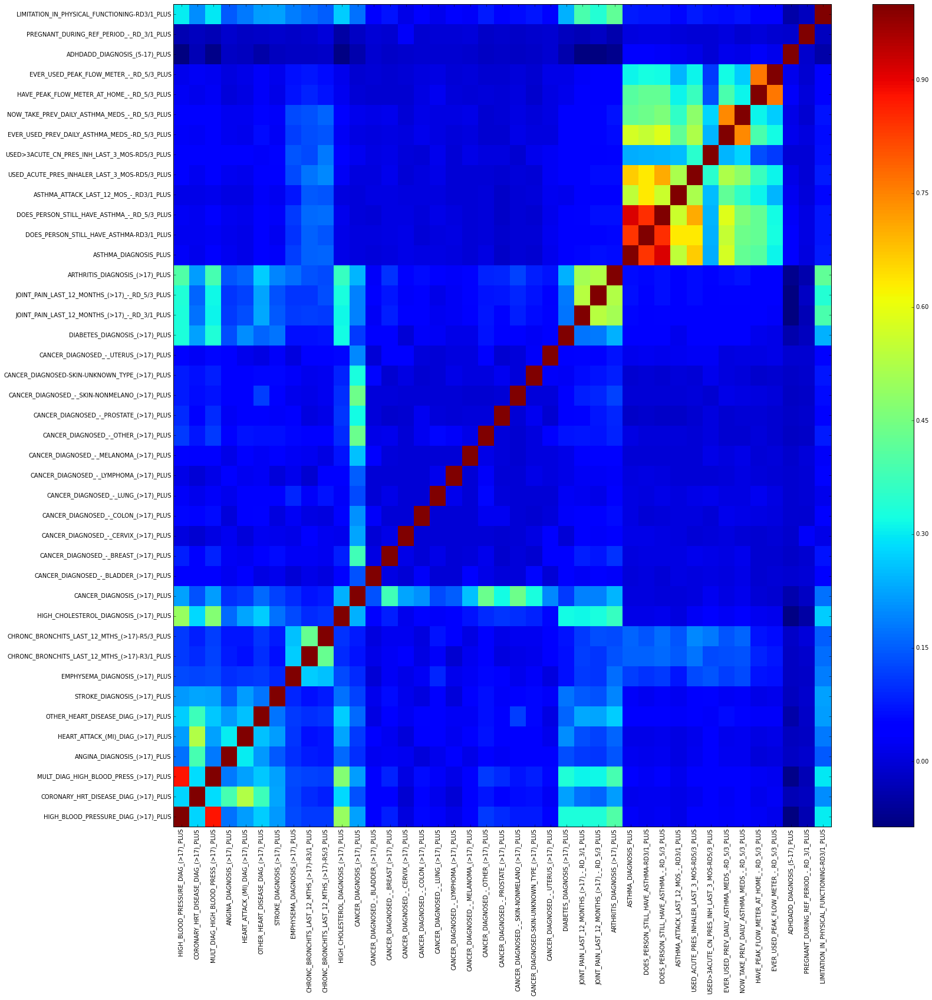

In [22]:
corr_heatmap(data[healthplus],weights=data["FINAL_PERSON_WEIGHT_2013"])

Conclusions:

1. The arthritis, joint pain, diabetes, limitations in physical functioning and heart health features are mutually correlated. Presumably this arises from comorbidities in advanced age.
2. The limitations in physical functioning feature is correlated with all chronic conditions ranging from cancer diagnosis to high cholesterol, bronchitis, high blood pressure and coronary heart disease.
3. High cholesterol is strongly correlated to the incidence of high blood pressure.

While there are more interesting facts to be gleaned from this heatmap, one thing that strikes me is that the limitations in physical functioning feature is correlated with most chronic conditions. This may be useful to include in a model as a controlling feature in order to reduce omitted variables bias and best tease out the individual contributions to spending of the distinct chronic conditions. As a quick check to see if this might be a problem, let's see if the limitations in physical functioning feature correlates with spending in even one category:

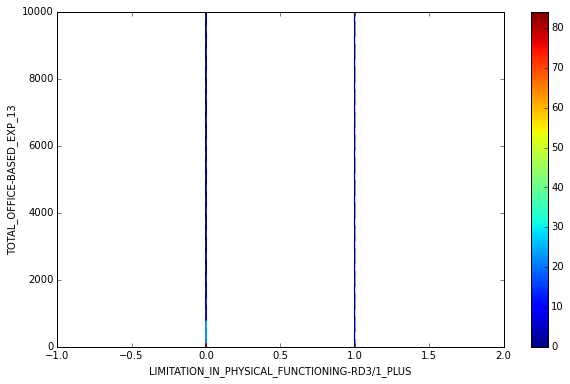

In [23]:
look_at_pairs(x=data["LIMITATION_IN_PHYSICAL_FUNCTIONING-RD3/1_PLUS"], 
              y=data["TOTAL_OFFICE-BASED_EXP_13"], 
              x_range=[-1,2], 
              y_range=[0,10000],
              w=data["FINAL_PERSON_WEIGHT_2013"],
              colorbar=True,
              gridsize=500,
              bins=85,
             )

While there's much less mass in the positive bucket, there seems to be much more zero clustering in the negative bucket. For the moment, I might suspect a possibility of introducing omitted variables bias if I were to leave out the limitations in physical functioning feature.

Next, here's how some of the demographic information correlates:

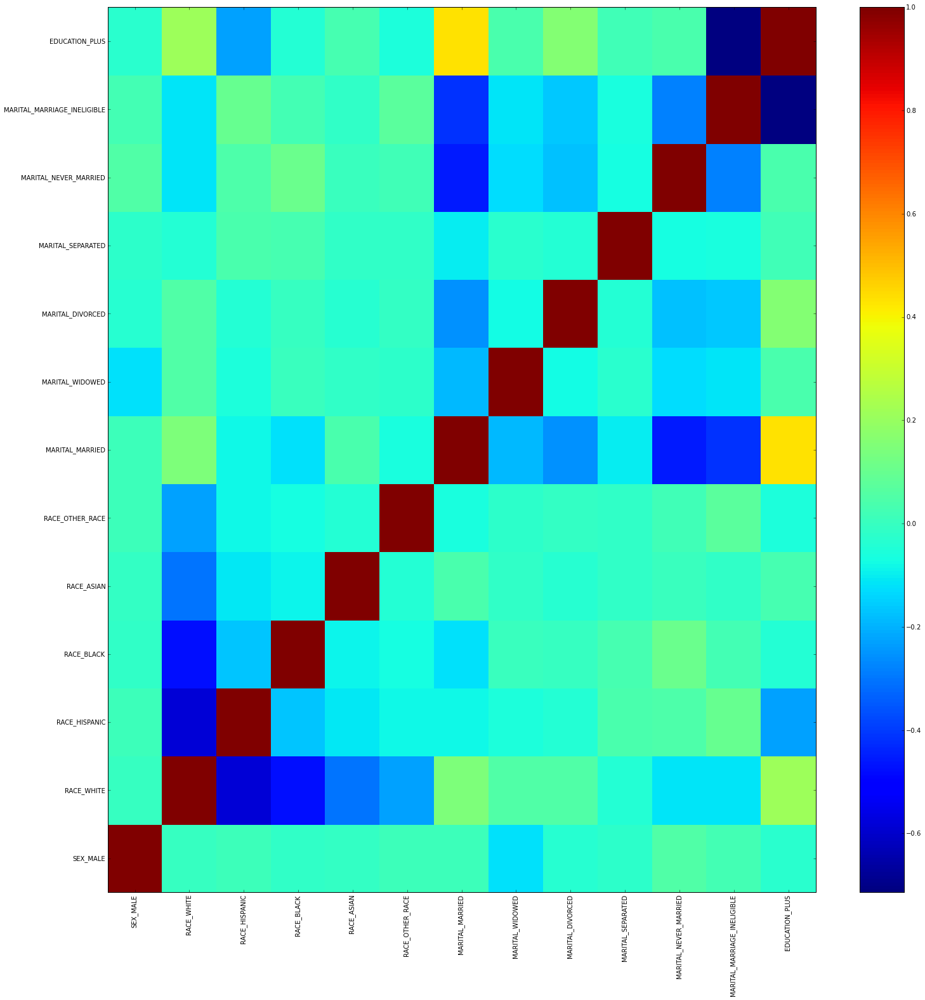

In [24]:
corr_heatmap(x=data[demogplus],weights=data["FINAL_PERSON_WEIGHT_2013"])

1. There's a natural block of negative correlation between the various race categories - most people self-identify with only one of these, so any self identification with one category reduces the level of self-identification with the others.
2. Being married seems to correlate with education level. Possibly this is just a consequence of greater age.

Let's look at the employment variables:

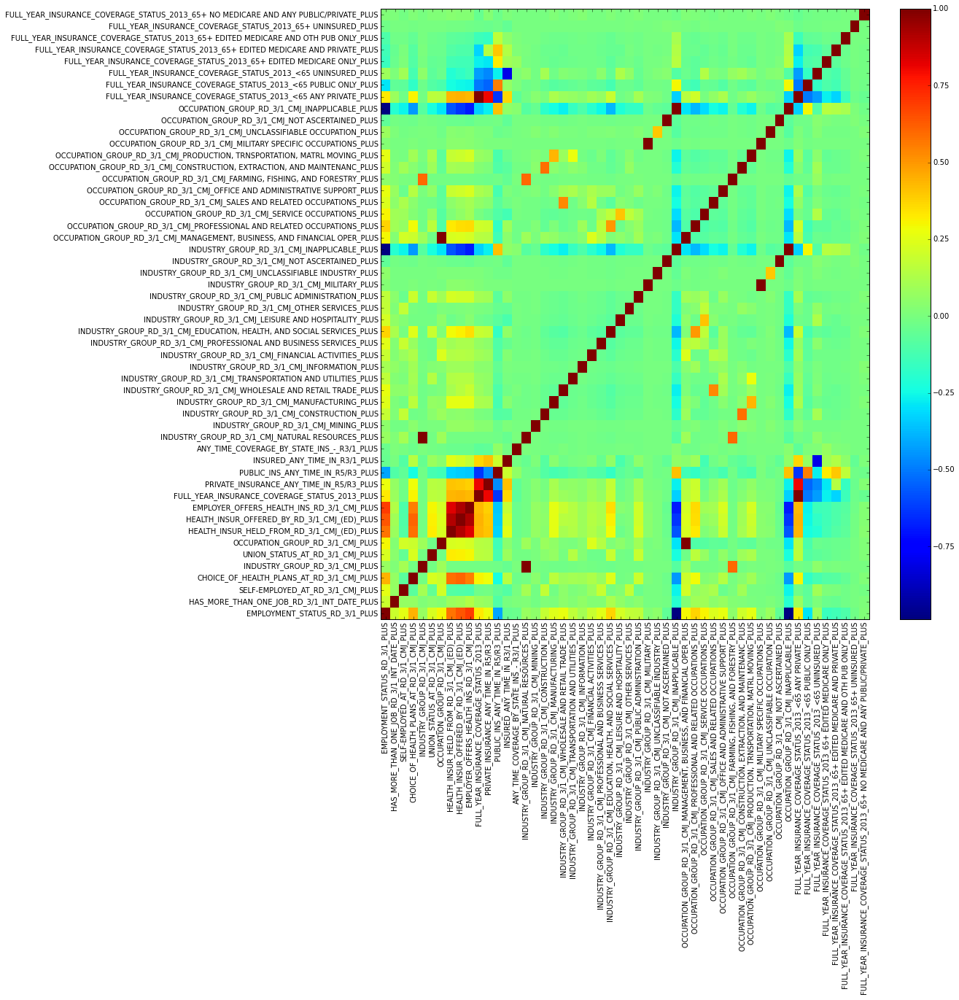

In [25]:
corr_heatmap(x=data[employmentplus],weights=data["FINAL_PERSON_WEIGHT_2013"],size=(15,15))

Conclusions:

1. The occupation sectors most likely to offer health insurance seem to be education/health/social services and manufacturing.
2. People whose employers offer health insurance are most likely to be insured for the whole year.
3. People who have private insurance are likely to have it for the whole year.


Next, a look at what we get if we toss in employment, demographic and health variables into one heatmap:

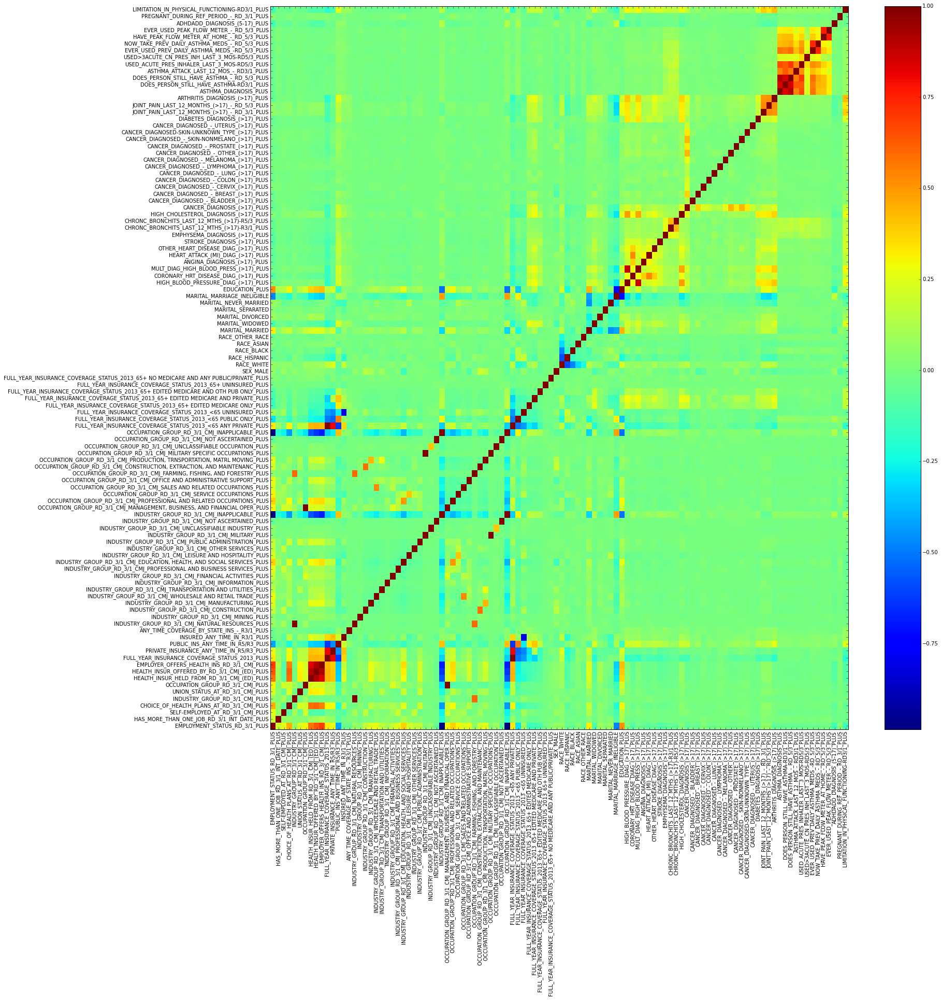

In [26]:
corr_heatmap(x=data[employmentplus+demogplus+healthplus],weights=data["FINAL_PERSON_WEIGHT_2013"],size=(25,25))

This plot is quite rich in detail. Some conclusions:

1. Higher educational attainment correlates with employers offering health insurance.
2. High blood pressure, arthritis and heart disease correlate with being on public insurance. Age is likely the intermediating factor.
3. Professional, health/social/education, management/business/financial and manufacturing occupations tend to offer employer insurance.
4. Higher educational attainment correlates with likelihood of being employed.

Finally, a quick look at correlations between diagnosis ages for chronic conditions:

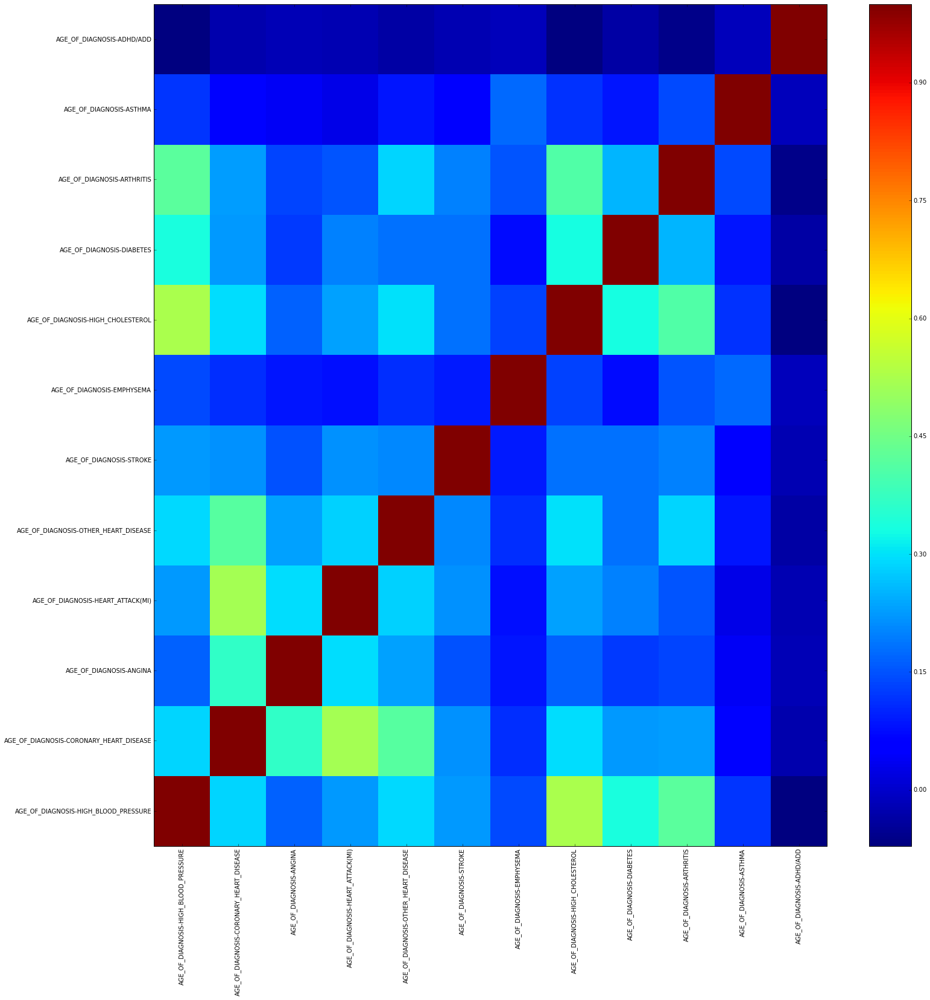

In [27]:
corr_heatmap(x=data[age_diagnosed],weights=data["FINAL_PERSON_WEIGHT_2013"],size=(25,25))

Conclusions:

1. The age of diagnosis for each pair of (high cholesterol, high blood pressure), (high cholesterol, arthritis) and (heart attack, coronoary heart disease) are positively correlated.

To conclude this part, I've learned something about the structure of the explanatory features, and what it will mean for the design matrix in my model. Also, I think heatmaps are a really nice visualization tool.

At this point I have a better view of the data, and a sense of what features I can expect to be predictive. This is a decent foundation for a pretty rich modeling exercise.

In the next post, I'll write about the model selection process.